In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import datetime
%matplotlib inline

In [2]:
n_sensors=16

In [3]:
x = np.linspace(0, 1, 101)
y = np.linspace(0, 1, 101)

In [4]:
t = np.linspace(0, 1, 41)

In [5]:
xrange = np.linspace(0, 1, 101)
yrange = np.linspace(0, 1, 101)
xmesh, ymesh = np.meshgrid(xrange, yrange)

In [6]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

$$ f_1(x, y, t) = e^{-t}(cos2\pi xcos2\pi y + sin2\pi xsin2\pi y) $$
$$ f_2(x, y, t) = x + y + t $$
$$ f_3(x, y, t) = e^{-t}(2sin2\pi x + sin2\pi xcos2\pi y) $$

Case 1: f1

In [7]:
out1 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out1[i, j, k] = np.exp(-t[i])*(np.cos(2*np.pi*x[j])*np.cos(2*np.pi*y[k])
                                           + np.sin(2*np.pi*x[j])*np.sin(2*np.pi*y[k]))

In [8]:
out1[0, :, :]

array([[1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ],
       [0.99802673, 1.        , 0.99802673, ..., 0.98228725, 0.9921147 ,
        0.99802673],
       [0.9921147 , 0.99802673, 1.        , ..., 0.96858316, 0.98228725,
        0.9921147 ],
       ...,
       [0.9921147 , 0.98228725, 0.96858316, ..., 1.        , 0.99802673,
        0.9921147 ],
       [0.99802673, 0.9921147 , 0.98228725, ..., 0.99802673, 1.        ,
        0.99802673],
       [1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ]])

In [9]:
sensor1 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor1[i, j, k] = out1[i, 20*(j+1)+1, 20*(k+1)+1]

In [10]:
sensor1.shape

(41, 4, 4)

In [11]:
sensor1 = sensor1.reshape(41, 16, 1)

In [12]:
sensor1.shape

(41, 16, 1)

In [13]:
x_train1, x_test1, y_train1, y_test1, t_train, t_test = train_test_split(sensor1, out1, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [14]:
t_train

array([[0.725],
       [0.15 ],
       [0.65 ],
       [0.3  ],
       [0.425],
       [0.225],
       [0.375],
       [0.8  ],
       [0.4  ],
       [0.875],
       [0.85 ],
       [0.   ],
       [0.675],
       [0.125],
       [0.275],
       [0.025],
       [0.75 ],
       [0.525],
       [0.05 ],
       [0.775],
       [0.925],
       [0.075],
       [0.9  ],
       [0.575],
       [0.825],
       [0.25 ],
       [0.55 ],
       [0.45 ],
       [0.5  ],
       [0.175],
       [0.35 ],
       [0.7  ],
       [0.95 ]])

In [15]:
x_train1

array([[[ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457]],

       [[ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798]],

       [[ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
       

In [16]:
x_test1

array([[[ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164]],

       [[ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735]],

       [[ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
       

In [17]:
input_time = tf.keras.Input(shape=(1))
reshape = tf.keras.layers.Reshape((1,))(input_time)

x_ = tf.keras.layers.Dense(units=8, activation='relu', name='firstHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=64, activation='relu', name='secondHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=32, activation='relu', name='thirdHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=16, activation=None, name='outputLayerSensor')(x_)
output_sensor = tf.keras.layers.Reshape((16, 1))(output_data)
# MLP
sensor_pred1 = tf.keras.Model(input_time, output_sensor)
sensor_pred2 = tf.keras.Model(input_time, output_sensor)
sensor_pred3 = tf.keras.Model(input_time, output_sensor)

In [18]:
sensor_pred1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 reshape (Reshape)           (None, 1)                 0         
                                                                 
 firstHiddenLayerSensor (Den  (None, 8)                16        
 se)                                                             
                                                                 
 batch_normalization (BatchN  (None, 8)                32        
 ormalization)                                                   
                                                                 
 secondHiddenLayerSensor (De  (None, 64)               576       
 nse)                                                            
                                                             

In [19]:
sensor_pred1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [20]:
start1 = datetime.datetime.now()
history1 = sensor_pred1.fit(t_train, x_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 16ms/step - loss: 1.5449 - rmse: 1.2199
Epoch 2/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4934 - rmse: 1.1986
Epoch 3/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4650 - rmse: 1.1868
Epoch 4/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4360 - rmse: 1.1745
Epoch 5/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4105 - rmse: 1.1636
Epoch 6/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3880 - rmse: 1.1539
Epoch 7/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3661 - rmse: 1.1444
Epoch 8/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3439 - rmse: 1.1346
Epoch 9/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3203 - rmse: 1.1242
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3028 - rmse: 1.1164
Epoch 11/10000
2/2 [============================

2/2 [==============================] - 0s 6ms/step - loss: 0.4500 - rmse: 0.6288
Epoch 87/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4438 - rmse: 0.6238
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4420 - rmse: 0.6224
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4371 - rmse: 0.6185
Epoch 90/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4317 - rmse: 0.6142
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4262 - rmse: 0.6096
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4225 - rmse: 0.6067
Epoch 93/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4218 - rmse: 0.6061
Epoch 94/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4197 - rmse: 0.6043
Epoch 95/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4169 - rmse: 0.6021
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 0.2679 - rmse: 0.4637
Epoch 171/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2654 - rmse: 0.4612
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2651 - rmse: 0.4608
Epoch 173/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2633 - rmse: 0.4589
Epoch 174/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2633 - rmse: 0.4588
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2611 - rmse: 0.4565
Epoch 176/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2608 - rmse: 0.4562
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2602 - rmse: 0.4555
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2581 - rmse: 0.4533
Epoch 179/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2584 - rmse: 0.4536
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 11ms/step - loss: 0.2076 - rmse: 0.3957
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2076 - rmse: 0.3957
Epoch 256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2072 - rmse: 0.3952
Epoch 257/10000
2/2 [==============================] - 0s 27ms/step - loss: 0.2065 - rmse: 0.3944
Epoch 258/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2053 - rmse: 0.3929
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2050 - rmse: 0.3926
Epoch 260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2046 - rmse: 0.3920
Epoch 261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2047 - rmse: 0.3922
Epoch 262/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2033 - rmse: 0.3904
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2054 - rmse: 0.3931
Epoch 264/10000
2/2 [====================

2/2 [==============================] - 0s 9ms/step - loss: 0.1677 - rmse: 0.3441
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1666 - rmse: 0.3426
Epoch 340/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1690 - rmse: 0.3460
Epoch 341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1664 - rmse: 0.3423
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1665 - rmse: 0.3424
Epoch 343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1650 - rmse: 0.3404
Epoch 344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1675 - rmse: 0.3441
Epoch 345/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1647 - rmse: 0.3400
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1638 - rmse: 0.3386
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1633 - rmse: 0.3379
Epoch 348/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 0.1367 - rmse: 0.2985
Epoch 423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1364 - rmse: 0.2980
Epoch 424/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1377 - rmse: 0.3003
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1356 - rmse: 0.2967
Epoch 426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1356 - rmse: 0.2968
Epoch 427/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1348 - rmse: 0.2955
Epoch 428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1347 - rmse: 0.2954
Epoch 429/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1344 - rmse: 0.2949
Epoch 430/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1348 - rmse: 0.2956
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1338 - rmse: 0.2940
Epoch 432/10000
2/2 [===================

2/2 [==============================] - 0s 12ms/step - loss: 0.1111 - rmse: 0.2553
Epoch 507/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1113 - rmse: 0.2557
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1118 - rmse: 0.2568
Epoch 509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1110 - rmse: 0.2551
Epoch 510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1106 - rmse: 0.2543
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1104 - rmse: 0.2540
Epoch 512/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1097 - rmse: 0.2527
Epoch 513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1114 - rmse: 0.2560
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1097 - rmse: 0.2527
Epoch 515/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1089 - rmse: 0.2513
Epoch 516/10000
2/2 [==================

2/2 [==============================] - 0s 11ms/step - loss: 0.0896 - rmse: 0.2127
Epoch 591/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0900 - rmse: 0.2137
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0889 - rmse: 0.2112
Epoch 593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0897 - rmse: 0.2131
Epoch 594/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0888 - rmse: 0.2109
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0905 - rmse: 0.2150
Epoch 596/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0889 - rmse: 0.2113
Epoch 597/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0878 - rmse: 0.2087
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0880 - rmse: 0.2092
Epoch 599/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0884 - rmse: 0.2102
Epoch 600/10000
2/2 [==================

2/2 [==============================] - 0s 12ms/step - loss: 0.0726 - rmse: 0.1723
Epoch 675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0725 - rmse: 0.1723
Epoch 676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0719 - rmse: 0.1704
Epoch 677/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0730 - rmse: 0.1738
Epoch 678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0716 - rmse: 0.1698
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0724 - rmse: 0.1721
Epoch 680/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0725 - rmse: 0.1724
Epoch 681/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0718 - rmse: 0.1705
Epoch 682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0717 - rmse: 0.1702
Epoch 683/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0717 - rmse: 0.1704
Epoch 684/10000
2/2 [==================

2/2 [==============================] - 0s 8ms/step - loss: 0.0611 - rmse: 0.1401
Epoch 759/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0606 - rmse: 0.1387
Epoch 760/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0604 - rmse: 0.1379
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0614 - rmse: 0.1415
Epoch 762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0609 - rmse: 0.1397
Epoch 763/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0605 - rmse: 0.1386
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0607 - rmse: 0.1392
Epoch 765/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0595 - rmse: 0.1350
Epoch 766/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0618 - rmse: 0.1432
Epoch 767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0592 - rmse: 0.1339
Epoch 768/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 0.0510 - rmse: 0.1050
Epoch 843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0521 - rmse: 0.1100
Epoch 844/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0507 - rmse: 0.1037
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0513 - rmse: 0.1066
Epoch 846/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0508 - rmse: 0.1043
Epoch 847/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0511 - rmse: 0.1057
Epoch 848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0503 - rmse: 0.1019
Epoch 849/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0517 - rmse: 0.1088
Epoch 850/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0508 - rmse: 0.1043
Epoch 851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0506 - rmse: 0.1035
Epoch 852/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 0.0451 - rmse: 0.0804
Epoch 927/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0464 - rmse: 0.0878
Epoch 928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0451 - rmse: 0.0801
Epoch 929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0451 - rmse: 0.0807
Epoch 930/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0466 - rmse: 0.0895
Epoch 931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0451 - rmse: 0.0806
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0465 - rmse: 0.0887
Epoch 933/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0454 - rmse: 0.0826
Epoch 934/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0449 - rmse: 0.0796
Epoch 935/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0454 - rmse: 0.0827
Epoch 936/10000
2/2 [===================

Epoch 1010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0415 - rmse: 0.0637
Epoch 1011/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0430 - rmse: 0.0746
Epoch 1012/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0426 - rmse: 0.0720
Epoch 1013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0418 - rmse: 0.0664
Epoch 1014/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0418 - rmse: 0.0669
Epoch 1015/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0421 - rmse: 0.0690
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0418 - rmse: 0.0668
Epoch 1017/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0410 - rmse: 0.0604
Epoch 1018/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0432 - rmse: 0.0771
Epoch 1019/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0417 - rmse: 0.0665
Epoch 1020/100

2/2 [==============================] - 0s 12ms/step - loss: 0.0393 - rmse: 0.0560
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0393 - rmse: 0.0556
Epoch 1095/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0395 - rmse: 0.0578
Epoch 1096/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0390 - rmse: 0.0528
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0394 - rmse: 0.0568
Epoch 1098/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0400 - rmse: 0.0617
Epoch 1099/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0407 - rmse: 0.0678
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0397 - rmse: 0.0602
Epoch 1101/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0413 - rmse: 0.0721
Epoch 1102/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0399 - rmse: 0.0613
Epoch 1103/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0375 - rmse: 0.0489
Epoch 1177/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0374 - rmse: 0.0480
Epoch 1178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0372 - rmse: 0.0464
Epoch 1179/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0394 - rmse: 0.0660
Epoch 1180/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0375 - rmse: 0.0497
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0393 - rmse: 0.0651
Epoch 1182/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0374 - rmse: 0.0486
Epoch 1183/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0378 - rmse: 0.0531
Epoch 1184/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0371 - rmse: 0.0465
Epoch 1185/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0375 - rmse: 0.0500
Epoch 1186/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0355 - rmse: 0.0391
Epoch 1260/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0359 - rmse: 0.0435
Epoch 1261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0365 - rmse: 0.0509
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0359 - rmse: 0.0437
Epoch 1263/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0361 - rmse: 0.0471
Epoch 1264/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0358 - rmse: 0.0429
Epoch 1265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0360 - rmse: 0.0457
Epoch 1266/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0365 - rmse: 0.0509
Epoch 1267/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0357 - rmse: 0.0427
Epoch 1268/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0363 - rmse: 0.0497
Epoch 1269/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0346 - rmse: 0.0410
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0358 - rmse: 0.0538
Epoch 1344/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0369 - rmse: 0.0636
Epoch 1345/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0355 - rmse: 0.0507
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0347 - rmse: 0.0429
Epoch 1347/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0360 - rmse: 0.0558
Epoch 1348/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0349 - rmse: 0.0448
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0347 - rmse: 0.0437
Epoch 1350/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0355 - rmse: 0.0522
Epoch 1351/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0349 - rmse: 0.0459
Epoch 1352/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0332 - rmse: 0.0364
Epoch 1426/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0342 - rmse: 0.0478
Epoch 1427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0336 - rmse: 0.0409
Epoch 1428/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0342 - rmse: 0.0485
Epoch 1429/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0332 - rmse: 0.0367
Epoch 1430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0334 - rmse: 0.0395
Epoch 1431/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0338 - rmse: 0.0441
Epoch 1432/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0350 - rmse: 0.0560
Epoch 1433/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0337 - rmse: 0.0431
Epoch 1434/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0333 - rmse: 0.0387
Epoch 1435/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0346 - rmse: 0.0605
Epoch 1509/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0324 - rmse: 0.0388
Epoch 1510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0332 - rmse: 0.0476
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0321 - rmse: 0.0341
Epoch 1512/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0327 - rmse: 0.0424
Epoch 1513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0332 - rmse: 0.0478
Epoch 1514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0330 - rmse: 0.0462
Epoch 1515/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0326 - rmse: 0.0413
Epoch 1516/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0326 - rmse: 0.0417
Epoch 1517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0331 - rmse: 0.0480
Epoch 1518/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0311 - rmse: 0.0342
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0311 - rmse: 0.0335
Epoch 1593/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0316 - rmse: 0.0406
Epoch 1594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0313 - rmse: 0.0364
Epoch 1595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0323 - rmse: 0.0490
Epoch 1596/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0331 - rmse: 0.0564
Epoch 1597/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0312 - rmse: 0.0357
Epoch 1598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0330 - rmse: 0.0561
Epoch 1599/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0321 - rmse: 0.0469
Epoch 1600/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0319 - rmse: 0.0451
Epoch 1601/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0306 - rmse: 0.0396
Epoch 1675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0301 - rmse: 0.0321
Epoch 1676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0300 - rmse: 0.0316
Epoch 1677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0308 - rmse: 0.0424
Epoch 1678/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0313 - rmse: 0.0481
Epoch 1679/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0305 - rmse: 0.0379
Epoch 1680/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0304 - rmse: 0.0372
Epoch 1681/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0301 - rmse: 0.0334
Epoch 1682/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0299 - rmse: 0.0305
Epoch 1683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0305 - rmse: 0.0390
Epoch 1684/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0304 - rmse: 0.0466
Epoch 1758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0297 - rmse: 0.0390
Epoch 1759/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0295 - rmse: 0.0365
Epoch 1760/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0294 - rmse: 0.0357
Epoch 1761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0302 - rmse: 0.0449
Epoch 1762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0300 - rmse: 0.0438
Epoch 1763/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0306 - rmse: 0.0499
Epoch 1764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0303 - rmse: 0.0470
Epoch 1765/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0294 - rmse: 0.0367
Epoch 1766/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0293 - rmse: 0.0354
Epoch 1767/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0304 - rmse: 0.0558
Epoch 1841/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0289 - rmse: 0.0394
Epoch 1842/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0293 - rmse: 0.0442
Epoch 1843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0286 - rmse: 0.0364
Epoch 1844/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0286 - rmse: 0.0357
Epoch 1845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0283 - rmse: 0.0314
Epoch 1846/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0281 - rmse: 0.0289
Epoch 1847/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0293 - rmse: 0.0455
Epoch 1848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0281 - rmse: 0.0295
Epoch 1849/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0287 - rmse: 0.0377
Epoch 1850/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0279 - rmse: 0.0372
Epoch 1924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0291 - rmse: 0.0510
Epoch 1925/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0290 - rmse: 0.0505
Epoch 1926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0276 - rmse: 0.0338
Epoch 1927/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0297 - rmse: 0.0569
Epoch 1928/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0280 - rmse: 0.0392
Epoch 1929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0279 - rmse: 0.0385
Epoch 1930/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0276 - rmse: 0.0338
Epoch 1931/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0280 - rmse: 0.0398
Epoch 1932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0286 - rmse: 0.0465
Epoch 1933/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0277 - rmse: 0.0444
Epoch 2007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0273 - rmse: 0.0397
Epoch 2008/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0267 - rmse: 0.0321
Epoch 2009/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0289 - rmse: 0.0571
Epoch 2010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0268 - rmse: 0.0338
Epoch 2011/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0266 - rmse: 0.0302
Epoch 2012/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0267 - rmse: 0.0327
Epoch 2013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0274 - rmse: 0.0424
Epoch 2014/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0287 - rmse: 0.0555
Epoch 2015/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0270 - rmse: 0.0374
Epoch 2016/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0263 - rmse: 0.0373
Epoch 2090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0258 - rmse: 0.0299
Epoch 2091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0258 - rmse: 0.0292
Epoch 2092/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0258 - rmse: 0.0301
Epoch 2093/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0261 - rmse: 0.0342
Epoch 2094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0259 - rmse: 0.0324
Epoch 2095/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0268 - rmse: 0.0435
Epoch 2096/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0259 - rmse: 0.0330
Epoch 2097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0272 - rmse: 0.0486
Epoch 2098/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0265 - rmse: 0.0404
Epoch 2099/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0257 - rmse: 0.0385
Epoch 2173/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0255 - rmse: 0.0366
Epoch 2174/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0252 - rmse: 0.0327
Epoch 2175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0253 - rmse: 0.0340
Epoch 2176/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0252 - rmse: 0.0319
Epoch 2177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0256 - rmse: 0.0378
Epoch 2178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0258 - rmse: 0.0414
Epoch 2179/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0259 - rmse: 0.0420
Epoch 2180/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0253 - rmse: 0.0344
Epoch 2181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0252 - rmse: 0.0326
Epoch 2182/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 0.0248 - rmse: 0.0366
Epoch 2256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0244 - rmse: 0.0305
Epoch 2257/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0244 - rmse: 0.0307
Epoch 2258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0242 - rmse: 0.0280
Epoch 2259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0243 - rmse: 0.0306
Epoch 2260/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0264 - rmse: 0.0546
Epoch 2261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0250 - rmse: 0.0401
Epoch 2262/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0256 - rmse: 0.0474
Epoch 2263/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0242 - rmse: 0.0287
Epoch 2264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0248 - rmse: 0.0380
Epoch 2265/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0236 - rmse: 0.0299
Epoch 2339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0248 - rmse: 0.0450
Epoch 2340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0243 - rmse: 0.0402
Epoch 2341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0240 - rmse: 0.0358
Epoch 2342/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0251 - rmse: 0.0487
Epoch 2343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0242 - rmse: 0.0390
Epoch 2344/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0235 - rmse: 0.0285
Epoch 2345/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0233 - rmse: 0.0252
Epoch 2346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0235 - rmse: 0.0289
Epoch 2347/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0234 - rmse: 0.0262
Epoch 2348/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0232 - rmse: 0.0329
Epoch 2422/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0232 - rmse: 0.0344
Epoch 2423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0229 - rmse: 0.0283
Epoch 2424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0227 - rmse: 0.0257
Epoch 2425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0229 - rmse: 0.0292
Epoch 2426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0233 - rmse: 0.0357
Epoch 2427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0252 - rmse: 0.0564
Epoch 2428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0230 - rmse: 0.0319
Epoch 2429/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0233 - rmse: 0.0360
Epoch 2430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0229 - rmse: 0.0299
Epoch 2431/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0225 - rmse: 0.0331
Epoch 2505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0224 - rmse: 0.0310
Epoch 2506/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0222 - rmse: 0.0275
Epoch 2507/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0220 - rmse: 0.0250
Epoch 2508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0233 - rmse: 0.0434
Epoch 2509/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0221 - rmse: 0.0259
Epoch 2510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0220 - rmse: 0.0248
Epoch 2511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0225 - rmse: 0.0333
Epoch 2512/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0222 - rmse: 0.0288
Epoch 2513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0229 - rmse: 0.0396
Epoch 2514/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0224 - rmse: 0.0396
Epoch 2588/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0214 - rmse: 0.0254
Epoch 2589/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0232 - rmse: 0.0489
Epoch 2590/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0219 - rmse: 0.0329
Epoch 2591/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0216 - rmse: 0.0285
Epoch 2592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0217 - rmse: 0.0309
Epoch 2593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0219 - rmse: 0.0335
Epoch 2594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0230 - rmse: 0.0477
Epoch 2595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0219 - rmse: 0.0346
Epoch 2596/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0214 - rmse: 0.0261
Epoch 2597/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0209 - rmse: 0.0259
Epoch 2671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0208 - rmse: 0.0248
Epoch 2672/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0209 - rmse: 0.0261
Epoch 2673/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0214 - rmse: 0.0342
Epoch 2674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0208 - rmse: 0.0256
Epoch 2675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0213 - rmse: 0.0328
Epoch 2676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0215 - rmse: 0.0370
Epoch 2677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0208 - rmse: 0.0259
Epoch 2678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0210 - rmse: 0.0290
Epoch 2679/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0222 - rmse: 0.0453
Epoch 2680/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0214 - rmse: 0.0422
Epoch 2754/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0208 - rmse: 0.0343
Epoch 2755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0222 - rmse: 0.0512
Epoch 2756/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0203 - rmse: 0.0262
Epoch 2757/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0208 - rmse: 0.0340
Epoch 2758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0202 - rmse: 0.0249
Epoch 2759/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0201 - rmse: 0.0224
Epoch 2760/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0201 - rmse: 0.0223
Epoch 2761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0201 - rmse: 0.0219
Epoch 2762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0206 - rmse: 0.0329
Epoch 2763/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0221 - rmse: 0.0550
Epoch 2837/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0196 - rmse: 0.0236
Epoch 2838/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0203 - rmse: 0.0351
Epoch 2839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0196 - rmse: 0.0245
Epoch 2840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0197 - rmse: 0.0250
Epoch 2841/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0200 - rmse: 0.0310
Epoch 2842/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0199 - rmse: 0.0303
Epoch 2843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0198 - rmse: 0.0280
Epoch 2844/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0196 - rmse: 0.0248
Epoch 2845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0201 - rmse: 0.0328
Epoch 2846/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0197 - rmse: 0.0349
Epoch 2920/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0193 - rmse: 0.0279
Epoch 2921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0203 - rmse: 0.0424
Epoch 2922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0192 - rmse: 0.0271
Epoch 2923/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0200 - rmse: 0.0381
Epoch 2924/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0199 - rmse: 0.0373
Epoch 2925/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0192 - rmse: 0.0275
Epoch 2926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0196 - rmse: 0.0334
Epoch 2927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0191 - rmse: 0.0248
Epoch 2928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0200 - rmse: 0.0392
Epoch 2929/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0187 - rmse: 0.0267
Epoch 3003/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0189 - rmse: 0.0303
Epoch 3004/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0188 - rmse: 0.0288
Epoch 3005/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0186 - rmse: 0.0249
Epoch 3006/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0188 - rmse: 0.0289
Epoch 3007/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0187 - rmse: 0.0278
Epoch 3008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0187 - rmse: 0.0265
Epoch 3009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0192 - rmse: 0.0347
Epoch 3010/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0203 - rmse: 0.0489
Epoch 3011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0191 - rmse: 0.0335
Epoch 3012/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 0.0185 - rmse: 0.0316
Epoch 3086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0180 - rmse: 0.0224
Epoch 3087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0194 - rmse: 0.0438
Epoch 3088/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0186 - rmse: 0.0339
Epoch 3089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0187 - rmse: 0.0356
Epoch 3090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0189 - rmse: 0.0379
Epoch 3091/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0181 - rmse: 0.0256
Epoch 3092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0187 - rmse: 0.0350
Epoch 3093/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0182 - rmse: 0.0274
Epoch 3094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0190 - rmse: 0.0397
Epoch 3095/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0183 - rmse: 0.0360
Epoch 3169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0178 - rmse: 0.0278
Epoch 3170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0179 - rmse: 0.0300
Epoch 3171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0179 - rmse: 0.0310
Epoch 3172/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0184 - rmse: 0.0378
Epoch 3173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0177 - rmse: 0.0277
Epoch 3174/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0186 - rmse: 0.0403
Epoch 3175/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0186 - rmse: 0.0402
Epoch 3176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0180 - rmse: 0.0323
Epoch 3177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0180 - rmse: 0.0330
Epoch 3178/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0175 - rmse: 0.0313
Epoch 3252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0178 - rmse: 0.0357
Epoch 3253/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0173 - rmse: 0.0284
Epoch 3254/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0172 - rmse: 0.0271
Epoch 3255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0181 - rmse: 0.0399
Epoch 3256/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0171 - rmse: 0.0241
Epoch 3257/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0171 - rmse: 0.0254
Epoch 3258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0187 - rmse: 0.0474
Epoch 3259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0172 - rmse: 0.0275
Epoch 3260/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0189 - rmse: 0.0495
Epoch 3261/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0183 - rmse: 0.0469
Epoch 3335/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0170 - rmse: 0.0301
Epoch 3336/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0173 - rmse: 0.0351
Epoch 3337/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0168 - rmse: 0.0275
Epoch 3338/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0184 - rmse: 0.0484
Epoch 3339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0173 - rmse: 0.0350
Epoch 3340/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0166 - rmse: 0.0226
Epoch 3341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0173 - rmse: 0.0357
Epoch 3342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0173 - rmse: 0.0360
Epoch 3343/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0165 - rmse: 0.0223
Epoch 3344/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0165 - rmse: 0.0297
Epoch 3418/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0161 - rmse: 0.0225
Epoch 3419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0164 - rmse: 0.0285
Epoch 3420/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0169 - rmse: 0.0356
Epoch 3421/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0169 - rmse: 0.0359
Epoch 3422/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0166 - rmse: 0.0307
Epoch 3423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0161 - rmse: 0.0230
Epoch 3424/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0170 - rmse: 0.0372
Epoch 3425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0165 - rmse: 0.0293
Epoch 3426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0162 - rmse: 0.0239
Epoch 3427/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0156 - rmse: 0.0203
Epoch 3501/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0158 - rmse: 0.0239
Epoch 3502/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0160 - rmse: 0.0286
Epoch 3503/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0158 - rmse: 0.0242
Epoch 3504/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0158 - rmse: 0.0237
Epoch 3505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0162 - rmse: 0.0317
Epoch 3506/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0159 - rmse: 0.0264
Epoch 3507/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0157 - rmse: 0.0217
Epoch 3508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0157 - rmse: 0.0240
Epoch 3509/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0158 - rmse: 0.0252
Epoch 3510/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0159 - rmse: 0.0326
Epoch 3584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0155 - rmse: 0.0258
Epoch 3585/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0155 - rmse: 0.0273
Epoch 3586/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0154 - rmse: 0.0253
Epoch 3587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0153 - rmse: 0.0231
Epoch 3588/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0157 - rmse: 0.0299
Epoch 3589/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0174 - rmse: 0.0508
Epoch 3590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0173 - rmse: 0.0506
Epoch 3591/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0160 - rmse: 0.0346
Epoch 3592/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0158 - rmse: 0.0327
Epoch 3593/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0149 - rmse: 0.0212
Epoch 3667/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0172 - rmse: 0.0526
Epoch 3668/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0149 - rmse: 0.0220
Epoch 3669/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0150 - rmse: 0.0235
Epoch 3670/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0150 - rmse: 0.0248
Epoch 3671/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0151 - rmse: 0.0261
Epoch 3672/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0159 - rmse: 0.0392
Epoch 3673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0149 - rmse: 0.0224
Epoch 3674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0151 - rmse: 0.0261
Epoch 3675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0164 - rmse: 0.0451
Epoch 3676/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0147 - rmse: 0.0248
Epoch 3750/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0152 - rmse: 0.0343
Epoch 3751/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0157 - rmse: 0.0411
Epoch 3752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0145 - rmse: 0.0225
Epoch 3753/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0150 - rmse: 0.0304
Epoch 3754/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0144 - rmse: 0.0194
Epoch 3755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0147 - rmse: 0.0269
Epoch 3756/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0143 - rmse: 0.0171
Epoch 3757/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0148 - rmse: 0.0284
Epoch 3758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0159 - rmse: 0.0439
Epoch 3759/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0149 - rmse: 0.0351
Epoch 3833/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0142 - rmse: 0.0233
Epoch 3834/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0154 - rmse: 0.0417
Epoch 3835/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0151 - rmse: 0.0372
Epoch 3836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0143 - rmse: 0.0243
Epoch 3837/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0141 - rmse: 0.0211
Epoch 3838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0141 - rmse: 0.0203
Epoch 3839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0150 - rmse: 0.0370
Epoch 3840/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0141 - rmse: 0.0208
Epoch 3841/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0144 - rmse: 0.0282
Epoch 3842/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0145 - rmse: 0.0346
Epoch 3916/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0147 - rmse: 0.0375
Epoch 3917/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0139 - rmse: 0.0237
Epoch 3918/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0141 - rmse: 0.0275
Epoch 3919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0140 - rmse: 0.0268
Epoch 3920/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0146 - rmse: 0.0356
Epoch 3921/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0143 - rmse: 0.0312
Epoch 3922/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0138 - rmse: 0.0211
Epoch 3923/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0139 - rmse: 0.0240
Epoch 3924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0146 - rmse: 0.0360
Epoch 3925/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0136 - rmse: 0.0242
Epoch 3999/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0141 - rmse: 0.0328
Epoch 4000/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0139 - rmse: 0.0297
Epoch 4001/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0145 - rmse: 0.0387
Epoch 4002/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0137 - rmse: 0.0273
Epoch 4003/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0137 - rmse: 0.0270
Epoch 4004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0135 - rmse: 0.0234
Epoch 4005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0135 - rmse: 0.0227
Epoch 4006/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0133 - rmse: 0.0193
Epoch 4007/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0137 - rmse: 0.0275
Epoch 4008/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0132 - rmse: 0.0224
Epoch 4082/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0138 - rmse: 0.0333
Epoch 4083/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0132 - rmse: 0.0223
Epoch 4084/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0136 - rmse: 0.0297
Epoch 4085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0139 - rmse: 0.0356
Epoch 4086/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0139 - rmse: 0.0350
Epoch 4087/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0137 - rmse: 0.0321
Epoch 4088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0136 - rmse: 0.0303
Epoch 4089/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0131 - rmse: 0.0205
Epoch 4090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0149 - rmse: 0.0473
Epoch 4091/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0134 - rmse: 0.0316
Epoch 4165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0132 - rmse: 0.0279
Epoch 4166/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0147 - rmse: 0.0480
Epoch 4167/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0149 - rmse: 0.0506
Epoch 4168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0136 - rmse: 0.0346
Epoch 4169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0129 - rmse: 0.0235
Epoch 4170/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0127 - rmse: 0.0193
Epoch 4171/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0135 - rmse: 0.0332
Epoch 4172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0130 - rmse: 0.0251
Epoch 4173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0129 - rmse: 0.0227
Epoch 4174/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0129 - rmse: 0.0284
Epoch 4248/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0130 - rmse: 0.0294
Epoch 4249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0134 - rmse: 0.0359
Epoch 4250/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0131 - rmse: 0.0319
Epoch 4251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0126 - rmse: 0.0222
Epoch 4252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0130 - rmse: 0.0300
Epoch 4253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0129 - rmse: 0.0278
Epoch 4254/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0129 - rmse: 0.0280
Epoch 4255/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0130 - rmse: 0.0302
Epoch 4256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0126 - rmse: 0.0232
Epoch 4257/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.0225
Epoch 4331/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0126 - rmse: 0.0276
Epoch 4332/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0121 - rmse: 0.0151
Epoch 4333/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0121 - rmse: 0.0169
Epoch 4334/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0132 - rmse: 0.0366
Epoch 4335/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0126 - rmse: 0.0284
Epoch 4336/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0131 - rmse: 0.0353
Epoch 4337/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0124 - rmse: 0.0245
Epoch 4338/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0129 - rmse: 0.0333
Epoch 4339/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0122 - rmse: 0.0205
Epoch 4340/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0132 - rmse: 0.0406
Epoch 4414/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.0264
Epoch 4415/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0125 - rmse: 0.0305
Epoch 4416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0125 - rmse: 0.0309
Epoch 4417/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0124 - rmse: 0.0287
Epoch 4418/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.0269
Epoch 4419/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0120 - rmse: 0.0220
Epoch 4420/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.0268
Epoch 4421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.0188
Epoch 4422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0118 - rmse: 0.0156
Epoch 4423/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0122 - rmse: 0.0305
Epoch 4497/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0118 - rmse: 0.0216
Epoch 4498/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.0234
Epoch 4499/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0126 - rmse: 0.0359
Epoch 4500/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0117 - rmse: 0.0200
Epoch 4501/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0119 - rmse: 0.0248
Epoch 4502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0116 - rmse: 0.0165
Epoch 4503/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0116 - rmse: 0.0161
Epoch 4504/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0124 - rmse: 0.0330
Epoch 4505/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.0317
Epoch 4506/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0116 - rmse: 0.0232
Epoch 4580/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0119 - rmse: 0.0293
Epoch 4581/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0114 - rmse: 0.0174
Epoch 4582/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0113 - rmse: 0.0161
Epoch 4583/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0115 - rmse: 0.0217
Epoch 4584/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0114 - rmse: 0.0182
Epoch 4585/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0116 - rmse: 0.0240
Epoch 4586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0113 - rmse: 0.0146
Epoch 4587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0121 - rmse: 0.0317
Epoch 4588/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0123 - rmse: 0.0347
Epoch 4589/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0117 - rmse: 0.0292
Epoch 4663/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0112 - rmse: 0.0194
Epoch 4664/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0117 - rmse: 0.0301
Epoch 4665/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0171
Epoch 4666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0118 - rmse: 0.0304
Epoch 4667/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0127 - rmse: 0.0428
Epoch 4668/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0117 - rmse: 0.0293
Epoch 4669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0116 - rmse: 0.0280
Epoch 4670/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0112 - rmse: 0.0185
Epoch 4671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0112 - rmse: 0.0206
Epoch 4672/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 0.0109 - rmse: 0.0178
Epoch 4746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0119 - rmse: 0.0353
Epoch 4747/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0128 - rmse: 0.0472
Epoch 4748/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0186
Epoch 4749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.0263
Epoch 4750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.0266
Epoch 4751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.0243
Epoch 4752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0109 - rmse: 0.0178
Epoch 4753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0115 - rmse: 0.0300
Epoch 4754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0108 - rmse: 0.0156
Epoch 4755/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0112 - rmse: 0.0285
Epoch 4829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0109 - rmse: 0.0232
Epoch 4830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0107 - rmse: 0.0184
Epoch 4831/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0109 - rmse: 0.0218
Epoch 4832/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0114 - rmse: 0.0314
Epoch 4833/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0113 - rmse: 0.0300
Epoch 4834/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0109 - rmse: 0.0215
Epoch 4835/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0115 - rmse: 0.0333
Epoch 4836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0109 - rmse: 0.0232
Epoch 4837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0115 - rmse: 0.0333
Epoch 4838/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.0458
Epoch 4912/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0126 - rmse: 0.0484
Epoch 4913/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0114 - rmse: 0.0339
Epoch 4914/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0147
Epoch 4915/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0205
Epoch 4916/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0125 - rmse: 0.0475
Epoch 4917/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0116 - rmse: 0.0372
Epoch 4918/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0108 - rmse: 0.0243
Epoch 4919/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0116 - rmse: 0.0372
Epoch 4920/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0105 - rmse: 0.0174
Epoch 4921/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0200
Epoch 4995/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0107 - rmse: 0.0260
Epoch 4996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0111 - rmse: 0.0325
Epoch 4997/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0108 - rmse: 0.0288
Epoch 4998/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0241
Epoch 4999/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0203
Epoch 5000/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0242
Epoch 5001/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0107 - rmse: 0.0264
Epoch 5002/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0107 - rmse: 0.0262
Epoch 5003/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0113 - rmse: 0.0362
Epoch 5004/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0109 - rmse: 0.0322
Epoch 5078/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0237
Epoch 5079/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0211
Epoch 5080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0140
Epoch 5081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0105 - rmse: 0.0267
Epoch 5082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0237
Epoch 5083/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0131
Epoch 5084/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0224
Epoch 5085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0117 - rmse: 0.0436
Epoch 5086/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0119 - rmse: 0.0455
Epoch 5087/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0255
Epoch 5161/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0187
Epoch 5162/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0132
Epoch 5163/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0132
Epoch 5164/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0282
Epoch 5165/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0101 - rmse: 0.0213
Epoch 5166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0123 - rmse: 0.0511
Epoch 5167/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0255
Epoch 5168/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0108 - rmse: 0.0349
Epoch 5169/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0273
Epoch 5170/10000
2/2 [=============

2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0286
Epoch 5244/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0307
Epoch 5245/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0118 - rmse: 0.0487
Epoch 5246/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0313
Epoch 5247/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0112 - rmse: 0.0421
Epoch 5248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0226
Epoch 5249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0110 - rmse: 0.0395
Epoch 5250/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0147
Epoch 5251/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0336
Epoch 5252/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0215
Epoch 5253/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0356
Epoch 5327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0102 - rmse: 0.0303
Epoch 5328/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0109 - rmse: 0.0395
Epoch 5329/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0158
Epoch 5330/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0318
Epoch 5331/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0141
Epoch 5332/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0183
Epoch 5333/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0110 - rmse: 0.0409
Epoch 5334/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0102 - rmse: 0.0305
Epoch 5335/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0226
Epoch 5336/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0101 - rmse: 0.0310
Epoch 5410/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0210
Epoch 5411/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0118 - rmse: 0.0516
Epoch 5412/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0281
Epoch 5413/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0337
Epoch 5414/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0101 - rmse: 0.0320
Epoch 5415/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0290
Epoch 5416/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0258
Epoch 5417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0315
Epoch 5418/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0196
Epoch 5419/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0247
Epoch 5493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0301
Epoch 5494/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0253
Epoch 5495/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0328
Epoch 5496/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0286
Epoch 5497/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0207
Epoch 5498/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0276
Epoch 5499/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0109 - rmse: 0.0443
Epoch 5500/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0102 - rmse: 0.0355
Epoch 5501/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0320
Epoch 5502/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0133
Epoch 5576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0404
Epoch 5577/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0344
Epoch 5578/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0112 - rmse: 0.0486
Epoch 5579/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0231
Epoch 5580/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0162
Epoch 5581/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0145
Epoch 5582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0218
Epoch 5583/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0324
Epoch 5584/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0168
Epoch 5585/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0296
Epoch 5659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0226
Epoch 5660/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0183
Epoch 5661/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0272
Epoch 5662/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0249
Epoch 5663/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0162
Epoch 5664/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0225
Epoch 5665/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0303
Epoch 5666/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0333
Epoch 5667/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0209
Epoch 5668/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0301
Epoch 5742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0349
Epoch 5743/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0245
Epoch 5744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0317
Epoch 5745/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0194
Epoch 5746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0110 - rmse: 0.0503
Epoch 5747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0214
Epoch 5748/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0145
Epoch 5749/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0245
Epoch 5750/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0131
Epoch 5751/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0208
Epoch 5825/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0151
Epoch 5826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0168
Epoch 5827/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0268
Epoch 5828/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0208
Epoch 5829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0146
Epoch 5830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0307
Epoch 5831/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0208
Epoch 5832/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0239
Epoch 5833/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0272
Epoch 5834/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0204
Epoch 5908/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0221
Epoch 5909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0454
Epoch 5910/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0278
Epoch 5911/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0251
Epoch 5912/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0206
Epoch 5913/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0390
Epoch 5914/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0102 - rmse: 0.0440
Epoch 5915/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0485
Epoch 5916/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0336
Epoch 5917/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0374
Epoch 5991/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0314
Epoch 5992/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0191
Epoch 5993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0243
Epoch 5994/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0434
Epoch 5995/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0260
Epoch 5996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0335
Epoch 5997/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0400
Epoch 5998/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0319
Epoch 5999/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0299
Epoch 6000/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0319
Epoch 6074/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0208
Epoch 6075/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0285
Epoch 6076/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0423
Epoch 6077/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0416
Epoch 6078/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0217
Epoch 6079/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0141
Epoch 6080/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0158
Epoch 6081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0300
Epoch 6082/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0162
Epoch 6083/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0275
Epoch 6157/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0317
Epoch 6158/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0235
Epoch 6159/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0425
Epoch 6160/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0308
Epoch 6161/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0331
Epoch 6162/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0201
Epoch 6163/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0245
Epoch 6164/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0236
Epoch 6165/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0330
Epoch 6166/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0312
Epoch 6240/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0292
Epoch 6241/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0342
Epoch 6242/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0178
Epoch 6243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0158
Epoch 6244/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0464
Epoch 6245/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0143
Epoch 6246/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0253
Epoch 6247/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0251
Epoch 6248/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0299
Epoch 6249/10000
2/2 [=============

2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0177
Epoch 6323/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0281
Epoch 6324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0335
Epoch 6325/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0250
Epoch 6326/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0196
Epoch 6327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0271
Epoch 6328/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0168
Epoch 6329/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0198
Epoch 6330/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0346
Epoch 6331/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0273
Epoch 6332/10000
2/2 [=============

2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0476
Epoch 6406/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0193
Epoch 6407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0209
Epoch 6408/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0151
Epoch 6409/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0162
Epoch 6410/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0105
Epoch 6411/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0316
Epoch 6412/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0210
Epoch 6413/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0253
Epoch 6414/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0323
Epoch 6415/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0352
Epoch 6489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0227
Epoch 6490/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0157
Epoch 6491/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0283
Epoch 6492/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0335
Epoch 6493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0184
Epoch 6494/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0227
Epoch 6495/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0177
Epoch 6496/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0414
Epoch 6497/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0433
Epoch 6498/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0178
Epoch 6572/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0239
Epoch 6573/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0365
Epoch 6574/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0333
Epoch 6575/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0341
Epoch 6576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0157
Epoch 6577/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0173
Epoch 6578/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0149
Epoch 6579/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0376
Epoch 6580/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0173
Epoch 6581/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0231
Epoch 6655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0298
Epoch 6656/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0318
Epoch 6657/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0132
Epoch 6658/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0174
Epoch 6659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0210
Epoch 6660/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0186
Epoch 6661/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0139
Epoch 6662/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0247
Epoch 6663/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0243
Epoch 6664/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0153
Epoch 6738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0119
Epoch 6739/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0324
Epoch 6740/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0241
Epoch 6741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0189
Epoch 6742/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0217
Epoch 6743/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0258
Epoch 6744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0319
Epoch 6745/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0284
Epoch 6746/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0221
Epoch 6747/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0259
Epoch 6821/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0321
Epoch 6822/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0464
Epoch 6823/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0295
Epoch 6824/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0187
Epoch 6825/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0491
Epoch 6826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0305
Epoch 6827/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0286
Epoch 6828/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0316
Epoch 6829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0189
Epoch 6830/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0285
Epoch 6904/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0257
Epoch 6905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0253
Epoch 6906/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0255
Epoch 6907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0174
Epoch 6908/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0171
Epoch 6909/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0128
Epoch 6910/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0338
Epoch 6911/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0206
Epoch 6912/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0428
Epoch 6913/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0214
Epoch 6987/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0122
Epoch 6988/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0297
Epoch 6989/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0126
Epoch 6990/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0243
Epoch 6991/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0274
Epoch 6992/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0301
Epoch 6993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0475
Epoch 6994/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0443
Epoch 6995/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0215
Epoch 6996/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0235
Epoch 7070/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0228
Epoch 7071/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0249
Epoch 7072/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0163
Epoch 7073/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0268
Epoch 7074/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0221
Epoch 7075/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0238
Epoch 7076/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0180
Epoch 7077/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0138
Epoch 7078/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0497
Epoch 7079/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0275
Epoch 7153/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0118
Epoch 7154/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0310
Epoch 7155/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0480
Epoch 7156/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0238
Epoch 7157/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0339
Epoch 7158/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0242
Epoch 7159/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0228
Epoch 7160/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0484
Epoch 7161/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0340
Epoch 7162/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0249
Epoch 7236/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0189
Epoch 7237/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0187
Epoch 7238/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0310
Epoch 7239/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0341
Epoch 7240/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0401
Epoch 7241/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0188
Epoch 7242/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0296
Epoch 7243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0298
Epoch 7244/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0347
Epoch 7245/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0276
Epoch 7319/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0283
Epoch 7320/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0173
Epoch 7321/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0304
Epoch 7322/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0271
Epoch 7323/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0130
Epoch 7324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0330
Epoch 7325/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0108
Epoch 7326/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0255
Epoch 7327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0157
Epoch 7328/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0406
Epoch 7402/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0302
Epoch 7403/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0224
Epoch 7404/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0168
Epoch 7405/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0457
Epoch 7406/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0167
Epoch 7407/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0218
Epoch 7408/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0474
Epoch 7409/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0353
Epoch 7410/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0197
Epoch 7411/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0318
Epoch 7485/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0366
Epoch 7486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0447
Epoch 7487/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0506
Epoch 7488/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0272
Epoch 7489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0396
Epoch 7490/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0387
Epoch 7491/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0260
Epoch 7492/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0362
Epoch 7493/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0292
Epoch 7494/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0188
Epoch 7568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0183
Epoch 7569/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0202
Epoch 7570/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0187
Epoch 7571/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0265
Epoch 7572/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0250
Epoch 7573/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0248
Epoch 7574/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0302
Epoch 7575/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0339
Epoch 7576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0314
Epoch 7577/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0239
Epoch 7651/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0186
Epoch 7652/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0260
Epoch 7653/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0254
Epoch 7654/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0288
Epoch 7655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0120
Epoch 7656/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0459
Epoch 7657/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0241
Epoch 7658/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0243
Epoch 7659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0285
Epoch 7660/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0225
Epoch 7734/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0236
Epoch 7735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0291
Epoch 7736/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0128
Epoch 7737/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0318
Epoch 7738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0306
Epoch 7739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0205
Epoch 7740/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0158
Epoch 7741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0193
Epoch 7742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0140
Epoch 7743/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0101
Epoch 7817/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0263
Epoch 7818/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0290
Epoch 7819/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0287
Epoch 7820/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0135
Epoch 7821/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0251
Epoch 7822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0181
Epoch 7823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0155
Epoch 7824/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0340
Epoch 7825/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0124
Epoch 7826/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0165
Epoch 7900/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0170
Epoch 7901/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0495
Epoch 7902/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0268
Epoch 7903/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0319
Epoch 7904/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0247
Epoch 7905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0344
Epoch 7906/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0391
Epoch 7907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0212
Epoch 7908/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0213
Epoch 7909/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0252
Epoch 7983/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0212
Epoch 7984/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0149
Epoch 7985/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0279
Epoch 7986/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0230
Epoch 7987/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0117
Epoch 7988/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0126
Epoch 7989/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0334
Epoch 7990/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0145
Epoch 7991/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0422
Epoch 7992/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0149
Epoch 8066/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0154
Epoch 8067/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0358
Epoch 8068/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0339
Epoch 8069/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0293
Epoch 8070/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0059 - rmse: 0.0160
Epoch 8071/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0058 - rmse: 0.0126
Epoch 8072/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0282
Epoch 8073/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0145
Epoch 8074/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0339
Epoch 8075/10000
2/2 [============

2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0141
Epoch 8149/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0080 - rmse: 0.0493
Epoch 8150/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0171
Epoch 8151/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0059 - rmse: 0.0184
Epoch 8152/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0171
Epoch 8153/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0175
Epoch 8154/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0156
Epoch 8155/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0351
Epoch 8156/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0428
Epoch 8157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0206
Epoch 8158/10000
2/2 [===========

2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0211
Epoch 8232/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0111
Epoch 8233/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0409
Epoch 8234/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0100
Epoch 8235/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0348
Epoch 8236/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0477
Epoch 8237/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0236
Epoch 8238/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0328
Epoch 8239/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0341
Epoch 8240/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0239
Epoch 8241/10000
2/2 [==============

2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0119
Epoch 8315/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0192
Epoch 8316/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0126
Epoch 8317/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0326
Epoch 8318/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0418
Epoch 8319/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0228
Epoch 8320/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0273
Epoch 8321/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0203
Epoch 8322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0341
Epoch 8323/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0112
Epoch 8324/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0302
Epoch 8398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0478
Epoch 8399/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0058 - rmse: 0.0225
Epoch 8400/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0245
Epoch 8401/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0214
Epoch 8402/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0421
Epoch 8403/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0166
Epoch 8404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0333
Epoch 8405/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0130
Epoch 8406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0108
Epoch 8407/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0306
Epoch 8481/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0226
Epoch 8482/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0135
Epoch 8483/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0452
Epoch 8484/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0220
Epoch 8485/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0248
Epoch 8486/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0335
Epoch 8487/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0211
Epoch 8488/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0174
Epoch 8489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0335
Epoch 8490/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0182
Epoch 8564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0174
Epoch 8565/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0169
Epoch 8566/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0271
Epoch 8567/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0242
Epoch 8568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0221
Epoch 8569/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0298
Epoch 8570/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0214
Epoch 8571/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0165
Epoch 8572/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0122
Epoch 8573/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0126
Epoch 8647/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0249
Epoch 8648/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0415
Epoch 8649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0343
Epoch 8650/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0134
Epoch 8651/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0177
Epoch 8652/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0271
Epoch 8653/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0200
Epoch 8654/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0308
Epoch 8655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0193
Epoch 8656/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0325
Epoch 8730/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0445
Epoch 8731/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0475
Epoch 8732/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0134
Epoch 8733/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0424
Epoch 8734/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0149
Epoch 8735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0434
Epoch 8736/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0318
Epoch 8737/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0249
Epoch 8738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0392
Epoch 8739/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0204
Epoch 8813/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0305
Epoch 8814/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0250
Epoch 8815/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0298
Epoch 8816/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0142
Epoch 8817/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0349
Epoch 8818/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0243
Epoch 8819/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0203
Epoch 8820/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0271
Epoch 8821/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0127
Epoch 8822/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0383
Epoch 8896/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0307
Epoch 8897/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0190
Epoch 8898/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0396
Epoch 8899/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0138
Epoch 8900/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0104
Epoch 8901/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0234
Epoch 8902/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0128
Epoch 8903/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0214
Epoch 8904/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0310
Epoch 8905/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0453
Epoch 8979/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0442
Epoch 8980/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0310
Epoch 8981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0208
Epoch 8982/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0131
Epoch 8983/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0304
Epoch 8984/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0268
Epoch 8985/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0331
Epoch 8986/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0329
Epoch 8987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0395
Epoch 8988/10000
2/2 [============

2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0296
Epoch 9062/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0131
Epoch 9063/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0200
Epoch 9064/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0289
Epoch 9065/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0165
Epoch 9066/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0185
Epoch 9067/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0131
Epoch 9068/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0145
Epoch 9069/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0329
Epoch 9070/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0344
Epoch 9071/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0279
Epoch 9145/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0344
Epoch 9146/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0195
Epoch 9147/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0239
Epoch 9148/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0094
Epoch 9149/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0175
Epoch 9150/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0190
Epoch 9151/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0234
Epoch 9152/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0267
Epoch 9153/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0187
Epoch 9154/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0333
Epoch 9228/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0216
Epoch 9229/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0334
Epoch 9230/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0296
Epoch 9231/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0386
Epoch 9232/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0236
Epoch 9233/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0220
Epoch 9234/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0141
Epoch 9235/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0204
Epoch 9236/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0283
Epoch 9237/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0127
Epoch 9311/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0277
Epoch 9312/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0203
Epoch 9313/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0110
Epoch 9314/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0327
Epoch 9315/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0212
Epoch 9316/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0126
Epoch 9317/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0386
Epoch 9318/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0312
Epoch 9319/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0175
Epoch 9320/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0334
Epoch 9394/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0301
Epoch 9395/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0328
Epoch 9396/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0247
Epoch 9397/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0191
Epoch 9398/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0326
Epoch 9399/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0267
Epoch 9400/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0120
Epoch 9401/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0127
Epoch 9402/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0224
Epoch 9403/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0133
Epoch 9477/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0345
Epoch 9478/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0128
Epoch 9479/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0151
Epoch 9480/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0288
Epoch 9481/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0207
Epoch 9482/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0124
Epoch 9483/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0358
Epoch 9484/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0482
Epoch 9485/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0249
Epoch 9486/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0452
Epoch 9560/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0262
Epoch 9561/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0236
Epoch 9562/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0292
Epoch 9563/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0195
Epoch 9564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0181
Epoch 9565/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0331
Epoch 9566/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0199
Epoch 9567/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0247
Epoch 9568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0204
Epoch 9569/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0223
Epoch 9643/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0337
Epoch 9644/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0248
Epoch 9645/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0331
Epoch 9646/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0332
Epoch 9647/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0114
Epoch 9648/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0230
Epoch 9649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0151
Epoch 9650/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0266
Epoch 9651/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0265
Epoch 9652/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0197
Epoch 9726/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0269
Epoch 9727/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0272
Epoch 9728/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0185
Epoch 9729/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0279
Epoch 9730/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0178
Epoch 9731/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0126
Epoch 9732/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0135
Epoch 9733/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0420
Epoch 9734/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0212
Epoch 9735/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0355
Epoch 9809/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0129
Epoch 9810/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0169
Epoch 9811/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0290
Epoch 9812/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0189
Epoch 9813/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0308
Epoch 9814/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0125
Epoch 9815/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0457
Epoch 9816/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0284
Epoch 9817/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0236
Epoch 9818/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0255
Epoch 9892/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0436
Epoch 9893/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0178
Epoch 9894/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0182
Epoch 9895/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0209
Epoch 9896/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0318
Epoch 9897/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0239
Epoch 9898/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0325
Epoch 9899/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0241
Epoch 9900/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0474
Epoch 9901/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0297
Epoch 9975/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0186
Epoch 9976/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0129
Epoch 9977/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0449
Epoch 9978/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0165
Epoch 9979/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0302
Epoch 9980/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0332
Epoch 9981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0235
Epoch 9982/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0242
Epoch 9983/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0327
Epoch 9984/10000
2/2 [===========

In [21]:
time1_sensor = end1 - start1
print("Training time (Case 1, sensor prediction):", time1_sensor)

Training time (Case 1, sensor prediction): 0:03:27.616481


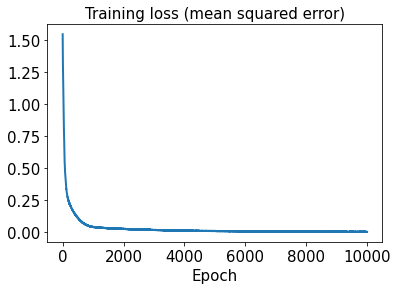

In [22]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

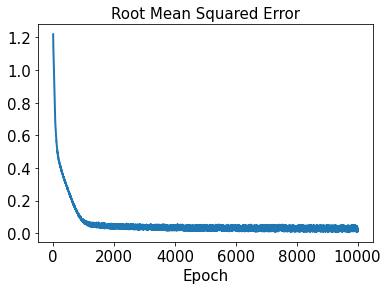

In [23]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [24]:
input_data = tf.keras.Input(shape=(n_sensors, 1))
reshape = tf.keras.layers.Reshape((n_sensors,))(input_data)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=101*101, activation=None, name='outputLayer')(x_)
output_img = tf.keras.layers.Reshape((101,101))(output_data)
# Shallow Decoder (SD)
sd1 = tf.keras.Model(input_data, output_img)
sd2 = tf.keras.Model(input_data, output_img)
sd3 = tf.keras.Model(input_data, output_img)

In [25]:
sd1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 reshape_2 (Reshape)         (None, 16)                0         
                                                                 
 firstHiddenLayer (Dense)    (None, 128)               2176      
                                                                 
 batch_normalization_3 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 secondHiddenLayer (Dense)   (None, 128)               16512     
                                                                 
 batch_normalization_4 (Batc  (None, 128)              512       
 hNormalization)                                           

In [26]:
sd1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [27]:
start1 = datetime.datetime.now()
history1 = sd1.fit(x_train1, y_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 18ms/step - loss: 0.5288 - rmse: 0.4949
Epoch 2/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5235 - rmse: 0.4906
Epoch 3/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.5190 - rmse: 0.4870
Epoch 4/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5146 - rmse: 0.4835
Epoch 5/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5103 - rmse: 0.4801
Epoch 6/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5064 - rmse: 0.4771
Epoch 7/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5027 - rmse: 0.4743
Epoch 8/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4992 - rmse: 0.4717
Epoch 9/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4959 - rmse: 0.4692
Epoch 10/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4928 - rmse: 0.4669
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 0.3948 - rmse: 0.4322
Epoch 86/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3933 - rmse: 0.4314
Epoch 87/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3926 - rmse: 0.4314
Epoch 88/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3911 - rmse: 0.4306
Epoch 89/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3920 - rmse: 0.4325
Epoch 90/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3899 - rmse: 0.4310
Epoch 91/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3880 - rmse: 0.4297
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3872 - rmse: 0.4296
Epoch 93/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3863 - rmse: 0.4294
Epoch 94/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3853 - rmse: 0.4291
Epoch 95/10000
2/2 [==========================

Epoch 169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2803 - rmse: 0.3568
Epoch 170/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2788 - rmse: 0.3554
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2774 - rmse: 0.3541
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2757 - rmse: 0.3525
Epoch 173/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2734 - rmse: 0.3501
Epoch 174/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2722 - rmse: 0.3491
Epoch 175/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2711 - rmse: 0.3483
Epoch 176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2683 - rmse: 0.3451
Epoch 177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2668 - rmse: 0.3437
Epoch 178/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2650 - rmse: 0.3418
Epoch 179/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.1523 - rmse: 0.1936
Epoch 253/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1513 - rmse: 0.1921
Epoch 254/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1508 - rmse: 0.1916
Epoch 255/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1509 - rmse: 0.1930
Epoch 256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1494 - rmse: 0.1899
Epoch 257/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1496 - rmse: 0.1916
Epoch 258/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1466 - rmse: 0.1845
Epoch 259/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1451 - rmse: 0.1813
Epoch 260/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1448 - rmse: 0.1816
Epoch 261/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1431 - rmse: 0.1779
Epoch 262/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0949 - rmse: 0.0814
Epoch 336/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0944 - rmse: 0.0798
Epoch 337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0942 - rmse: 0.0802
Epoch 338/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0951 - rmse: 0.0873
Epoch 339/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0933 - rmse: 0.0775
Epoch 340/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0929 - rmse: 0.0768
Epoch 341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0923 - rmse: 0.0749
Epoch 342/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0934 - rmse: 0.0834
Epoch 343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0918 - rmse: 0.0748
Epoch 344/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0915 - rmse: 0.0747
Epoch 345/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0704 - rmse: 0.0397
Epoch 419/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0701 - rmse: 0.0393
Epoch 420/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0699 - rmse: 0.0392
Epoch 421/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0697 - rmse: 0.0386
Epoch 422/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0696 - rmse: 0.0401
Epoch 423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0695 - rmse: 0.0417
Epoch 424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0708 - rmse: 0.0571
Epoch 425/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0695 - rmse: 0.0467
Epoch 426/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0687 - rmse: 0.0398
Epoch 427/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0698 - rmse: 0.0534
Epoch 428/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0554 - rmse: 0.0350
Epoch 502/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0561 - rmse: 0.0453
Epoch 503/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0548 - rmse: 0.0306
Epoch 504/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0560 - rmse: 0.0482
Epoch 505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0544 - rmse: 0.0300
Epoch 506/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0537 - rmse: 0.0170
Epoch 507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0535 - rmse: 0.0159
Epoch 508/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0534 - rmse: 0.0174
Epoch 509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0532 - rmse: 0.0161
Epoch 510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0538 - rmse: 0.0310
Epoch 511/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0433 - rmse: 0.0131
Epoch 585/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0450 - rmse: 0.0440
Epoch 586/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0435 - rmse: 0.0241
Epoch 587/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0430 - rmse: 0.0114
Epoch 588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0438 - rmse: 0.0326
Epoch 589/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0433 - rmse: 0.0266
Epoch 590/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0432 - rmse: 0.0271
Epoch 591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0431 - rmse: 0.0267
Epoch 592/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0427 - rmse: 0.0207
Epoch 593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0431 - rmse: 0.0304
Epoch 594/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0370 - rmse: 0.0451
Epoch 668/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0365 - rmse: 0.0397
Epoch 669/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0355 - rmse: 0.0263
Epoch 670/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0351 - rmse: 0.0197
Epoch 671/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0350 - rmse: 0.0198
Epoch 672/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0368 - rmse: 0.0469
Epoch 673/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0348 - rmse: 0.0167
Epoch 674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0345 - rmse: 0.0118
Epoch 675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0354 - rmse: 0.0337
Epoch 676/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0345 - rmse: 0.0175
Epoch 677/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0298 - rmse: 0.0291
Epoch 751/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0297 - rmse: 0.0277
Epoch 752/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0291 - rmse: 0.0163
Epoch 753/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0292 - rmse: 0.0207
Epoch 754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0292 - rmse: 0.0223
Epoch 755/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0288 - rmse: 0.0120
Epoch 756/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0288 - rmse: 0.0159
Epoch 757/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0290 - rmse: 0.0221
Epoch 758/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0287 - rmse: 0.0153
Epoch 759/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0285 - rmse: 0.0102
Epoch 760/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0245 - rmse: 0.0096
Epoch 834/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0247 - rmse: 0.0188
Epoch 835/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0247 - rmse: 0.0200
Epoch 836/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0247 - rmse: 0.0216
Epoch 837/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0243 - rmse: 0.0109
Epoch 838/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0242 - rmse: 0.0059
Epoch 839/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0246 - rmse: 0.0219
Epoch 840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0242 - rmse: 0.0124
Epoch 841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0244 - rmse: 0.0204
Epoch 842/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0243 - rmse: 0.0185
Epoch 843/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0211 - rmse: 0.0172
Epoch 917/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0216 - rmse: 0.0289
Epoch 918/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0208 - rmse: 0.0105
Epoch 919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0230 - rmse: 0.0479
Epoch 920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0212 - rmse: 0.0235
Epoch 921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0210 - rmse: 0.0190
Epoch 922/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0209 - rmse: 0.0172
Epoch 923/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0228 - rmse: 0.0474
Epoch 924/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0218 - rmse: 0.0367
Epoch 925/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0233 - rmse: 0.0529
Epoch 926/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0187 - rmse: 0.0254
Epoch 1000/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0188 - rmse: 0.0281
Epoch 1001/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0182 - rmse: 0.0156
Epoch 1002/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0189 - rmse: 0.0310
Epoch 1003/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0198 - rmse: 0.0434
Epoch 1004/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0183 - rmse: 0.0196
Epoch 1005/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0188 - rmse: 0.0310
Epoch 1006/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0192 - rmse: 0.0367
Epoch 1007/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0187 - rmse: 0.0301
Epoch 1008/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0181 - rmse: 0.0190
Epoch 1009/10000
2/2 [=====

Epoch 1082/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0177 - rmse: 0.0439
Epoch 1083/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0165 - rmse: 0.0275
Epoch 1084/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0164 - rmse: 0.0256
Epoch 1085/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0161 - rmse: 0.0197
Epoch 1086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0165 - rmse: 0.0283
Epoch 1087/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0167 - rmse: 0.0324
Epoch 1088/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0162 - rmse: 0.0240
Epoch 1089/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0166 - rmse: 0.0318
Epoch 1090/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0165 - rmse: 0.0293
Epoch 1091/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0157 - rmse: 0.0109
Epoch 1092

2/2 [==============================] - 0s 10ms/step - loss: 0.0145 - rmse: 0.0232
Epoch 1165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0143 - rmse: 0.0207
Epoch 1166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0144 - rmse: 0.0233
Epoch 1167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0150 - rmse: 0.0339
Epoch 1168/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0146 - rmse: 0.0273
Epoch 1169/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0145 - rmse: 0.0262
Epoch 1170/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0142 - rmse: 0.0202
Epoch 1171/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0149 - rmse: 0.0338
Epoch 1172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0145 - rmse: 0.0274
Epoch 1173/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0144 - rmse: 0.0257
Epoch 1174/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0133 - rmse: 0.0308
Epoch 1247/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0129 - rmse: 0.0232
Epoch 1248/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0128 - rmse: 0.0224
Epoch 1249/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0129 - rmse: 0.0249
Epoch 1250/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0131 - rmse: 0.0279
Epoch 1251/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0125 - rmse: 0.0145
Epoch 1252/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0127 - rmse: 0.0205
Epoch 1253/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0134 - rmse: 0.0334
Epoch 1254/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0132 - rmse: 0.0316
Epoch 1255/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0144 - rmse: 0.0469
Epoch 1256/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0114 - rmse: 0.0185
Epoch 1329/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0111 - rmse: 0.0104
Epoch 1330/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0117 - rmse: 0.0271
Epoch 1331/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0117 - rmse: 0.0264
Epoch 1332/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0119 - rmse: 0.0312
Epoch 1333/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0116 - rmse: 0.0263
Epoch 1334/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0110 - rmse: 0.0106
Epoch 1335/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0113 - rmse: 0.0199
Epoch 1336/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0113 - rmse: 0.0188
Epoch 1337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0115 - rmse: 0.0251
Epoch 1338/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0118 - rmse: 0.0440
Epoch 1411/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0101 - rmse: 0.0174
Epoch 1412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0103 - rmse: 0.0227
Epoch 1413/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0106 - rmse: 0.0290
Epoch 1414/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0103 - rmse: 0.0229
Epoch 1415/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0099 - rmse: 0.0132
Epoch 1416/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0104 - rmse: 0.0256
Epoch 1417/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0103 - rmse: 0.0245
Epoch 1418/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0100 - rmse: 0.0153
Epoch 1419/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0114 - rmse: 0.0407
Epoch 1420/10000
2/2 [=====

Epoch 1493/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0096 - rmse: 0.0292
Epoch 1494/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0308
Epoch 1495/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0090 - rmse: 0.0161
Epoch 1496/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0193
Epoch 1497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0090 - rmse: 0.0160
Epoch 1498/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0261
Epoch 1499/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0106
Epoch 1500/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0106 - rmse: 0.0432
Epoch 1501/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0091
Epoch 1502/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0090 - rmse: 0.0170
Epoch 1503/

2/2 [==============================] - 0s 10ms/step - loss: 0.0085 - rmse: 0.0245
Epoch 1576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0098 - rmse: 0.0444
Epoch 1577/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0193
Epoch 1578/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0152
Epoch 1579/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0276
Epoch 1580/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0085 - rmse: 0.0267
Epoch 1581/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0315
Epoch 1582/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0289
Epoch 1583/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0090 - rmse: 0.0347
Epoch 1584/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0323
Epoch 1585/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0286
Epoch 1658/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0111
Epoch 1659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0169
Epoch 1660/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0278
Epoch 1661/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0201
Epoch 1662/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0409
Epoch 1663/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0135
Epoch 1664/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0431
Epoch 1665/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0286
Epoch 1666/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0077
Epoch 1667/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0085 - rmse: 0.0472
Epoch 1740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0258
Epoch 1741/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0344
Epoch 1742/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0095
Epoch 1743/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0290
Epoch 1744/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0099
Epoch 1745/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0180
Epoch 1746/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0325
Epoch 1747/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0222
Epoch 1748/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0254
Epoch 1749/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0121
Epoch 1822/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0339
Epoch 1823/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0142
Epoch 1824/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0394
Epoch 1825/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0190
Epoch 1826/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0340
Epoch 1827/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0289
Epoch 1828/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0194
Epoch 1829/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0236
Epoch 1830/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0324
Epoch 1831/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0209
Epoch 1904/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0290
Epoch 1905/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0096
Epoch 1906/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0218
Epoch 1907/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0311
Epoch 1908/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0052 - rmse: 0.0154
Epoch 1909/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0427
Epoch 1910/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0091
Epoch 1911/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0227
Epoch 1912/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0184
Epoch 1913/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0150
Epoch 1987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0206
Epoch 1988/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0307
Epoch 1989/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0138
Epoch 1990/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0175
Epoch 1991/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0109
Epoch 1992/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0375
Epoch 1993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0314
Epoch 1994/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0172
Epoch 1995/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0158
Epoch 1996/10000
2/2 [=======

Epoch 2069/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0299
Epoch 2070/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0297
Epoch 2071/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0220
Epoch 2072/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0310
Epoch 2073/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0154
Epoch 2074/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0189
Epoch 2075/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0313
Epoch 2076/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0204
Epoch 2077/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0328
Epoch 2078/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0296
Epoch 2079

2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0325
Epoch 2152/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0203
Epoch 2153/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0186
Epoch 2154/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0182
Epoch 2155/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0213
Epoch 2156/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0264
Epoch 2157/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0165
Epoch 2158/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0176
Epoch 2159/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0167
Epoch 2160/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0142
Epoch 2161/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0125
Epoch 2234/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0401
Epoch 2235/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0105
Epoch 2236/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0319
Epoch 2237/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0191
Epoch 2238/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0130
Epoch 2239/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0321
Epoch 2240/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0196
Epoch 2241/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0396
Epoch 2242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0316
Epoch 2243/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0320
Epoch 2316/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0245
Epoch 2317/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0386
Epoch 2318/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0472
Epoch 2319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0299
Epoch 2320/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0275
Epoch 2321/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0384
Epoch 2322/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0293
Epoch 2323/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0441
Epoch 2324/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0138
Epoch 2325/10000
2/2 [=====

Epoch 2398/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0198
Epoch 2399/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0311
Epoch 2400/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0130
Epoch 2401/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0318
Epoch 2402/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0221
Epoch 2403/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0221
Epoch 2404/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0177
Epoch 2405/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0243
Epoch 2406/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0320
Epoch 2407/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0154
Epoch 2408/

2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0296
Epoch 2481/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0054
Epoch 2482/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0254
Epoch 2483/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0072
Epoch 2484/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0258
Epoch 2485/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0427
Epoch 2486/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0430
Epoch 2487/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0170
Epoch 2488/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0464
Epoch 2489/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0237
Epoch 2490/10000
2/2 [=====

Epoch 2563/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0224
Epoch 2564/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0226
Epoch 2565/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0311
Epoch 2566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0149
Epoch 2567/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0306
Epoch 2568/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0227
Epoch 2569/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0450
Epoch 2570/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0317
Epoch 2571/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0173
Epoch 2572/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0418
Epoch 2573/

2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0232
Epoch 2646/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0300
Epoch 2647/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0431
Epoch 2648/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0432
Epoch 2649/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0199
Epoch 2650/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0126
Epoch 2651/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0115
Epoch 2652/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0432
Epoch 2653/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0286
Epoch 2654/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0137
Epoch 2655/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0127
Epoch 2728/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0270
Epoch 2729/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0147
Epoch 2730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0168
Epoch 2731/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0312
Epoch 2732/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0152
Epoch 2733/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0136
Epoch 2734/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0326
Epoch 2735/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0256
Epoch 2736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0169
Epoch 2737/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0217
Epoch 2810/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0090
Epoch 2811/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0111
Epoch 2812/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0213
Epoch 2813/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0103
Epoch 2814/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0274
Epoch 2815/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0281
Epoch 2816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0165
Epoch 2817/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0103
Epoch 2818/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0210
Epoch 2819/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0247
Epoch 2892/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0236
Epoch 2893/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0308
Epoch 2894/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0186
Epoch 2895/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0075
Epoch 2896/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0166
Epoch 2897/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0238
Epoch 2898/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0308
Epoch 2899/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0212
Epoch 2900/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0260
Epoch 2901/10000
2/2 [=====

Epoch 2974/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0081
Epoch 2975/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0168
Epoch 2976/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0287
Epoch 2977/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0217
Epoch 2978/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0158
Epoch 2979/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0315
Epoch 2980/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0248
Epoch 2981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0097
Epoch 2982/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0160
Epoch 2983/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0216
Epoch 2984/

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0245
Epoch 3057/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0141
Epoch 3058/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0181
Epoch 3059/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0433
Epoch 3060/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0477
Epoch 3061/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0323
Epoch 3062/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0365
Epoch 3063/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0183
Epoch 3064/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0121
Epoch 3065/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0138
Epoch 3066/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0262
Epoch 3139/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0221
Epoch 3140/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0373
Epoch 3141/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0326
Epoch 3142/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0170
Epoch 3143/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0113
Epoch 3144/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0402
Epoch 3145/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0400
Epoch 3146/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0254
Epoch 3147/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0134
Epoch 3148/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 8.5468e-04 - rmse: 0.0063
Epoch 3221/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0192
Epoch 3222/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0293
Epoch 3223/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4022e-04 - rmse: 0.0054
Epoch 3224/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0892e-04 - rmse: 0.0099
Epoch 3225/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0436
Epoch 3226/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0213
Epoch 3227/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9925e-04 - rmse: 0.0096
Epoch 3228/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1304e-04 - rmse: 0.0103
Epoch 3229/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0247
Epoch 3

2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0323
Epoch 3303/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0283
Epoch 3304/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9174e-04 - rmse: 0.0077
Epoch 3305/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0403
Epoch 3306/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0185
Epoch 3307/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0316
Epoch 3308/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0171
Epoch 3309/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6747e-04 - rmse: 0.0155
Epoch 3310/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5213e-04 - rmse: 0.0150
Epoch 3311/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0215
Epoch 3312/1000

2/2 [==============================] - 0s 10ms/step - loss: 8.5150e-04 - rmse: 0.0138
Epoch 3384/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0313
Epoch 3385/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0295
Epoch 3386/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0291
Epoch 3387/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0383
Epoch 3388/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0286
Epoch 3389/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0453e-04 - rmse: 0.0157
Epoch 3390/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0344
Epoch 3391/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0398e-04 - rmse: 0.0158
Epoch 3392/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0115e-04 - rmse: 0.0121
Epoch 3393/

2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0290
Epoch 3465/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0294
Epoch 3466/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0277
Epoch 3467/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0311
Epoch 3468/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0321
Epoch 3469/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5573e-04 - rmse: 0.0161
Epoch 3470/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1189e-04 - rmse: 0.0147
Epoch 3471/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0207
Epoch 3472/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3920e-04 - rmse: 0.0186
Epoch 3473/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.2069e-04 - rmse: 0.0113
Epoch 3474/10

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0228
Epoch 3546/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0283
Epoch 3547/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0271
Epoch 3548/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0311
Epoch 3549/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0369
Epoch 3550/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3794e-04 - rmse: 0.0172
Epoch 3551/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6465e-04 - rmse: 0.0111
Epoch 3552/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2393e-04 - rmse: 0.0169
Epoch 3553/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5846e-04 - rmse: 0.0109
Epoch 3554/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.2455e-04 - rmse: 0.0136
Epoch 3

2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0293
Epoch 3627/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0311
Epoch 3628/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0429
Epoch 3629/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0313
Epoch 3630/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.1406e-04 - rmse: 0.0205
Epoch 3631/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5819e-04 - rmse: 0.0163
Epoch 3632/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0239
Epoch 3633/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.2853e-04 - rmse: 0.0060
Epoch 3634/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6736e-04 - rmse: 0.0087
Epoch 3635/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0246
Epoch 3636/

2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0510
Epoch 3708/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0250
Epoch 3709/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0312
Epoch 3710/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0324
Epoch 3711/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0425
Epoch 3712/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0473
Epoch 3713/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0299
Epoch 3714/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0247
Epoch 3715/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0254
Epoch 3716/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0386
Epoch 3717/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 5.7808e-04 - rmse: 0.0128
Epoch 3789/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0337
Epoch 3790/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0385
Epoch 3791/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0228e-04 - rmse: 0.0138
Epoch 3792/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0315
Epoch 3793/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0335
Epoch 3794/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4548e-04 - rmse: 0.0153
Epoch 3795/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0272
Epoch 3796/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.7634e-04 - rmse: 0.0216
Epoch 3797/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0259
Epoch 3798/

2/2 [==============================] - 0s 9ms/step - loss: 9.0030e-04 - rmse: 0.0229
Epoch 3870/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7031e-04 - rmse: 0.0244
Epoch 3871/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0162e-04 - rmse: 0.0229
Epoch 3872/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5093e-04 - rmse: 0.0086
Epoch 3873/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2295e-04 - rmse: 0.0211
Epoch 3874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0283
Epoch 3875/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0370
Epoch 3876/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0300
Epoch 3877/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2855e-04 - rmse: 0.0074
Epoch 3878/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0261
Epoch

2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0286
Epoch 3951/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0269
Epoch 3952/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2320e-04 - rmse: 0.0241
Epoch 3953/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0370
Epoch 3954/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5490e-04 - rmse: 0.0106
Epoch 3955/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2174e-04 - rmse: 0.0089
Epoch 3956/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0316
Epoch 3957/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9788e-04 - rmse: 0.0236
Epoch 3958/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.2181e-04 - rmse: 0.0195
Epoch 3959/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0272
Epoch 39

2/2 [==============================] - 0s 11ms/step - loss: 8.1399e-04 - rmse: 0.0223
Epoch 4032/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5436e-04 - rmse: 0.0117
Epoch 4033/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0325
Epoch 4034/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0471
Epoch 4035/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0284
Epoch 4036/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0307
Epoch 4037/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0281
Epoch 4038/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7145e-04 - rmse: 0.0214
Epoch 4039/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7433e-04 - rmse: 0.0126
Epoch 4040/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0331
Epoch 4041/

2/2 [==============================] - 0s 10ms/step - loss: 4.2689e-04 - rmse: 0.0116
Epoch 4113/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7271e-04 - rmse: 0.0219
Epoch 4114/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5000e-04 - rmse: 0.0189
Epoch 4115/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0922e-04 - rmse: 0.0178
Epoch 4116/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0275
Epoch 4117/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0305
Epoch 4118/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0294
Epoch 4119/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0288
Epoch 4120/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2228e-04 - rmse: 0.0231
Epoch 4121/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0283
Epoch 4

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0296
Epoch 4193/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4625e-04 - rmse: 0.0194
Epoch 4194/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7194e-04 - rmse: 0.0224
Epoch 4195/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0326
Epoch 4196/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5019e-04 - rmse: 0.0241
Epoch 4197/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.0597e-04 - rmse: 0.0209
Epoch 4198/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3335e-04 - rmse: 0.0216
Epoch 4199/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0446
Epoch 4200/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0292
Epoch 4201/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1301e-04 - rmse: 0.0157
Epo

2/2 [==============================] - 0s 10ms/step - loss: 7.8807e-04 - rmse: 0.0232
Epoch 4274/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1392e-04 - rmse: 0.0258
Epoch 4275/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9753e-04 - rmse: 0.0234
Epoch 4276/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7736e-04 - rmse: 0.0270
Epoch 4277/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2824e-04 - rmse: 0.0195
Epoch 4278/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5800e-04 - rmse: 0.0176
Epoch 4279/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9624e-04 - rmse: 0.0122
Epoch 4280/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0322
Epoch 4281/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6647e-04 - rmse: 0.0148
Epoch 4282/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0395e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 5.8624e-04 - rmse: 0.0189
Epoch 4354/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0299
Epoch 4355/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0830e-04 - rmse: 0.0195
Epoch 4356/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0309
Epoch 4357/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0396
Epoch 4358/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0294
Epoch 4359/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6715e-04 - rmse: 0.0209
Epoch 4360/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9217e-04 - rmse: 0.0258
Epoch 4361/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7543e-04 - rmse: 0.0157
Epoch 4362/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0317
Epoch 43

2/2 [==============================] - 0s 11ms/step - loss: 3.2570e-04 - rmse: 0.0107
Epoch 4434/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0290
Epoch 4435/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0324
Epoch 4436/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1147e-04 - rmse: 0.0100
Epoch 4437/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3476e-04 - rmse: 0.0150
Epoch 4438/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0396
Epoch 4439/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7992e-04 - rmse: 0.0083
Epoch 4440/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9460e-04 - rmse: 0.0280
Epoch 4441/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0307
Epoch 4442/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8875e-04 - rmse: 0.0089
Epoc

Epoch 4514/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2832e-04 - rmse: 0.0115
Epoch 4515/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1048e-04 - rmse: 0.0177
Epoch 4516/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0423
Epoch 4517/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0468
Epoch 4518/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0494
Epoch 4519/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0343
Epoch 4520/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4565e-04 - rmse: 0.0234
Epoch 4521/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0345
Epoch 4522/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7616e-04 - rmse: 0.0195
Epoch 4523/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9277e-04 - rms

2/2 [==============================] - 0s 11ms/step - loss: 2.5648e-04 - rmse: 0.0086
Epoch 4595/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9457e-04 - rmse: 0.0146
Epoch 4596/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9779e-04 - rmse: 0.0204
Epoch 4597/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7391e-04 - rmse: 0.0139
Epoch 4598/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0366
Epoch 4599/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0303
Epoch 4600/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1741e-04 - rmse: 0.0183
Epoch 4601/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6563e-04 - rmse: 0.0242
Epoch 4602/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3333e-04 - rmse: 0.0213
Epoch 4603/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1844e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0344
Epoch 4675/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0246e-04 - rmse: 0.0153
Epoch 4676/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.2112e-04 - rmse: 0.0235
Epoch 4677/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0441
Epoch 4678/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4392e-04 - rmse: 0.0279
Epoch 4679/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0292
Epoch 4680/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0329
Epoch 4681/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7985e-04 - rmse: 0.0106
Epoch 4682/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0404
Epoch 4683/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0317
Epoch 4684/

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0312
Epoch 4755/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9478e-04 - rmse: 0.0155
Epoch 4756/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7666e-04 - rmse: 0.0205
Epoch 4757/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0327
Epoch 4758/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4518e-04 - rmse: 0.0263
Epoch 4759/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3289e-04 - rmse: 0.0133
Epoch 4760/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0399
Epoch 4761/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6674e-04 - rmse: 0.0105
Epoch 4762/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9298e-04 - rmse: 0.0253
Epoch 4763/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0426
Epo

2/2 [==============================] - 0s 10ms/step - loss: 9.0299e-04 - rmse: 0.0275
Epoch 4835/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6251e-04 - rmse: 0.0227
Epoch 4836/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3178e-04 - rmse: 0.0220
Epoch 4837/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8452e-04 - rmse: 0.0253
Epoch 4838/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8527e-04 - rmse: 0.0210
Epoch 4839/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3991e-04 - rmse: 0.0222
Epoch 4840/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0421
Epoch 4841/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0309
Epoch 4842/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6908e-04 - rmse: 0.0180
Epoch 4843/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2048e-04 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 3.6317e-04 - rmse: 0.0151
Epoch 4915/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0295
Epoch 4916/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0590e-04 - rmse: 0.0131
Epoch 4917/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2574e-04 - rmse: 0.0138
Epoch 4918/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8019e-04 - rmse: 0.0120
Epoch 4919/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6098e-04 - rmse: 0.0269
Epoch 4920/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0294e-04 - rmse: 0.0164
Epoch 4921/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9665e-04 - rmse: 0.0215
Epoch 4922/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6158e-04 - rmse: 0.0181
Epoch 4923/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5537e-04 - rmse: 

2/2 [==============================] - 0s 10ms/step - loss: 8.5793e-04 - rmse: 0.0270
Epoch 4995/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7125e-04 - rmse: 0.0119
Epoch 4996/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6615e-04 - rmse: 0.0154
Epoch 4997/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8136e-04 - rmse: 0.0255
Epoch 4998/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1884e-04 - rmse: 0.0170
Epoch 4999/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8484e-04 - rmse: 0.0256
Epoch 5000/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0310
Epoch 5001/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9460e-04 - rmse: 0.0238
Epoch 5002/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4821e-04 - rmse: 0.0286
Epoch 5003/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5377e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 9.9839e-04 - rmse: 0.0297
Epoch 5075/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0458
Epoch 5076/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1522e-04 - rmse: 0.0282
Epoch 5077/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5461e-04 - rmse: 0.0060
Epoch 5078/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0326
Epoch 5079/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 5080/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6357e-04 - rmse: 0.0211
Epoch 5081/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5704e-04 - rmse: 0.0118
Epoch 5082/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6204e-04 - rmse: 0.0066
Epoch 5083/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7011e-04 - rmse: 0.0159

2/2 [==============================] - 0s 10ms/step - loss: 2.0491e-04 - rmse: 0.0098
Epoch 5155/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0131e-04 - rmse: 0.0171
Epoch 5156/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0317
Epoch 5157/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6727e-04 - rmse: 0.0076
Epoch 5158/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9918e-04 - rmse: 0.0198
Epoch 5159/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.8423e-04 - rmse: 0.0194
Epoch 5160/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0308
Epoch 5161/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0457e-04 - rmse: 0.0244
Epoch 5162/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5867e-04 - rmse: 0.0071
Epoch 5163/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8930e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 7.6298e-04 - rmse: 0.0257
Epoch 5235/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0329
Epoch 5236/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8513e-04 - rmse: 0.0091
Epoch 5237/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7788e-04 - rmse: 0.0087
Epoch 5238/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6904e-04 - rmse: 0.0192
Epoch 5239/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9727e-04 - rmse: 0.0223
Epoch 5240/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8742e-04 - rmse: 0.0298
Epoch 5241/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6265e-04 - rmse: 0.0190
Epoch 5242/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 5243/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0465

2/2 [==============================] - 0s 14ms/step - loss: 1.4198e-04 - rmse: 0.0068
Epoch 5315/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.7674e-04 - rmse: 0.0279
Epoch 5316/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0316
Epoch 5317/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.3950e-04 - rmse: 0.0156
Epoch 5318/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.8262e-04 - rmse: 0.0281
Epoch 5319/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3510e-04 - rmse: 0.0184
Epoch 5320/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2280e-04 - rmse: 0.0181
Epoch 5321/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2130e-04 - rmse: 0.0051
Epoch 5322/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 5323/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6777e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 1.8154e-04 - rmse: 0.0096
Epoch 5395/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4016e-04 - rmse: 0.0213
Epoch 5396/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4107e-04 - rmse: 0.0073
Epoch 5397/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4987e-04 - rmse: 0.0078
Epoch 5398/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0455
Epoch 5399/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4403e-04 - rmse: 0.0075
Epoch 5400/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0202e-04 - rmse: 0.0107
Epoch 5401/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9673e-04 - rmse: 0.0176
Epoch 5402/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3962e-04 - rmse: 0.0072
Epoch 5403/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5801e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 2.0300e-04 - rmse: 0.0110
Epoch 5475/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3383e-04 - rmse: 0.0213
Epoch 5476/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 5477/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0121e-04 - rmse: 0.0286
Epoch 5478/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0312
Epoch 5479/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 5480/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1291e-04 - rmse: 0.0208
Epoch 5481/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7472e-04 - rmse: 0.0097
Epoch 5482/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2090e-04 - rmse: 0.0184
Epoch 5483/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9989e-04 - rmse: 0.0178

2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0309
Epoch 5555/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8227e-04 - rmse: 0.0103
Epoch 5556/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3575e-04 - rmse: 0.0077
Epoch 5557/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3454e-04 - rmse: 0.0077
Epoch 5558/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9258e-04 - rmse: 0.0227
Epoch 5559/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.8216e-04 - rmse: 0.0202
Epoch 5560/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7907e-04 - rmse: 0.0265
Epoch 5561/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1170e-04 - rmse: 0.0209
Epoch 5562/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 5563/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1948e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 5635/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5515e-04 - rmse: 0.0169
Epoch 5636/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7852e-04 - rmse: 0.0202
Epoch 5637/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6898e-04 - rmse: 0.0099
Epoch 5638/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8153e-04 - rmse: 0.0226
Epoch 5639/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4944e-04 - rmse: 0.0219
Epoch 5640/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5219e-04 - rmse: 0.0135
Epoch 5641/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4718e-04 - rmse: 0.0240
Epoch 5642/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0318
Epoch 5643/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0434e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 1.8836e-04 - rmse: 0.0111
Epoch 5715/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5160e-05 - rmse: 0.0055
Epoch 5716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0316
Epoch 5717/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1346e-04 - rmse: 0.0212
Epoch 5718/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4473e-04 - rmse: 0.0279
Epoch 5719/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0307
Epoch 5720/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0990e-04 - rmse: 0.0067
Epoch 5721/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4845e-04 - rmse: 0.0136
Epoch 5722/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0424
Epoch 5723/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2659e-04 - rmse: 0.0162

2/2 [==============================] - 0s 11ms/step - loss: 2.5089e-04 - rmse: 0.0138
Epoch 5795/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9227e-04 - rmse: 0.0182
Epoch 5796/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8622e-04 - rmse: 0.0181
Epoch 5797/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4154e-04 - rmse: 0.0135
Epoch 5798/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9358e-04 - rmse: 0.0183
Epoch 5799/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8733e-04 - rmse: 0.0305
Epoch 5800/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3909e-04 - rmse: 0.0134
Epoch 5801/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2897e-04 - rmse: 0.0083
Epoch 5802/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5382e-04 - rmse: 0.0282
Epoch 5803/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 7.0929e-04 - rmse: 0.0256
Epoch 5875/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8547e-04 - rmse: 0.0230
Epoch 5876/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0034e-04 - rmse: 0.0211
Epoch 5877/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 5878/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9186e-04 - rmse: 0.0306
Epoch 5879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 5880/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0160e-04 - rmse: 0.0121
Epoch 5881/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4736e-04 - rmse: 0.0096
Epoch 5882/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3857e-04 - rmse: 0.0091
Epoch 5883/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0087e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 8.1127e-04 - rmse: 0.0276
Epoch 5955/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 5956/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 5957/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0400
Epoch 5958/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 5959/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6271e-04 - rmse: 0.0302
Epoch 5960/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 5961/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 5962/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5473e-04 - rmse: 0.0301
Epoch 5963/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6175e-04 - rmse: 0.0176
Epoch 5964/

2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 6036/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9680e-04 - rmse: 0.0274
Epoch 6037/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5436e-04 - rmse: 0.0104
Epoch 6038/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 6039/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 6040/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2786e-04 - rmse: 0.0195
Epoch 6041/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8649e-04 - rmse: 0.0290
Epoch 6042/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9870e-04 - rmse: 0.0123
Epoch 6043/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5016e-04 - rmse: 0.0283
Epoch 6044/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9724e-04 - rmse: 0.0274

2/2 [==============================] - 0s 10ms/step - loss: 5.8793e-04 - rmse: 0.0233
Epoch 6116/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8947e-04 - rmse: 0.0291
Epoch 6117/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 6118/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 6119/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0425
Epoch 6120/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7694e-04 - rmse: 0.0208
Epoch 6121/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5327e-04 - rmse: 0.0202
Epoch 6122/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 6123/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2907e-04 - rmse: 0.0196
Epoch 6124/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0810e-04 - rmse: 0.0258
Epo

2/2 [==============================] - 0s 10ms/step - loss: 2.1055e-04 - rmse: 0.0131
Epoch 6196/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6197/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6198/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 6199/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 6200/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5810e-04 - rmse: 0.0109
Epoch 6201/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5709e-04 - rmse: 0.0147
Epoch 6202/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0537e-04 - rmse: 0.0258
Epoch 6203/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7967e-04 - rmse: 0.0155
Epoch 6204/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7319e-04 - rmse: 0.0116
Epo

2/2 [==============================] - 0s 10ms/step - loss: 5.1348e-04 - rmse: 0.0218
Epoch 6276/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2838e-04 - rmse: 0.0096
Epoch 6277/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 6278/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2574e-04 - rmse: 0.0281
Epoch 6279/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8737e-04 - rmse: 0.0123
Epoch 6280/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 6281/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3727e-04 - rmse: 0.0142
Epoch 6282/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5591e-04 - rmse: 0.0179
Epoch 6283/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2519e-04 - rmse: 0.0197
Epoch 6284/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2516e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 3.0817e-04 - rmse: 0.0166
Epoch 6356/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 6357/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1857e-04 - rmse: 0.0196
Epoch 6358/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6706e-04 - rmse: 0.0183
Epoch 6359/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6906e-04 - rmse: 0.0271
Epoch 6360/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3016e-04 - rmse: 0.0299
Epoch 6361/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.2548e-04 - rmse: 0.0299
Epoch 6362/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3674e-04 - rmse: 0.0246
Epoch 6363/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5602e-04 - rmse: 0.0229
Epoch 6364/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3550e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 3.6336e-04 - rmse: 0.0182
Epoch 6436/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0254e-04 - rmse: 0.0131
Epoch 6437/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7732e-04 - rmse: 0.0157
Epoch 6438/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0645e-04 - rmse: 0.0218
Epoch 6439/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8556e-04 - rmse: 0.0160
Epoch 6440/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7013e-04 - rmse: 0.0155
Epoch 6441/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8093e-04 - rmse: 0.0123
Epoch 6442/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5704e-05 - rmse: 0.0081
Epoch 6443/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8336e-04 - rmse: 0.0274
Epoch 6444/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 6516/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7394e-04 - rmse: 0.0121
Epoch 6517/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8055e-04 - rmse: 0.0255
Epoch 6518/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3433e-04 - rmse: 0.0144
Epoch 6519/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4746e-04 - rmse: 0.0148
Epoch 6520/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4815e-04 - rmse: 0.0228
Epoch 6521/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7544e-04 - rmse: 0.0122
Epoch 6522/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9950e-04 - rmse: 0.0239
Epoch 6523/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8156e-04 - rmse: 0.0124
Epoch 6524/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1835e-04 - rmse

2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 6596/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2452e-04 - rmse: 0.0245
Epoch 6597/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4859e-04 - rmse: 0.0250
Epoch 6598/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.2633e-04 - rmse: 0.0224
Epoch 6599/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3931e-04 - rmse: 0.0227
Epoch 6600/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5079e-04 - rmse: 0.0150
Epoch 6601/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 6602/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1735e-04 - rmse: 0.0171
Epoch 6603/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7154e-04 - rmse: 0.0211
Epoch 6604/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8280e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 4.4542e-05 - rmse: 0.0047
Epoch 6676/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3781e-05 - rmse: 0.0033
Epoch 6677/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5936e-04 - rmse: 0.0252
Epoch 6678/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2908e-04 - rmse: 0.0103
Epoch 6679/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.6691e-04 - rmse: 0.0254
Epoch 6680/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3934e-04 - rmse: 0.0147
Epoch 6681/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 6682/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3439e-04 - rmse: 0.0177
Epoch 6683/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2495e-04 - rmse: 0.0101
Epoch 6684/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6014e-04 - rmse

2/2 [==============================] - 0s 11ms/step - loss: 5.2754e-04 - rmse: 0.0225
Epoch 6756/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1736e-04 - rmse: 0.0282
Epoch 6757/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7328e-04 - rmse: 0.0123
Epoch 6758/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4819e-04 - rmse: 0.0113
Epoch 6759/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2820e-04 - rmse: 0.0175
Epoch 6760/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7665e-04 - rmse: 0.0125
Epoch 6761/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 6762/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8035e-05 - rmse: 0.0088
Epoch 6763/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4152e-04 - rmse: 0.0110
Epoch 6764/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.8725e-04 - rmse

2/2 [==============================] - 0s 9ms/step - loss: 3.5051e-04 - rmse: 0.0182
Epoch 6836/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6837/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2515e-04 - rmse: 0.0103
Epoch 6838/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0957e-04 - rmse: 0.0095
Epoch 6839/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.1780e-04 - rmse: 0.0245
Epoch 6840/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3260e-04 - rmse: 0.0302
Epoch 6841/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 6842/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2286e-04 - rmse: 0.0102
Epoch 6843/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5799e-04 - rmse: 0.0210
Epoch 6844/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2889e-04 - rmse: 0.01

2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 6916/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0713e-05 - rmse: 0.0086
Epoch 6917/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3900e-04 - rmse: 0.0205
Epoch 6918/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9031e-04 - rmse: 0.0312
Epoch 6919/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8087e-04 - rmse: 0.0128
Epoch 6920/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5725e-04 - rmse: 0.0272
Epoch 6921/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4273e-04 - rmse: 0.0112
Epoch 6922/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0194e-04 - rmse: 0.0136
Epoch 6923/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4588e-04 - rmse: 0.0181
Epoch 6924/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9397e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 6996/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8115e-04 - rmse: 0.0163
Epoch 6997/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 6998/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3050e-04 - rmse: 0.0285
Epoch 6999/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6709e-04 - rmse: 0.0212
Epoch 7000/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7662e-04 - rmse: 0.0162
Epoch 7001/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8880e-04 - rmse: 0.0296
Epoch 7002/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5556e-04 - rmse: 0.0232
Epoch 7003/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9574e-04 - rmse: 0.0167
Epoch 7004/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3810e-04 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 8.5370e-04 - rmse: 0.0290
Epoch 7076/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5480e-04 - rmse: 0.0253
Epoch 7077/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1955e-04 - rmse: 0.0102
Epoch 7078/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5873e-04 - rmse: 0.0120
Epoch 7079/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2969e-04 - rmse: 0.0107
Epoch 7080/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2933e-04 - rmse: 0.0107
Epoch 7081/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5957e-04 - rmse: 0.0273
Epoch 7082/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0446e-04 - rmse: 0.0298
Epoch 7083/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9922e-04 - rmse: 0.0297
Epoch 7084/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1033e-04 - 

2/2 [==============================] - 0s 10ms/step - loss: 7.4140e-04 - rmse: 0.0270
Epoch 7156/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.7045e-04 - rmse: 0.0256
Epoch 7157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7158/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0914e-05 - rmse: 0.0061
Epoch 7159/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5078e-04 - rmse: 0.0184
Epoch 7160/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7039e-04 - rmse: 0.0214
Epoch 7161/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7693e-04 - rmse: 0.0310
Epoch 7162/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.1577e-05 - rmse: 0.0083
Epoch 7163/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7478e-04 - rmse: 0.0257
Epoch 7164/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6102e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 6.7876e-05 - rmse: 0.0075
Epoch 7236/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3778e-04 - rmse: 0.0180
Epoch 7237/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8503e-04 - rmse: 0.0239
Epoch 7238/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6161e-05 - rmse: 0.0058
Epoch 7239/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6186e-05 - rmse: 0.0049
Epoch 7240/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5134e-04 - rmse: 0.0253
Epoch 7241/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4286e-05 - rmse: 0.0047
Epoch 7242/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5487e-04 - rmse: 0.0253
Epoch 7243/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9097e-04 - rmse: 0.0195
Epoch 7244/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1895e-04 - 

2/2 [==============================] - 0s 9ms/step - loss: 3.3189e-04 - rmse: 0.0179
Epoch 7316/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 7317/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7959e-04 - rmse: 0.0130
Epoch 7318/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5445e-04 - rmse: 0.0156
Epoch 7319/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8323e-04 - rmse: 0.0131
Epoch 7320/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5970e-05 - rmse: 0.0038
Epoch 7321/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 7322/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6899e-05 - rmse: 0.0068
Epoch 7323/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8901e-05 - rmse: 0.0053
Epoch 7324/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7784e-05 - rmse: 0.0075

2/2 [==============================] - 0s 10ms/step - loss: 2.6236e-04 - rmse: 0.0159
Epoch 7396/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1810e-04 - rmse: 0.0104
Epoch 7397/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9022e-05 - rmse: 0.0070
Epoch 7398/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9912e-04 - rmse: 0.0298
Epoch 7399/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5159e-04 - rmse: 0.0233
Epoch 7400/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 7401/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9841e-04 - rmse: 0.0242
Epoch 7402/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9499e-04 - rmse: 0.0280
Epoch 7403/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7669e-05 - rmse: 0.0052
Epoch 7404/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5080e-04 - rmse:

2/2 [==============================] - 0s 11ms/step - loss: 7.4423e-04 - rmse: 0.0271
Epoch 7476/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 7477/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1818e-04 - rmse: 0.0104
Epoch 7478/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1349e-04 - rmse: 0.0102
Epoch 7479/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 7480/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5990e-04 - rmse: 0.0212
Epoch 7481/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4992e-04 - rmse: 0.0232
Epoch 7482/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4513e-04 - rmse: 0.0289
Epoch 7483/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1281e-04 - rmse: 0.0142
Epoch 7484/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5898e-04 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 7556/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2073e-04 - rmse: 0.0106
Epoch 7557/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0453e-04 - rmse: 0.0282
Epoch 7558/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7749e-04 - rmse: 0.0164
Epoch 7559/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3260e-05 - rmse: 0.0086
Epoch 7560/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4439e-05 - rmse: 0.0087
Epoch 7561/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 7562/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1703e-04 - rmse: 0.0202
Epoch 7563/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9563e-04 - rmse: 0.0242
Epoch 7564/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4531e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 8.2996e-04 - rmse: 0.0287
Epoch 7636/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1504e-04 - rmse: 0.0144
Epoch 7637/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4595e-04 - rmse: 0.0232
Epoch 7638/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3512e-05 - rmse: 0.0087
Epoch 7639/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9807e-04 - rmse: 0.0243
Epoch 7640/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4329e-04 - rmse: 0.0183
Epoch 7641/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0418e-05 - rmse: 0.0047
Epoch 7642/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3701e-04 - rmse: 0.0181
Epoch 7643/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1520e-05 - rmse: 0.0048
Epoch 7644/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5827e-04 - 

2/2 [==============================] - 0s 10ms/step - loss: 1.4644e-04 - rmse: 0.0118
Epoch 7716/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2580e-04 - rmse: 0.0249
Epoch 7717/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9326e-04 - rmse: 0.0136
Epoch 7718/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5241e-04 - rmse: 0.0186
Epoch 7719/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7457e-04 - rmse: 0.0277
Epoch 7720/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 7721/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8853e-04 - rmse: 0.0134
Epoch 7722/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3614e-04 - rmse: 0.0270
Epoch 7723/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8088e-04 - rmse: 0.0131
Epoch 7724/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9627e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 4.1082e-04 - rmse: 0.0201
Epoch 7796/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8691e-05 - rmse: 0.0084
Epoch 7797/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4119e-04 - rmse: 0.0252
Epoch 7798/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 7799/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7507e-04 - rmse: 0.0277
Epoch 7800/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3346e-04 - rmse: 0.0250
Epoch 7801/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4049e-04 - rmse: 0.0208
Epoch 7802/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 7803/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3882e-04 - rmse: 0.0208
Epoch 7804/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7710e-04 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 6.5417e-04 - rmse: 0.0254
Epoch 7876/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4348e-05 - rmse: 0.0069
Epoch 7877/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7647e-04 - rmse: 0.0164
Epoch 7878/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7683e-04 - rmse: 0.0164
Epoch 7879/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2199e-04 - rmse: 0.0177
Epoch 7880/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0919e-04 - rmse: 0.0265
Epoch 7881/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 7882/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2308e-05 - rmse: 0.0023
Epoch 7883/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 7884/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2927e-04 - rmse: 0.02

2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 7956/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 7957/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9608e-04 - rmse: 0.0281
Epoch 7958/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1196e-04 - rmse: 0.0103
Epoch 7959/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 7960/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9351e-05 - rmse: 0.0072
Epoch 7961/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2770e-05 - rmse: 0.0075
Epoch 7962/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4389e-04 - rmse: 0.0271
Epoch 7963/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8503e-05 - rmse: 0.0090
Epoch 7964/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0764e-04 - rmse: 0.0100

2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 8036/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3903e-04 - rmse: 0.0251
Epoch 8037/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8154e-04 - rmse: 0.0194
Epoch 8038/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8039/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.6689e-04 - rmse: 0.0237
Epoch 8040/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9955e-04 - rmse: 0.0198
Epoch 8041/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 8042/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3735e-04 - rmse: 0.0230
Epoch 8043/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5278e-04 - rmse: 0.0273
Epoch 8044/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4471e-04 - rmse: 0.0232

2/2 [==============================] - 0s 9ms/step - loss: 9.4427e-05 - rmse: 0.0094
Epoch 8116/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.6361e-04 - rmse: 0.0309
Epoch 8117/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5815e-05 - rmse: 0.0089
Epoch 8118/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7978e-05 - rmse: 0.0072
Epoch 8119/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1973e-04 - rmse: 0.0267
Epoch 8120/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9963e-05 - rmse: 0.0049
Epoch 8121/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.4998e-04 - rmse: 0.0254
Epoch 8122/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.6078e-05 - rmse: 0.0071
Epoch 8123/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8124/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0391
Epoc

2/2 [==============================] - 0s 7ms/step - loss: 4.0637e-04 - rmse: 0.0200
Epoch 8196/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.7926e-04 - rmse: 0.0295
Epoch 8197/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8198/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.8991e-04 - rmse: 0.0314
Epoch 8199/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5857e-04 - rmse: 0.0274
Epoch 8200/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 8201/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6526e-04 - rmse: 0.0276
Epoch 8202/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5051e-04 - rmse: 0.0120
Epoch 8203/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5773e-04 - rmse: 0.0292
Epoch 8204/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.3379e-04 - rmse: 0.0288
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 1.2667e-04 - rmse: 0.0110
Epoch 8277/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6363e-04 - rmse: 0.0256
Epoch 8278/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.8082e-04 - rmse: 0.0296
Epoch 8279/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2422e-04 - rmse: 0.0205
Epoch 8280/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6205e-04 - rmse: 0.0275
Epoch 8281/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1852e-04 - rmse: 0.0302
Epoch 8282/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.3508e-04 - rmse: 0.0251
Epoch 8283/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.0060e-04 - rmse: 0.0222
Epoch 8284/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4998e-04 - rmse: 0.0120
Epoch 8285/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.1405e-04 - rmse: 

2/2 [==============================] - 0s 9ms/step - loss: 7.6708e-05 - rmse: 0.0084
Epoch 8357/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9499e-04 - rmse: 0.0315
Epoch 8358/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.2933e-04 - rmse: 0.0287
Epoch 8359/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7107e-04 - rmse: 0.0311
Epoch 8360/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 8361/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8292e-04 - rmse: 0.0296
Epoch 8362/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6257e-04 - rmse: 0.0256
Epoch 8363/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6457e-04 - rmse: 0.0257
Epoch 8364/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5711e-04 - rmse: 0.0308
Epoch 8365/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2288e-04 - rmse: 0.0268
E

Epoch 8437/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3001e-04 - rmse: 0.0206
Epoch 8438/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9163e-05 - rmse: 0.0086
Epoch 8439/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8189e-04 - rmse: 0.0260
Epoch 8440/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6302e-04 - rmse: 0.0126
Epoch 8441/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0958e-04 - rmse: 0.0301
Epoch 8442/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9719e-05 - rmse: 0.0067
Epoch 8443/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6489e-04 - rmse: 0.0257
Epoch 8444/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8890e-04 - rmse: 0.0168
Epoch 8445/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4340e-05 - rmse: 0.0062
Epoch 8446/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010

2/2 [==============================] - 0s 9ms/step - loss: 3.6721e-05 - rmse: 0.0056
Epoch 8518/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7284e-04 - rmse: 0.0164
Epoch 8519/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 8520/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.7117e-05 - rmse: 0.0090
Epoch 8521/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9937e-04 - rmse: 0.0282
Epoch 8522/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2050e-04 - rmse: 0.0267
Epoch 8523/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4185e-04 - rmse: 0.0252
Epoch 8524/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4038e-04 - rmse: 0.0183
Epoch 8525/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3346e-04 - rmse: 0.0181
Epoch 8526/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3906e-04 - rmse: 0.0306
E

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 8599/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3453e-04 - rmse: 0.0207
Epoch 8600/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.9471e-04 - rmse: 0.0298
Epoch 8601/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 8602/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 8603/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6911e-04 - rmse: 0.0191
Epoch 8604/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6243e-04 - rmse: 0.0125
Epoch 8605/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.2829e-04 - rmse: 0.0229
Epoch 8606/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1825e-04 - rmse: 0.0146
Epoch 8607/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5530e-04 - rmse: 0.0123
Epoch 860

2/2 [==============================] - 0s 8ms/step - loss: 3.2719e-04 - rmse: 0.0179
Epoch 8680/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6039e-04 - rmse: 0.0125
Epoch 8681/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5284e-04 - rmse: 0.0212
Epoch 8682/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0384e-04 - rmse: 0.0300
Epoch 8683/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4216e-04 - rmse: 0.0184
Epoch 8684/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5595e-04 - rmse: 0.0255
Epoch 8685/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3794e-04 - rmse: 0.0252
Epoch 8686/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 8687/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3134e-04 - rmse: 0.0150
Epoch 8688/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0890e-04 - rmse: 0.0301
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8760/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5134e-04 - rmse: 0.0211
Epoch 8761/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3638e-05 - rmse: 0.0089
Epoch 8762/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0408e-04 - rmse: 0.0200
Epoch 8763/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2074e-04 - rmse: 0.0268
Epoch 8764/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1574e-04 - rmse: 0.0203
Epoch 8765/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4721e-04 - rmse: 0.0272
Epoch 8766/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 8767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 8768/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3686e-04 - rmse: 0.0115
Epoch 876

2/2 [==============================] - 0s 7ms/step - loss: 5.4733e-05 - rmse: 0.0071
Epoch 8841/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8002e-04 - rmse: 0.0260
Epoch 8842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 8843/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6195e-04 - rmse: 0.0125
Epoch 8844/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3856e-04 - rmse: 0.0231
Epoch 8845/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8023e-04 - rmse: 0.0194
Epoch 8846/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6442e-04 - rmse: 0.0190
Epoch 8847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 8848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 8849/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3228e-04 - rmse: 0.0113
Epoch 885

2/2 [==============================] - 0s 13ms/step - loss: 3.7853e-04 - rmse: 0.0193
Epoch 8922/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 8923/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.1203e-04 - rmse: 0.0175
Epoch 8924/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7186e-04 - rmse: 0.0216
Epoch 8925/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5781e-04 - rmse: 0.0213
Epoch 8926/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9637e-04 - rmse: 0.0299
Epoch 8927/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0823e-04 - rmse: 0.0283
Epoch 8928/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6218e-04 - rmse: 0.0256
Epoch 8929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 8930/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6084e-05 - rmse: 0.0064
Epo

2/2 [==============================] - 0s 8ms/step - loss: 5.3410e-04 - rmse: 0.0230
Epoch 9003/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1866e-04 - rmse: 0.0227
Epoch 9004/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5223e-04 - rmse: 0.0212
Epoch 9005/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4284e-05 - rmse: 0.0089
Epoch 9006/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9795e-04 - rmse: 0.0198
Epoch 9007/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8220e-04 - rmse: 0.0279
Epoch 9008/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8916e-04 - rmse: 0.0280
Epoch 9009/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3922e-04 - rmse: 0.0231
Epoch 9010/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9529e-04 - rmse: 0.0298
Epoch 9011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0470
E

Epoch 9083/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0122e-04 - rmse: 0.0098
Epoch 9084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0429
Epoch 9085/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8851e-04 - rmse: 0.0314
Epoch 9086/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1983e-04 - rmse: 0.0204
Epoch 9087/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5202e-04 - rmse: 0.0186
Epoch 9088/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2209e-05 - rmse: 0.0069
Epoch 9089/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0654e-04 - rmse: 0.0101
Epoch 9090/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6166e-04 - rmse: 0.0309
Epoch 9091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 9092/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4525e-04 - r

2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 9165/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7322e-04 - rmse: 0.0217
Epoch 9166/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7722e-04 - rmse: 0.0239
Epoch 9167/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2338e-04 - rmse: 0.0286
Epoch 9168/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7984e-04 - rmse: 0.0133
Epoch 9169/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7696e-04 - rmse: 0.0278
Epoch 9170/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.7699e-04 - rmse: 0.0312
Epoch 9171/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5226e-04 - rmse: 0.0122
Epoch 9172/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.1763e-04 - rmse: 0.0227
Epoch 9173/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0770e-04 - rmse: 0.0301


2/2 [==============================] - 0s 7ms/step - loss: 2.4043e-04 - rmse: 0.0154
Epoch 9245/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7244e-04 - rmse: 0.0130
Epoch 9246/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3576e-04 - rmse: 0.0251
Epoch 9247/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1424e-05 - rmse: 0.0061
Epoch 9248/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2078e-05 - rmse: 0.0042
Epoch 9249/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6785e-04 - rmse: 0.0128
Epoch 9250/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3385e-05 - rmse: 0.0083
Epoch 9251/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2716e-04 - rmse: 0.0304
Epoch 9252/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7399e-05 - rmse: 0.0066
Epoch 9253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
E

Epoch 9325/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.8672e-04 - rmse: 0.0280
Epoch 9326/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4180e-05 - rmse: 0.0089
Epoch 9327/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7961e-04 - rmse: 0.0240
Epoch 9328/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3182e-04 - rmse: 0.0181
Epoch 9329/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2284e-05 - rmse: 0.0028
Epoch 9330/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0018e-04 - rmse: 0.0098
Epoch 9331/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.2452e-04 - rmse: 0.0179
Epoch 9332/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 9333/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7009e-04 - rmse: 0.0163
Epoch 9334/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3850e-04

2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 9406/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3968e-04 - rmse: 0.0252
Epoch 9407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 9408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 9409/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3024e-05 - rmse: 0.0083
Epoch 9410/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6328e-04 - rmse: 0.0257
Epoch 9411/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 9412/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2150e-04 - rmse: 0.0108
Epoch 9413/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.2128e-05 - rmse: 0.0069
Epoch 9414/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7020e-04 - rmse: 0.0191
Epoch 9415/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 9487/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 9488/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8900e-04 - rmse: 0.0220
Epoch 9489/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5215e-05 - rmse: 0.0084
Epoch 9490/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9261e-04 - rmse: 0.0221
Epoch 9491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 9492/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5627e-04 - rmse: 0.0274
Epoch 9493/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6623e-05 - rmse: 0.0072
Epoch 9494/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.2117e-04 - rmse: 0.0286
Epoch 9495/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1855e-04 - rmse: 0.0107
Epoch 949

2/2 [==============================] - 0s 13ms/step - loss: 3.7579e-04 - rmse: 0.0193
Epoch 9568/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.7940e-04 - rmse: 0.0278
Epoch 9569/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.3496e-04 - rmse: 0.0305
Epoch 9570/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2198e-05 - rmse: 0.0083
Epoch 9571/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.3711e-04 - rmse: 0.0252
Epoch 9572/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8935e-05 - rmse: 0.0097
Epoch 9573/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1510e-05 - rmse: 0.0042
Epoch 9574/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.9891e-04 - rmse: 0.0222
Epoch 9575/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4481e-05 - rmse: 0.0045
Epoch 9576/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2244e-04 - rmse: 

2/2 [==============================] - 0s 7ms/step - loss: 7.2401e-05 - rmse: 0.0083
Epoch 9648/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2935e-04 - rmse: 0.0304
Epoch 9649/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8204e-04 - rmse: 0.0194
Epoch 9650/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 9651/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0716e-04 - rmse: 0.0265
Epoch 9652/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0535e-04 - rmse: 0.0265
Epoch 9653/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9662e-05 - rmse: 0.0081
Epoch 9654/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4816e-04 - rmse: 0.0254
Epoch 9655/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1967e-05 - rmse: 0.0042
Epoch 9656/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2566e-04 - rmse: 0.0179
E

2/2 [==============================] - 0s 9ms/step - loss: 1.0710e-04 - rmse: 0.0102
Epoch 9728/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7127e-04 - rmse: 0.0258
Epoch 9729/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1380e-04 - rmse: 0.0105
Epoch 9730/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2417e-04 - rmse: 0.0249
Epoch 9731/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3708e-04 - rmse: 0.0252
Epoch 9732/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3322e-04 - rmse: 0.0114
Epoch 9733/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 9734/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 9735/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0120e-04 - rmse: 0.0199
Epoch 9736/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9059e-04 - rmse: 0.0137
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 5.6896e-05 - rmse: 0.0073
Epoch 9809/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2516e-04 - rmse: 0.0205
Epoch 9810/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3473e-04 - rmse: 0.0208
Epoch 9811/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9812/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5604e-05 - rmse: 0.0096
Epoch 9813/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 9814/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1896e-04 - rmse: 0.0147
Epoch 9815/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7931e-04 - rmse: 0.0240
Epoch 9816/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4204e-04 - rmse: 0.0209
Epoch 9817/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9902e-04 - rmse: 0.0264
Epoch

2/2 [==============================] - 0s 6ms/step - loss: 9.3906e-04 - rmse: 0.0306
Epoch 9890/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7691e-04 - rmse: 0.0278
Epoch 9891/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3967e-05 - rmse: 0.0045
Epoch 9892/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9893/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6121e-04 - rmse: 0.0293
Epoch 9894/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8118e-04 - rmse: 0.0167
Epoch 9895/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8849e-04 - rmse: 0.0280
Epoch 9896/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.4948e-04 - rmse: 0.0254
Epoch 9897/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3871e-04 - rmse: 0.0306
Epoch 9898/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3166e-04 - rmse: 0.0151
E

2/2 [==============================] - 0s 9ms/step - loss: 6.7827e-05 - rmse: 0.0080
Epoch 9970/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1935e-05 - rmse: 0.0043
Epoch 9971/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1392e-05 - rmse: 0.0042
Epoch 9972/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9973/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8113e-04 - rmse: 0.0279
Epoch 9974/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 9975/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.3336e-04 - rmse: 0.0270
Epoch 9976/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5337e-04 - rmse: 0.0187
Epoch 9977/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7257e-04 - rmse: 0.0259
Epoch 9978/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7126e-05 - rmse: 0.0080
Epoch

In [28]:
time1 = end1 - start1
print("Training time (Case 1):", time1)

Training time (Case 1): 0:03:36.341232


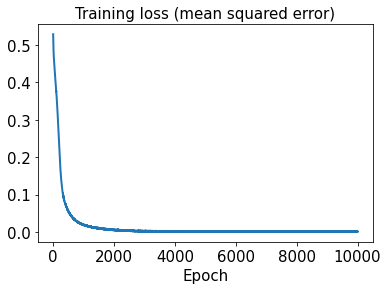

In [29]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

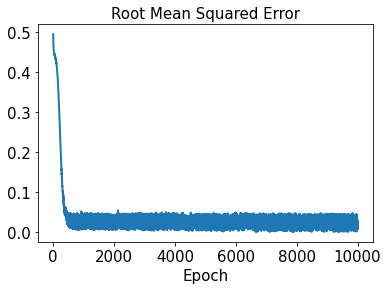

In [30]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [31]:
test_results1 = sd1.evaluate(x_test1)

1/1 [==============================] - 0s 102ms/step - loss: 3.8610e-06 - rmse: 0.0000e+00


In [32]:
decoded_sensor_train1 = sensor_pred1.predict(t_train)

In [33]:
decoded_sensor_test1 = sensor_pred1.predict(t_test)

In [34]:
decoded_train1 = sd1.predict(decoded_sensor_train1)

In [35]:
decoded_test1 = sd1.predict(decoded_sensor_test1)

In [36]:
error_train_abs1 = np.abs(decoded_train1 - y_train1)

In [37]:
error_test_abs1 = np.abs(decoded_test1 - y_test1)

In [38]:
l2_error_train1 = np.sqrt(np.sum((decoded_train1 - y_train1)**2) / np.sum(y_train1**2))
print(l2_error_train1)

0.21969372771971718


In [39]:
l2_error_test1 = np.sqrt(np.sum((decoded_test1 - y_test1)**2) / np.sum(y_test1**2))
print(l2_error_test1)

0.27343313959636123


In [40]:
l2_error_train_list1 = []
for i in range(0, len(x_train1)):
    l2_error_train_data1 = np.sqrt(np.sum((decoded_train1[i] - y_train1[i])**2) / np.sum(y_train1[i]**2))
    l2_error_train_list1.append(l2_error_train_data1)
print(l2_error_train_list1)

[0.11378112023166978, 0.29220899149820073, 0.12795679254260872, 0.161341884810221, 0.009768437066988829, 0.3216800443326921, 0.12075289494883046, 0.10268160142828517, 0.08579468883014034, 0.11990865983890872, 0.025156748285933478, 0.22205928050155546, 0.12292506965610378, 0.28104566670140807, 0.3060583017971884, 0.23422132567761114, 0.10971476853658116, 0.047353084701300056, 0.24621734659304623, 0.10600345298349592, 0.32341582714463796, 0.2580316637097703, 0.21947316490089477, 0.11454320364526342, 0.06751442230532519, 0.3202764950017449, 0.05315406360050059, 0.043750194731663826, 0.10296235337115721, 0.303117187481329, 0.11350112630451932, 0.11819141393549532, 0.43185295673991314]


In [41]:
l2_error_test_list1 = []
for i in range(0, len(x_test1)):
    l2_error_test_data1 = np.sqrt(np.sum((decoded_test1[i] - y_test1[i])**2) / np.sum(y_test1[i]**2))
    l2_error_test_list1.append(l2_error_test_data1)
print(l2_error_test_list1)

[0.10239554806968715, 0.12804585981425715, 0.3137512723824493, 0.13092881735895193, 0.2696471495988622, 0.6625653052366847, 0.020751292679962653, 0.5449366146503036]


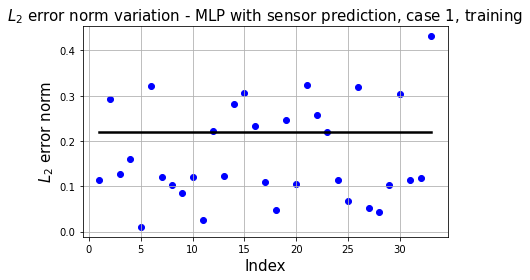

In [42]:
plt.plot(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train1*np.ones(x_train1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

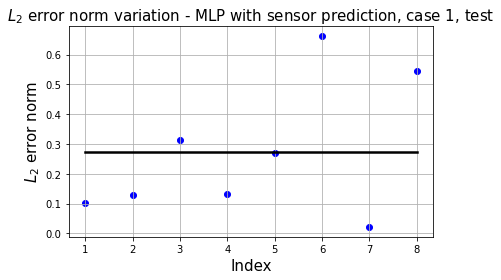

In [43]:
plt.plot(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test1*np.ones(x_test1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

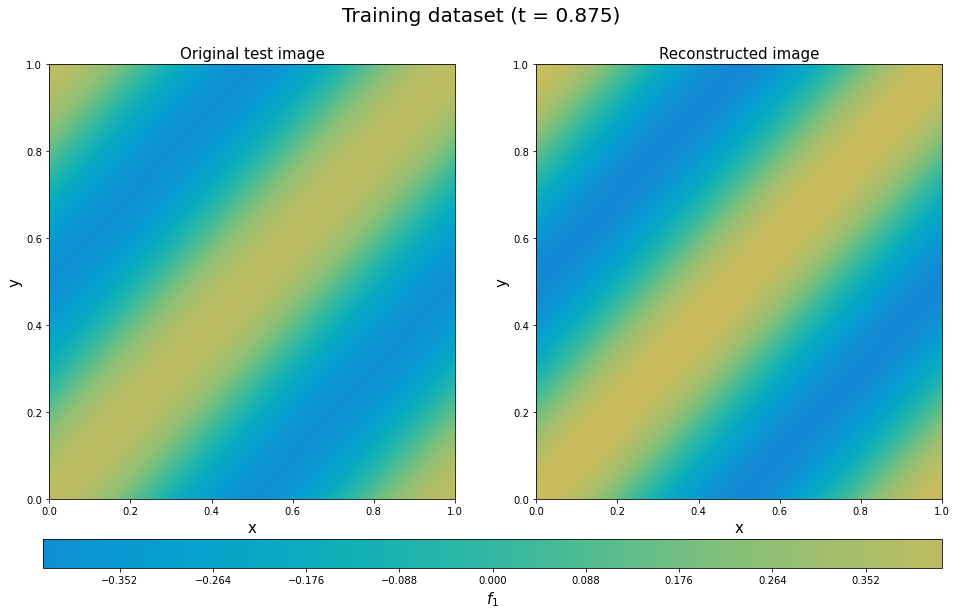

In [44]:
plt.figure(figsize=(16, 8))
y_train1_9_rotate = y_train1[9].T.reshape(101,101)
decoded_rotate1 = decoded_train1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_9_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[35]),fontsize=20)
plt.show()

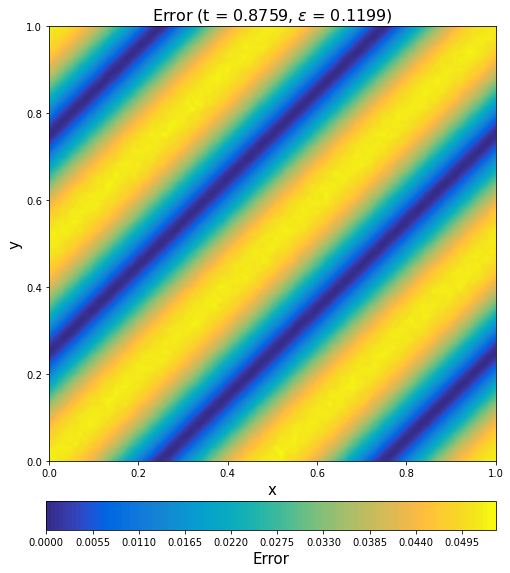

In [45]:
error_train_abs1_rotate9 = error_train_abs1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate9, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.8759, $\epsilon$ = %.4f)' %(l2_error_train_list1[9]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

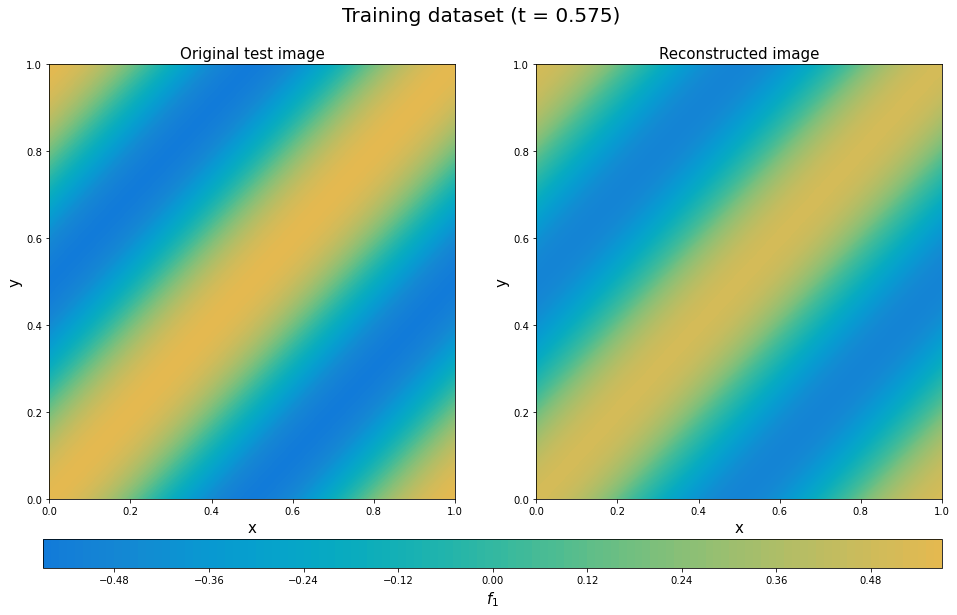

In [46]:
plt.figure(figsize=(16, 8))
y_train1_23_rotate = y_train1[23].T.reshape(101,101)
decoded_rotate1 = decoded_train1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_23_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[23]), fontsize=20)
plt.show()

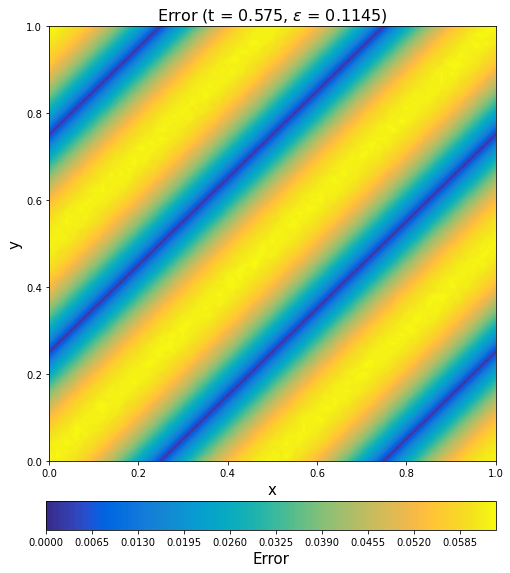

In [47]:
error_train_abs1_rotate23 = error_train_abs1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate23, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.575, $\epsilon$ = %.4f)' %(l2_error_train_list1[23]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

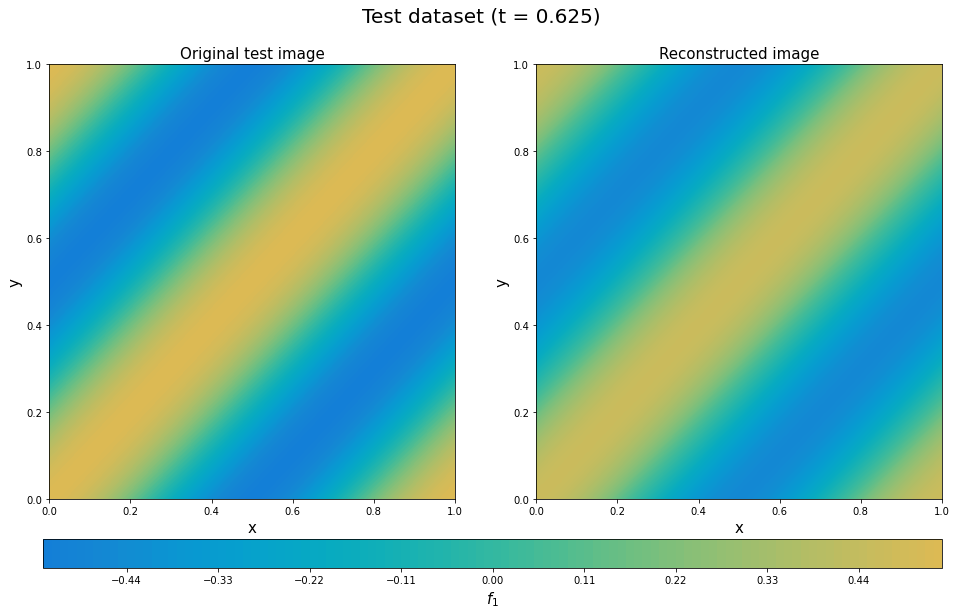

In [48]:
plt.figure(figsize=(16, 8))
y_test1_3_rotate = y_test1[3].T.reshape(101,101)
decoded_rotate1 = decoded_test1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_3_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[25]),fontsize=20)
plt.show()

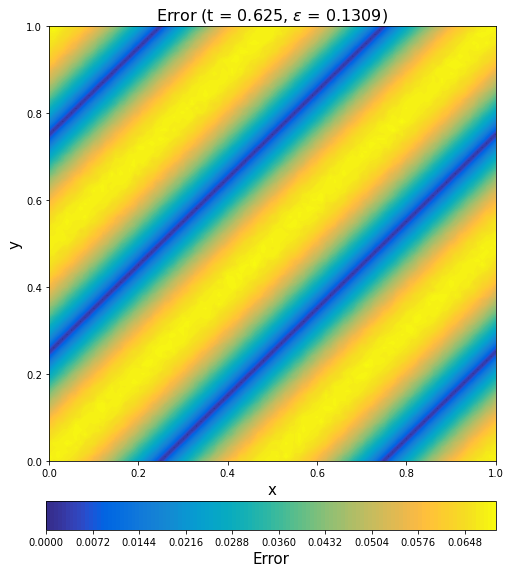

In [49]:
error_test_abs1_rotate3 = error_test_abs1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate3, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.625, $\epsilon$ = %.4f)' %(l2_error_test_list1[3]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

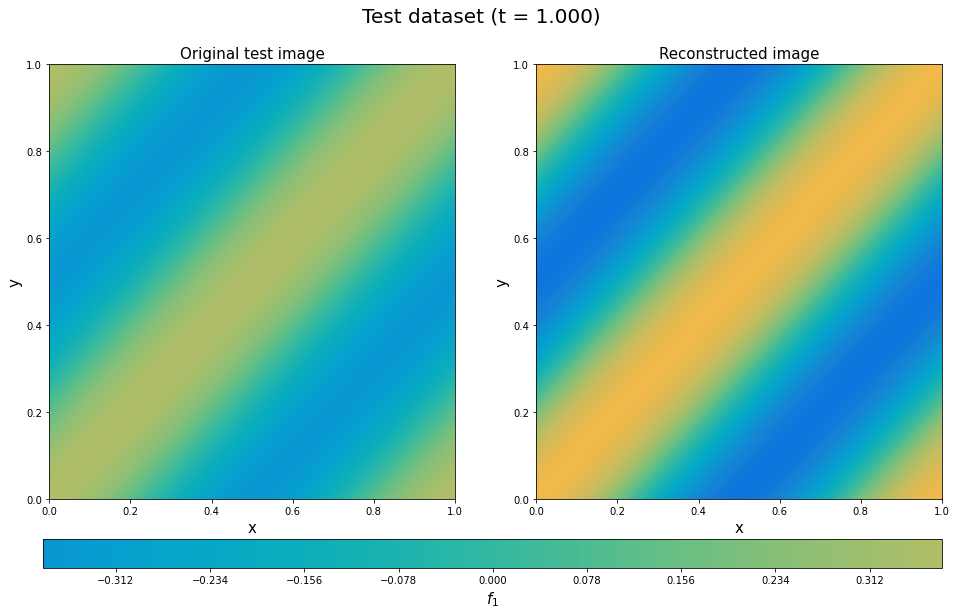

In [50]:
plt.figure(figsize=(16, 8))
y_test1_5_rotate = y_test1[5].T.reshape(101,101)
decoded_rotate1 = decoded_test1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_5_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[40]),fontsize=20)
plt.show()

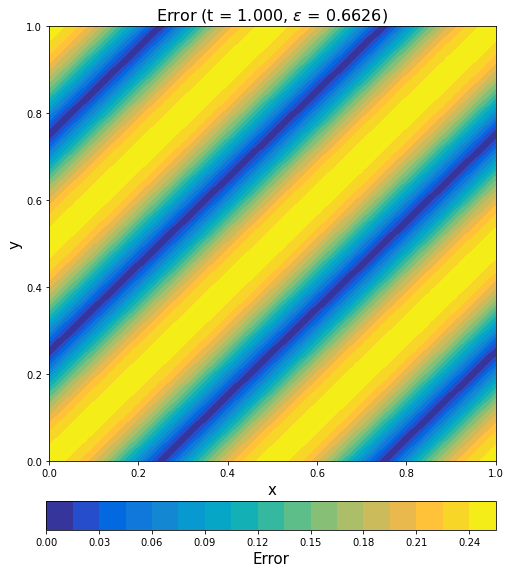

In [51]:
error_test_abs1_rotate5 = error_test_abs1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate5, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 1.000, $\epsilon$ = %.4f)' %(l2_error_test_list1[5]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 2: f2

In [52]:
out2 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out2[i, j, k] = x[j] + y[k] + t[i]

In [53]:
sensor2 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor2[i, j, k] = out2[i, 20*(j+1)+1, 20*(k+1)+1]

In [54]:
sensor2 = sensor2.reshape((41, 16, 1))

In [55]:
sensor2.shape

(41, 16, 1)

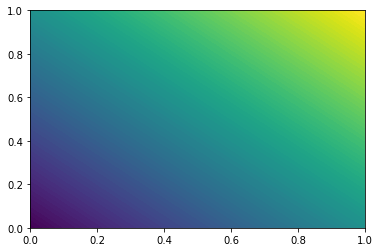

In [56]:
plt.contourf(xmesh, ymesh, out2[0,:,:], levels=128)

In [57]:
x_train2, x_test2, y_train2, y_test2, t_train, t_test = train_test_split(sensor2, out2, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [58]:
x_train2

array([[[1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945],
        [1.545],
        [1.745],
        [1.945],
        [2.145],
        [1.745],
        [1.945],
        [2.145],
        [2.345]],

       [[0.57 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.77 ]],

       [[1.07 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [2.27 ]],

       [[0.72 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [1.52 ],
        [1.12 ],
        [1.32 ],
        

In [59]:
x_test2

array([[[1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [2.22 ]],

       [[0.745],
        [0.945],
        [1.145],
        [1.345],
        [0.945],
        [1.145],
        [1.345],
        [1.545],
        [1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945]],

       [[0.62 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ]],

       [[1.045],
        [1.245],
        [1.445],
        [1.645],
        [1.245],
        [1.445],
        [1.645],
        [1.845],
        [1.445],
        [1.645],
        

In [60]:
sensor_pred2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [61]:
start2 = datetime.datetime.now()
history2 = sensor_pred2.fit(t_train, x_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 11ms/step - loss: 2.5933 - rmse: 1.6091
Epoch 2/10000
2/2 [==============================] - 0s 20ms/step - loss: 2.5654 - rmse: 1.6004
Epoch 3/10000
2/2 [==============================] - 0s 34ms/step - loss: 2.5470 - rmse: 1.5947
Epoch 4/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5324 - rmse: 1.5901
Epoch 5/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5270 - rmse: 1.5884
Epoch 6/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5149 - rmse: 1.5845
Epoch 7/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5076 - rmse: 1.5822
Epoch 8/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5022 - rmse: 1.5805
Epoch 9/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4936 - rmse: 1.5778
Epoch 10/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.4859 - rmse: 1.5754
Epoch 11/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 2.1677 - rmse: 1.4709
Epoch 87/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.1645 - rmse: 1.4698
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1609 - rmse: 1.4686
Epoch 89/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.1557 - rmse: 1.4668
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1526 - rmse: 1.4658
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1534 - rmse: 1.4661
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1504 - rmse: 1.4650
Epoch 93/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.1471 - rmse: 1.4639
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1405 - rmse: 1.4617
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1347 - rmse: 1.4597
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 11ms/step - loss: 1.8775 - rmse: 1.3687
Epoch 171/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8664 - rmse: 1.3647
Epoch 172/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8647 - rmse: 1.3640
Epoch 173/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8634 - rmse: 1.3636
Epoch 174/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8621 - rmse: 1.3631
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8534 - rmse: 1.3599
Epoch 176/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8584 - rmse: 1.3617
Epoch 177/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8485 - rmse: 1.3581
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8446 - rmse: 1.3567
Epoch 179/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8408 - rmse: 1.3553
Epoch 180/10000
2/2 [==================

2/2 [==============================] - 0s 11ms/step - loss: 1.5968 - rmse: 1.2620
Epoch 255/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5892 - rmse: 1.2590
Epoch 256/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5841 - rmse: 1.2570
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5802 - rmse: 1.2555
Epoch 258/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5804 - rmse: 1.2555
Epoch 259/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5740 - rmse: 1.2530
Epoch 260/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5708 - rmse: 1.2517
Epoch 261/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5700 - rmse: 1.2514
Epoch 262/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5651 - rmse: 1.2494
Epoch 263/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5676 - rmse: 1.2504
Epoch 264/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 1.3372 - rmse: 1.1546
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3319 - rmse: 1.1523
Epoch 340/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3307 - rmse: 1.1518
Epoch 341/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3289 - rmse: 1.1510
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3197 - rmse: 1.1470
Epoch 343/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3226 - rmse: 1.1483
Epoch 344/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3144 - rmse: 1.1447
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3163 - rmse: 1.1456
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3087 - rmse: 1.1422
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3081 - rmse: 1.1420
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 1.0991 - rmse: 1.0465
Epoch 423/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0988 - rmse: 1.0463
Epoch 424/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0917 - rmse: 1.0429
Epoch 425/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0909 - rmse: 1.0425
Epoch 426/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0845 - rmse: 1.0395
Epoch 427/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0845 - rmse: 1.0395
Epoch 428/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0795 - rmse: 1.0371
Epoch 429/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0824 - rmse: 1.0384
Epoch 430/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0763 - rmse: 1.0355
Epoch 431/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0717 - rmse: 1.0333
Epoch 432/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 0.8814 - rmse: 0.9367
Epoch 507/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8869 - rmse: 0.9396
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8783 - rmse: 0.9351
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8792 - rmse: 0.9356
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8720 - rmse: 0.9317
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8693 - rmse: 0.9302
Epoch 512/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8670 - rmse: 0.9290
Epoch 513/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8645 - rmse: 0.9276
Epoch 514/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8626 - rmse: 0.9266
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8665 - rmse: 0.9287
Epoch 516/10000
2/2 [====================

2/2 [==============================] - 0s 10ms/step - loss: 0.6944 - rmse: 0.8309
Epoch 591/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6922 - rmse: 0.8296
Epoch 592/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6909 - rmse: 0.8288
Epoch 593/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6875 - rmse: 0.8268
Epoch 594/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6904 - rmse: 0.8285
Epoch 595/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6850 - rmse: 0.8252
Epoch 596/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6858 - rmse: 0.8257
Epoch 597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6807 - rmse: 0.8226
Epoch 598/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6791 - rmse: 0.8216
Epoch 599/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6756 - rmse: 0.8195
Epoch 600/10000
2/2 [=================

2/2 [==============================] - 0s 9ms/step - loss: 0.5341 - rmse: 0.7281
Epoch 675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5289 - rmse: 0.7245
Epoch 676/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5309 - rmse: 0.7259
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5312 - rmse: 0.7261
Epoch 678/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5294 - rmse: 0.7249
Epoch 679/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5220 - rmse: 0.7198
Epoch 680/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5230 - rmse: 0.7205
Epoch 681/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5221 - rmse: 0.7199
Epoch 682/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5218 - rmse: 0.7197
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5167 - rmse: 0.7161
Epoch 684/10000
2/2 [===================

2/2 [==============================] - 0s 7ms/step - loss: 0.4099 - rmse: 0.6372
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4092 - rmse: 0.6366
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4045 - rmse: 0.6329
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4044 - rmse: 0.6328
Epoch 762/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4047 - rmse: 0.6331
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3988 - rmse: 0.6284
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3946 - rmse: 0.6251
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4002 - rmse: 0.6295
Epoch 766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3926 - rmse: 0.6234
Epoch 767/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.3908 - rmse: 0.6220
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.3017 - rmse: 0.5457
Epoch 843/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2985 - rmse: 0.5428
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2978 - rmse: 0.5421
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2959 - rmse: 0.5403
Epoch 846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2956 - rmse: 0.5401
Epoch 847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2927 - rmse: 0.5374
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2969 - rmse: 0.5413
Epoch 849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2945 - rmse: 0.5391
Epoch 850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2939 - rmse: 0.5385
Epoch 851/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2879 - rmse: 0.5329
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.2106 - rmse: 0.4547
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2111 - rmse: 0.4552
Epoch 928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2096 - rmse: 0.4536
Epoch 929/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2138 - rmse: 0.4581
Epoch 930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2102 - rmse: 0.4542
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2069 - rmse: 0.4506
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2082 - rmse: 0.4520
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2132 - rmse: 0.4575
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2057 - rmse: 0.4493
Epoch 935/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2064 - rmse: 0.4500
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.1512 - rmse: 0.3838
Epoch 1011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1538 - rmse: 0.3872
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1482 - rmse: 0.3800
Epoch 1013/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1496 - rmse: 0.3817
Epoch 1014/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1507 - rmse: 0.3832
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1456 - rmse: 0.3765
Epoch 1016/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1454 - rmse: 0.3762
Epoch 1017/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1497 - rmse: 0.3819
Epoch 1018/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1468 - rmse: 0.3781
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1469 - rmse: 0.3782
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.1027 - rmse: 0.3144
Epoch 1094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1051 - rmse: 0.3183
Epoch 1095/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1022 - rmse: 0.3137
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1069 - rmse: 0.3211
Epoch 1097/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1027 - rmse: 0.3144
Epoch 1098/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1007 - rmse: 0.3113
Epoch 1099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1057 - rmse: 0.3192
Epoch 1100/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1014 - rmse: 0.3123
Epoch 1101/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1022 - rmse: 0.3137
Epoch 1102/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0998 - rmse: 0.3098
Epoch 1103/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0718 - rmse: 0.2606
Epoch 1177/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0705 - rmse: 0.2582
Epoch 1178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0700 - rmse: 0.2572
Epoch 1179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0731 - rmse: 0.2632
Epoch 1180/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0693 - rmse: 0.2558
Epoch 1181/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0684 - rmse: 0.2541
Epoch 1182/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0684 - rmse: 0.2542
Epoch 1183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0680 - rmse: 0.2534
Epoch 1184/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0659 - rmse: 0.2492
Epoch 1185/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0669 - rmse: 0.2511
Epoch 1186/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0481 - rmse: 0.2104
Epoch 1260/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0505 - rmse: 0.2160
Epoch 1261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0442 - rmse: 0.2011
Epoch 1262/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0438 - rmse: 0.1999
Epoch 1263/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0476 - rmse: 0.2092
Epoch 1264/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0477 - rmse: 0.2096
Epoch 1265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0429 - rmse: 0.1977
Epoch 1266/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0428 - rmse: 0.1975
Epoch 1267/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0420 - rmse: 0.1955
Epoch 1268/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0421 - rmse: 0.1958
Epoch 1269/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0284 - rmse: 0.1568
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0344 - rmse: 0.1749
Epoch 1344/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0308 - rmse: 0.1642
Epoch 1345/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0294 - rmse: 0.1602
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0278 - rmse: 0.1551
Epoch 1347/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0297 - rmse: 0.1610
Epoch 1348/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0280 - rmse: 0.1556
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0293 - rmse: 0.1596
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0309 - rmse: 0.1648
Epoch 1351/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0296 - rmse: 0.1608
Epoch 1352/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0201 - rmse: 0.1277
Epoch 1426/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0210 - rmse: 0.1312
Epoch 1427/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0193 - rmse: 0.1248
Epoch 1428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0186 - rmse: 0.1217
Epoch 1429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0172 - rmse: 0.1160
Epoch 1430/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0184 - rmse: 0.1211
Epoch 1431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0186 - rmse: 0.1220
Epoch 1432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0179 - rmse: 0.1190
Epoch 1433/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0220 - rmse: 0.1350
Epoch 1434/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0243 - rmse: 0.1435
Epoch 1435/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0131 - rmse: 0.0966
Epoch 1509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0184 - rmse: 0.1210
Epoch 1510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0118 - rmse: 0.0898
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0123 - rmse: 0.0927
Epoch 1512/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0118 - rmse: 0.0896
Epoch 1513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0165 - rmse: 0.1132
Epoch 1514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0123 - rmse: 0.0928
Epoch 1515/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0125 - rmse: 0.0935
Epoch 1516/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0183 - rmse: 0.1208
Epoch 1517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0125 - rmse: 0.0938
Epoch 1518/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0771
Epoch 1592/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0135 - rmse: 0.0989
Epoch 1593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0651
Epoch 1594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0112 - rmse: 0.0867
Epoch 1595/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0658
Epoch 1596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0125 - rmse: 0.0940
Epoch 1597/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0142 - rmse: 0.1022
Epoch 1598/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0640
Epoch 1599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0768
Epoch 1600/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0099 - rmse: 0.0788
Epoch 1601/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0506
Epoch 1675/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0509
Epoch 1676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0106 - rmse: 0.0832
Epoch 1677/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0519
Epoch 1678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0679
Epoch 1679/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0754
Epoch 1680/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0118 - rmse: 0.0899
Epoch 1681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0125 - rmse: 0.0940
Epoch 1682/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0779
Epoch 1683/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0100 - rmse: 0.0793
Epoch 1684/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0531
Epoch 1758/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0712
Epoch 1759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0677
Epoch 1760/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0386
Epoch 1761/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0110 - rmse: 0.0857
Epoch 1762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0459
Epoch 1763/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0734
Epoch 1764/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0514
Epoch 1765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0110 - rmse: 0.0859
Epoch 1766/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0481
Epoch 1767/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0359
Epoch 1841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0367
Epoch 1842/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0114 - rmse: 0.0881
Epoch 1843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0595
Epoch 1844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0108 - rmse: 0.0845
Epoch 1845/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0101 - rmse: 0.0801
Epoch 1846/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0114 - rmse: 0.0880
Epoch 1847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0374
Epoch 1848/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0115 - rmse: 0.0885
Epoch 1849/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0714
Epoch 1850/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0796
Epoch 1924/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0649
Epoch 1925/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0523
Epoch 1926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0407
Epoch 1927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.0910
Epoch 1928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0661
Epoch 1929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0281
Epoch 1930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0285
Epoch 1931/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0559
Epoch 1932/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0282
Epoch 1933/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0105 - rmse: 0.0832
Epoch 2007/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0545
Epoch 2008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0468
Epoch 2009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0236
Epoch 2010/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0222
Epoch 2011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0666
Epoch 2012/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0465
Epoch 2013/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0099 - rmse: 0.0796
Epoch 2014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0232
Epoch 2015/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0502
Epoch 2016/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0537
Epoch 2090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0101 - rmse: 0.0805
Epoch 2091/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0509
Epoch 2092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0199
Epoch 2093/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0211
Epoch 2094/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0232
Epoch 2095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0431
Epoch 2096/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0381
Epoch 2097/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0100 - rmse: 0.0802
Epoch 2098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0105 - rmse: 0.0832
Epoch 2099/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0689
Epoch 2173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0563
Epoch 2174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0752
Epoch 2175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0583
Epoch 2176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0486
Epoch 2177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0242
Epoch 2178/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0629
Epoch 2179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0702
Epoch 2180/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0379
Epoch 2181/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0291
Epoch 2182/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0237
Epoch 2256/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0106 - rmse: 0.0841
Epoch 2257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0171
Epoch 2258/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0107 - rmse: 0.0846
Epoch 2259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0491
Epoch 2260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0731
Epoch 2261/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0360
Epoch 2262/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0525
Epoch 2263/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0557
Epoch 2264/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0100 - rmse: 0.0804
Epoch 2265/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0374
Epoch 2339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0104 - rmse: 0.0832
Epoch 2340/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0078 - rmse: 0.0652
Epoch 2341/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0563
Epoch 2342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0106 - rmse: 0.0840
Epoch 2343/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0117 - rmse: 0.0902
Epoch 2344/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0313
Epoch 2345/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0487
Epoch 2346/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0402
Epoch 2347/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0110 - rmse: 0.0867
Epoch 2348/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0272
Epoch 2422/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0280
Epoch 2423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0528
Epoch 2424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0239
Epoch 2425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0240
Epoch 2426/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0617
Epoch 2427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0687
Epoch 2428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0333
Epoch 2429/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0478
Epoch 2430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0108 - rmse: 0.0854
Epoch 2431/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0273
Epoch 2505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0360
Epoch 2506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0184
Epoch 2507/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0456
Epoch 2508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0423
Epoch 2509/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0052 - rmse: 0.0414
Epoch 2510/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0405
Epoch 2511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0398
Epoch 2512/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0220
Epoch 2513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0670
Epoch 2514/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0185
Epoch 2588/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0103 - rmse: 0.0828
Epoch 2589/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0299
Epoch 2590/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0092 - rmse: 0.0758
Epoch 2591/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0239
Epoch 2592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0362
Epoch 2593/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0101 - rmse: 0.0813
Epoch 2594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0572
Epoch 2595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0372
Epoch 2596/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0489
Epoch 2597/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0800
Epoch 2671/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0295
Epoch 2672/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0669
Epoch 2673/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0480
Epoch 2674/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0805
Epoch 2675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0696
Epoch 2676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0112 - rmse: 0.0879
Epoch 2677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0269
Epoch 2678/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0202
Epoch 2679/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0115 - rmse: 0.0898
Epoch 2680/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0367
Epoch 2754/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0752
Epoch 2755/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0754
Epoch 2756/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0421
Epoch 2757/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0434
Epoch 2758/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0217
Epoch 2759/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0541
Epoch 2760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0185
Epoch 2761/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0207
Epoch 2762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0368
Epoch 2763/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0398
Epoch 2837/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0221
Epoch 2838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0445
Epoch 2839/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0400
Epoch 2840/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0504
Epoch 2841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0161
Epoch 2842/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0315
Epoch 2843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0304
Epoch 2844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0799
Epoch 2845/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0129
Epoch 2846/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0326
Epoch 2920/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0582
Epoch 2921/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0403
Epoch 2922/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0819
Epoch 2923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0782
Epoch 2924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0775
Epoch 2925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0229
Epoch 2926/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0448
Epoch 2927/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0475
Epoch 2928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0394
Epoch 2929/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0574
Epoch 3003/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0302
Epoch 3004/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0607
Epoch 3005/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0653
Epoch 3006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0675
Epoch 3007/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0353
Epoch 3008/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0199
Epoch 3009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0431
Epoch 3010/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0305
Epoch 3011/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0666
Epoch 3012/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0191
Epoch 3086/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0125
Epoch 3087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0618
Epoch 3088/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0790
Epoch 3089/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0659
Epoch 3090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0216
Epoch 3091/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0655
Epoch 3092/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0590
Epoch 3093/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0567
Epoch 3094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0102
Epoch 3095/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0184
Epoch 3169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0429
Epoch 3170/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0644
Epoch 3171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0179
Epoch 3172/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0517
Epoch 3173/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0153
Epoch 3174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0392
Epoch 3175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0049 - rmse: 0.0401
Epoch 3176/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0795
Epoch 3177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0198
Epoch 3178/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.0081 - rmse: 0.0692
Epoch 3252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0796
Epoch 3253/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0094 - rmse: 0.0782
Epoch 3254/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0231
Epoch 3255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0329
Epoch 3256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0105 - rmse: 0.0849
Epoch 3257/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0438
Epoch 3258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0309
Epoch 3259/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0335
Epoch 3260/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0442
Epoch 3261/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0583
Epoch 3335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0110 - rmse: 0.0879
Epoch 3336/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0739
Epoch 3337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0777
Epoch 3338/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0092 - rmse: 0.0773
Epoch 3339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0439
Epoch 3340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0790
Epoch 3341/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0440
Epoch 3342/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0159
Epoch 3343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0219
Epoch 3344/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0694
Epoch 3418/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0139
Epoch 3419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0389
Epoch 3420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0380
Epoch 3421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0440
Epoch 3422/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0520
Epoch 3423/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0357
Epoch 3424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0686
Epoch 3425/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0140
Epoch 3426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0388
Epoch 3427/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0225
Epoch 3501/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0675
Epoch 3502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0505
Epoch 3503/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0234
Epoch 3504/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0116 - rmse: 0.0915
Epoch 3505/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0605
Epoch 3506/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0611
Epoch 3507/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0665
Epoch 3508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0671
Epoch 3509/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0699
Epoch 3510/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0111 - rmse: 0.0892
Epoch 3584/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0261
Epoch 3585/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0435
Epoch 3586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0491
Epoch 3587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0292
Epoch 3588/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0202
Epoch 3589/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0369
Epoch 3590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0402
Epoch 3591/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0347
Epoch 3592/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0799
Epoch 3593/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0656
Epoch 3667/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0802
Epoch 3668/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0273
Epoch 3669/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0104 - rmse: 0.0853
Epoch 3670/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0475
Epoch 3671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0228
Epoch 3672/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0704
Epoch 3673/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0601
Epoch 3674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0453
Epoch 3675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0602
Epoch 3676/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0482
Epoch 3750/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0753
Epoch 3751/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0393
Epoch 3752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0738
Epoch 3753/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0302
Epoch 3754/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0745
Epoch 3755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0188
Epoch 3756/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0800
Epoch 3757/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0776
Epoch 3758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0296
Epoch 3759/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0654
Epoch 3832/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0672
Epoch 3833/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0285
Epoch 3834/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0755
Epoch 3835/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0101 - rmse: 0.0835
Epoch 3836/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0318
Epoch 3837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0116 - rmse: 0.0921
Epoch 3838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0262
Epoch 3839/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0495
Epoch 3840/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0554
Epoch 3841/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0119
Epoch 3915/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0255
Epoch 3916/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0480
Epoch 3917/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0311
Epoch 3918/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0695
Epoch 3919/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0110 - rmse: 0.0890
Epoch 3920/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0738
Epoch 3921/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0099 - rmse: 0.0827
Epoch 3922/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0100 - rmse: 0.0832
Epoch 3923/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0791
Epoch 3924/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0265
Epoch 3998/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0350
Epoch 3999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0429
Epoch 4000/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0509
Epoch 4001/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0232
Epoch 4002/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0602
Epoch 4003/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0197
Epoch 4004/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0309
Epoch 4005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0478
Epoch 4006/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0611
Epoch 4007/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0547
Epoch 4081/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0092 - rmse: 0.0784
Epoch 4082/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0626
Epoch 4083/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0671
Epoch 4084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0344
Epoch 4085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0611
Epoch 4086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0206
Epoch 4087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0804
Epoch 4088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0364
Epoch 4089/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0167
Epoch 4090/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0176
Epoch 4164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0293
Epoch 4165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0604
Epoch 4166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0107 - rmse: 0.0879
Epoch 4167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0166
Epoch 4168/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0150
Epoch 4169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0844
Epoch 4170/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0621
Epoch 4171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0660
Epoch 4172/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0563
Epoch 4173/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0182
Epoch 4247/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0783
Epoch 4248/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0546
Epoch 4249/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0100 - rmse: 0.0839
Epoch 4250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0267
Epoch 4251/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0386
Epoch 4252/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0101 - rmse: 0.0844
Epoch 4253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0777
Epoch 4254/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0220
Epoch 4255/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0673
Epoch 4256/10000
2/2 [==========

2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0269
Epoch 4330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0760
Epoch 4331/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0268
Epoch 4332/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0662
Epoch 4333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0458
Epoch 4334/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0311
Epoch 4335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0708
Epoch 4336/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0238
Epoch 4337/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0602
Epoch 4338/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0685
Epoch 4339/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0100 - rmse: 0.0842
Epoch 4413/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0351
Epoch 4414/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0199
Epoch 4415/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0414
Epoch 4416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0521
Epoch 4417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0701
Epoch 4418/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0383
Epoch 4419/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0319
Epoch 4420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0658
Epoch 4421/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0408
Epoch 4422/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0738
Epoch 4496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0186
Epoch 4497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0549
Epoch 4498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0168
Epoch 4499/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0374
Epoch 4500/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0575
Epoch 4501/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0343
Epoch 4502/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0598
Epoch 4503/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0608
Epoch 4504/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0475
Epoch 4505/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0293
Epoch 4579/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0395
Epoch 4580/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0439
Epoch 4581/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0348
Epoch 4582/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0422
Epoch 4583/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0099 - rmse: 0.0835
Epoch 4584/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0734
Epoch 4585/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0164
Epoch 4586/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0481
Epoch 4587/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0788
Epoch 4588/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0564
Epoch 4662/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0370
Epoch 4663/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0302
Epoch 4664/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0262
Epoch 4665/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0350
Epoch 4666/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0650
Epoch 4667/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0769
Epoch 4668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0482
Epoch 4669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0506
Epoch 4670/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0281
Epoch 4671/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0290
Epoch 4745/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0318
Epoch 4746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0105 - rmse: 0.0873
Epoch 4747/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0554
Epoch 4748/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0833
Epoch 4749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0500
Epoch 4750/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0786
Epoch 4751/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0403
Epoch 4752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0303
Epoch 4753/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0324
Epoch 4754/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0602
Epoch 4828/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0108 - rmse: 0.0893
Epoch 4829/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0804
Epoch 4830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0418
Epoch 4831/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0632
Epoch 4832/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0526
Epoch 4833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0641
Epoch 4834/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0279
Epoch 4835/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0102 - rmse: 0.0857
Epoch 4836/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0523
Epoch 4837/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0396
Epoch 4911/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0648
Epoch 4912/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0517
Epoch 4913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0771
Epoch 4914/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0282
Epoch 4915/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0783
Epoch 4916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0610
Epoch 4917/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0294
Epoch 4918/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0271
Epoch 4919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0791
Epoch 4920/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0498
Epoch 4994/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0509
Epoch 4995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0490
Epoch 4996/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0642
Epoch 4997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0698
Epoch 4998/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0106 - rmse: 0.0885
Epoch 4999/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0383
Epoch 5000/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0227
Epoch 5001/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0578
Epoch 5002/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0439
Epoch 5003/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0190
Epoch 5077/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0294
Epoch 5078/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0302
Epoch 5079/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0812
Epoch 5080/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0600
Epoch 5081/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0769
Epoch 5082/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0858
Epoch 5083/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0683
Epoch 5084/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0559
Epoch 5085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0776
Epoch 5086/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0169
Epoch 5160/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0583
Epoch 5161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0413
Epoch 5162/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0695
Epoch 5163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0634
Epoch 5164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0782
Epoch 5165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0748
Epoch 5166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0171
Epoch 5167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0460
Epoch 5168/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0052 - rmse: 0.0495
Epoch 5169/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0558
Epoch 5243/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0420
Epoch 5244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0798
Epoch 5245/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0252
Epoch 5246/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0519
Epoch 5247/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0173
Epoch 5248/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0104
Epoch 5249/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0172
Epoch 5250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0138
Epoch 5251/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0743
Epoch 5252/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0669
Epoch 5326/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0223
Epoch 5327/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0482
Epoch 5328/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0829
Epoch 5329/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0243
Epoch 5330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0410
Epoch 5331/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0184
Epoch 5332/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0364
Epoch 5333/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0139
Epoch 5334/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0840
Epoch 5335/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0793
Epoch 5409/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0204
Epoch 5410/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0515
Epoch 5411/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0631
Epoch 5412/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0133
Epoch 5413/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0746
Epoch 5414/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0249
Epoch 5415/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0613
Epoch 5416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0182
Epoch 5417/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0786
Epoch 5418/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0238
Epoch 5492/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0260
Epoch 5493/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0247
Epoch 5494/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0421
Epoch 5495/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0457
Epoch 5496/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0800
Epoch 5497/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0670
Epoch 5498/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0709
Epoch 5499/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0801
Epoch 5500/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0206
Epoch 5501/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0723
Epoch 5575/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0603
Epoch 5576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0683
Epoch 5577/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0339
Epoch 5578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0644
Epoch 5579/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0104 - rmse: 0.0883
Epoch 5580/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0410
Epoch 5581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0512
Epoch 5582/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0524
Epoch 5583/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0336
Epoch 5584/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0646
Epoch 5658/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0140
Epoch 5659/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0731
Epoch 5660/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0401
Epoch 5661/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0526
Epoch 5662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0683
Epoch 5663/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0247
Epoch 5664/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0582
Epoch 5665/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0127
Epoch 5666/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0595
Epoch 5667/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0599
Epoch 5741/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0282
Epoch 5742/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0505
Epoch 5743/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0857
Epoch 5744/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0524
Epoch 5745/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0808
Epoch 5746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0589
Epoch 5747/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0107 - rmse: 0.0901
Epoch 5748/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0717
Epoch 5749/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0265
Epoch 5750/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0387
Epoch 5824/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0117
Epoch 5825/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0513
Epoch 5826/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0112
Epoch 5827/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0294
Epoch 5828/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0730
Epoch 5829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0450
Epoch 5830/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0389
Epoch 5831/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0432
Epoch 5832/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0466
Epoch 5833/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0132
Epoch 5907/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0429
Epoch 5908/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0311
Epoch 5909/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0575
Epoch 5910/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0525
Epoch 5911/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0647
Epoch 5912/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0104 - rmse: 0.0888
Epoch 5913/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0444
Epoch 5914/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0224
Epoch 5915/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0378
Epoch 5916/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0651
Epoch 5990/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0771
Epoch 5991/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0442
Epoch 5992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0711
Epoch 5993/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0488
Epoch 5994/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0078 - rmse: 0.0729
Epoch 5995/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0399
Epoch 5996/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0563
Epoch 5997/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0671
Epoch 5998/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0092 - rmse: 0.0820
Epoch 5999/10000
2/2 [============

2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0480
Epoch 6073/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0597
Epoch 6074/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0433
Epoch 6075/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0832
Epoch 6076/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0220
Epoch 6077/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0156
Epoch 6078/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0151
Epoch 6079/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0193
Epoch 6080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0153
Epoch 6081/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0189
Epoch 6082/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0850
Epoch 6156/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0470
Epoch 6157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0216
Epoch 6158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0513
Epoch 6159/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0415
Epoch 6160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0381
Epoch 6161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0094 - rmse: 0.0832
Epoch 6162/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0499
Epoch 6163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0795
Epoch 6164/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0102 - rmse: 0.0879
Epoch 6165/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0241
Epoch 6239/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0574
Epoch 6240/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0473
Epoch 6241/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0400
Epoch 6242/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0829
Epoch 6243/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0692
Epoch 6244/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0512
Epoch 6245/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0789
Epoch 6246/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0717
Epoch 6247/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0222
Epoch 6248/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0235
Epoch 6322/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0478
Epoch 6323/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0653
Epoch 6324/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0688
Epoch 6325/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0086 - rmse: 0.0789
Epoch 6326/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0522
Epoch 6327/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0796
Epoch 6328/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0150
Epoch 6329/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0168
Epoch 6330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0830
Epoch 6331/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0653
Epoch 6405/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0477
Epoch 6406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0104 - rmse: 0.0895
Epoch 6407/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0662
Epoch 6408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0356
Epoch 6409/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0351
Epoch 6410/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0327
Epoch 6411/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0298
Epoch 6412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0110 - rmse: 0.0930
Epoch 6413/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0822
Epoch 6414/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0436
Epoch 6488/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0468
Epoch 6489/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0254
Epoch 6490/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0281
Epoch 6491/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0603
Epoch 6492/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0419
Epoch 6493/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0229
Epoch 6494/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0427
Epoch 6495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0268
Epoch 6496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0102 - rmse: 0.0887
Epoch 6497/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0519
Epoch 6571/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0433
Epoch 6572/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0504
Epoch 6573/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0771
Epoch 6574/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0249
Epoch 6575/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0432
Epoch 6576/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0539
Epoch 6577/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0418
Epoch 6578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0377
Epoch 6579/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0225
Epoch 6580/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0651
Epoch 6654/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0181
Epoch 6655/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0437
Epoch 6656/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0229
Epoch 6657/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0747
Epoch 6658/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0431
Epoch 6659/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0432
Epoch 6660/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0202
Epoch 6661/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0295
Epoch 6662/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0489
Epoch 6663/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0577
Epoch 6737/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0372
Epoch 6738/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0481
Epoch 6739/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0840
Epoch 6740/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0746
Epoch 6741/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0836
Epoch 6742/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0197
Epoch 6743/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0449
Epoch 6744/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0471
Epoch 6745/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0433
Epoch 6746/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0100 - rmse: 0.0881
Epoch 6820/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0234
Epoch 6821/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0520
Epoch 6822/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0578
Epoch 6823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0778
Epoch 6824/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0201
Epoch 6825/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0534
Epoch 6826/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0675
Epoch 6827/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0482
Epoch 6828/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0839
Epoch 6829/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0119
Epoch 6903/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0105
Epoch 6904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0661
Epoch 6905/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0643
Epoch 6906/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0217
Epoch 6907/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0755
Epoch 6908/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0126
Epoch 6909/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0378
Epoch 6910/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0556
Epoch 6911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0614
Epoch 6912/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0664
Epoch 6986/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0159
Epoch 6987/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0173
Epoch 6988/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0125
Epoch 6989/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0404
Epoch 6990/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0524
Epoch 6991/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0475
Epoch 6992/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0842
Epoch 6993/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0562
Epoch 6994/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0831
Epoch 6995/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0609
Epoch 7069/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0648
Epoch 7070/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0560
Epoch 7071/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0441
Epoch 7072/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0397
Epoch 7073/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0610
Epoch 7074/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0304
Epoch 7075/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0776
Epoch 7076/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0361
Epoch 7077/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0301
Epoch 7078/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0601
Epoch 7152/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0557
Epoch 7153/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0204
Epoch 7154/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0186
Epoch 7155/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0310
Epoch 7156/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0607
Epoch 7157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0750
Epoch 7158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0220
Epoch 7159/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0623
Epoch 7160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0316
Epoch 7161/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0281
Epoch 7235/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0651
Epoch 7236/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0272
Epoch 7237/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0679
Epoch 7238/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0350
Epoch 7239/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0236
Epoch 7240/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0523
Epoch 7241/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0249
Epoch 7242/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0314
Epoch 7243/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0344
Epoch 7244/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0490
Epoch 7318/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0187
Epoch 7319/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0413
Epoch 7320/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0130
Epoch 7321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0238
Epoch 7322/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0197
Epoch 7323/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0345
Epoch 7324/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0399
Epoch 7325/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0691
Epoch 7326/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0438
Epoch 7327/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0741
Epoch 7401/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0562
Epoch 7402/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0200
Epoch 7403/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0134
Epoch 7404/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0600
Epoch 7405/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0468
Epoch 7406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0099
Epoch 7407/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0601
Epoch 7408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0454
Epoch 7409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0142
Epoch 7410/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0306
Epoch 7484/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0099 - rmse: 0.0883
Epoch 7485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0825
Epoch 7486/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0742
Epoch 7487/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0563
Epoch 7488/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0784
Epoch 7489/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0791
Epoch 7490/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0211
Epoch 7491/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0142
Epoch 7492/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0191
Epoch 7493/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0817
Epoch 7567/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0791
Epoch 7568/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0441
Epoch 7569/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0310
Epoch 7570/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0129
Epoch 7571/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0189
Epoch 7572/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0164
Epoch 7573/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0516
Epoch 7574/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0837
Epoch 7575/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0737
Epoch 7576/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0202
Epoch 7650/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0233
Epoch 7651/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0395
Epoch 7652/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0474
Epoch 7653/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0689
Epoch 7654/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0597
Epoch 7655/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0773
Epoch 7656/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0774
Epoch 7657/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0175
Epoch 7658/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0587
Epoch 7659/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0064 - rmse: 0.0664
Epoch 7733/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0688
Epoch 7734/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0137
Epoch 7735/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0275
Epoch 7736/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0091 - rmse: 0.0838
Epoch 7737/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0877
Epoch 7738/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0415
Epoch 7739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0827
Epoch 7740/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0780
Epoch 7741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0572
Epoch 7742/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0892
Epoch 7816/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0243
Epoch 7817/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0092
Epoch 7818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0336
Epoch 7819/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0384
Epoch 7820/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0135
Epoch 7821/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0581
Epoch 7822/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0221
Epoch 7823/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0108
Epoch 7824/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0762
Epoch 7825/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0196
Epoch 7899/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0442
Epoch 7900/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0392
Epoch 7901/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0832
Epoch 7902/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0156
Epoch 7903/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0205
Epoch 7904/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0525
Epoch 7905/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0294
Epoch 7906/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0576
Epoch 7907/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0436
Epoch 7908/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0302
Epoch 7982/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0163
Epoch 7983/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0156
Epoch 7984/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0179
Epoch 7985/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0778
Epoch 7986/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0249
Epoch 7987/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0435
Epoch 7988/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0350
Epoch 7989/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0349
Epoch 7990/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0344
Epoch 7991/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0494
Epoch 8065/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0660
Epoch 8066/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0699
Epoch 8067/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0790
Epoch 8068/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0152
Epoch 8069/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0832
Epoch 8070/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0668
Epoch 8071/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0656
Epoch 8072/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0181
Epoch 8073/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0586
Epoch 8074/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0165
Epoch 8148/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0478
Epoch 8149/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0105
Epoch 8150/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0611
Epoch 8151/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0242
Epoch 8152/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0146
Epoch 8153/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0272
Epoch 8154/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0835
Epoch 8155/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0615
Epoch 8156/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0152
Epoch 8157/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0793
Epoch 8231/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0783
Epoch 8232/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0584
Epoch 8233/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0393
Epoch 8234/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0800
Epoch 8235/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0117
Epoch 8236/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0398
Epoch 8237/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0744
Epoch 8238/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0643
Epoch 8239/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0478
Epoch 8240/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0482
Epoch 8314/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0612
Epoch 8315/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0285
Epoch 8316/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0781
Epoch 8317/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0698
Epoch 8318/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0734
Epoch 8319/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0434
Epoch 8320/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0750
Epoch 8321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0140
Epoch 8322/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0400
Epoch 8323/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0209
Epoch 8397/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0098 - rmse: 0.0891
Epoch 8398/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0466
Epoch 8399/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0189
Epoch 8400/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0321
Epoch 8401/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0307
Epoch 8402/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0839
Epoch 8403/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0327
Epoch 8404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0635
Epoch 8405/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0379
Epoch 8406/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0302
Epoch 8480/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0569
Epoch 8481/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0742
Epoch 8482/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0517
Epoch 8483/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0172
Epoch 8484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0429
Epoch 8485/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0160
Epoch 8486/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0447
Epoch 8487/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0136
Epoch 8488/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0395
Epoch 8489/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0492
Epoch 8563/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0785
Epoch 8564/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0741
Epoch 8565/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0182
Epoch 8566/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0615
Epoch 8567/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0856
Epoch 8568/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0800
Epoch 8569/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0700
Epoch 8570/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0300
Epoch 8571/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0785
Epoch 8572/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0214
Epoch 8646/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0565
Epoch 8647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0354
Epoch 8648/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0621
Epoch 8649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0613
Epoch 8650/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0583
Epoch 8651/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0258
Epoch 8652/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0369
Epoch 8653/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0697
Epoch 8654/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0398
Epoch 8655/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0509
Epoch 8729/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0398
Epoch 8730/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0577
Epoch 8731/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0097 - rmse: 0.0886
Epoch 8732/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0194
Epoch 8733/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0852
Epoch 8734/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0504
Epoch 8735/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0785
Epoch 8736/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0370
Epoch 8737/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0670
Epoch 8738/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0518
Epoch 8812/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0684
Epoch 8813/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0173
Epoch 8814/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0488
Epoch 8815/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0168
Epoch 8816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0090
Epoch 8817/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0189
Epoch 8818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0729
Epoch 8819/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0572
Epoch 8820/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0487
Epoch 8821/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0607
Epoch 8895/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0214
Epoch 8896/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0600
Epoch 8897/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0339
Epoch 8898/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0593
Epoch 8899/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0475
Epoch 8900/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0095
Epoch 8901/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0834
Epoch 8902/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0559
Epoch 8903/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0345
Epoch 8904/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0193
Epoch 8978/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0655
Epoch 8979/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0357
Epoch 8980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0262
Epoch 8981/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0471
Epoch 8982/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0337
Epoch 8983/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0184
Epoch 8984/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0468
Epoch 8985/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0347
Epoch 8986/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0729
Epoch 8987/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0389
Epoch 9061/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0472
Epoch 9062/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0303
Epoch 9063/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0356
Epoch 9064/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0777
Epoch 9065/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0604
Epoch 9066/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0162
Epoch 9067/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0435
Epoch 9068/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0887
Epoch 9069/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0567
Epoch 9070/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0845
Epoch 9144/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0436
Epoch 9145/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0549
Epoch 9146/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0589
Epoch 9147/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0630
Epoch 9148/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0504
Epoch 9149/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0225
Epoch 9150/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0227
Epoch 9151/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0539
Epoch 9152/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0793
Epoch 9153/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0157
Epoch 9227/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0820
Epoch 9228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0565
Epoch 9229/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0299
Epoch 9230/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0510
Epoch 9231/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0468
Epoch 9232/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0510
Epoch 9233/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0511
Epoch 9234/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0160
Epoch 9235/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0449
Epoch 9236/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0481
Epoch 9310/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0642
Epoch 9311/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0744
Epoch 9312/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0596
Epoch 9313/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0566
Epoch 9314/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0738
Epoch 9315/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0140
Epoch 9316/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0381
Epoch 9317/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0406
Epoch 9318/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0333
Epoch 9319/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0661
Epoch 9393/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0375
Epoch 9394/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0624
Epoch 9395/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0364
Epoch 9396/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0175
Epoch 9397/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0614
Epoch 9398/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0329
Epoch 9399/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0706
Epoch 9400/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0830
Epoch 9401/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0235
Epoch 9402/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0219
Epoch 9476/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0744
Epoch 9477/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0796
Epoch 9478/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0743
Epoch 9479/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0490
Epoch 9480/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0603
Epoch 9481/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0275
Epoch 9482/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0231
Epoch 9483/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0748
Epoch 9484/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0742
Epoch 9485/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0885
Epoch 9559/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0226
Epoch 9560/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0741
Epoch 9561/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0607
Epoch 9562/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0409
Epoch 9563/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0667
Epoch 9564/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0456
Epoch 9565/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0746
Epoch 9566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0660
Epoch 9567/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0494
Epoch 9568/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0339
Epoch 9642/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0730
Epoch 9643/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0436
Epoch 9644/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0165
Epoch 9645/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0616
Epoch 9646/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0113
Epoch 9647/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0434
Epoch 9648/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0121
Epoch 9649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0484
Epoch 9650/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0600
Epoch 9651/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0305
Epoch 9725/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0400
Epoch 9726/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0266
Epoch 9727/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0780
Epoch 9728/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0181
Epoch 9729/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0110
Epoch 9730/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0480
Epoch 9731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0684
Epoch 9732/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0378
Epoch 9733/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0180
Epoch 9734/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0376
Epoch 9808/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0093 - rmse: 0.0878
Epoch 9809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0159
Epoch 9810/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0293
Epoch 9811/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0334
Epoch 9812/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0351
Epoch 9813/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0149
Epoch 9814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0121
Epoch 9815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0516
Epoch 9816/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0233
Epoch 9817/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0144
Epoch 9891/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0148
Epoch 9892/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0737
Epoch 9893/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0218
Epoch 9894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0199
Epoch 9895/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0461
Epoch 9896/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0622
Epoch 9897/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0339
Epoch 9898/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0324
Epoch 9899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0491
Epoch 9900/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0892
Epoch 9974/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0235
Epoch 9975/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0520
Epoch 9976/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0773
Epoch 9977/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0437
Epoch 9978/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0301
Epoch 9979/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0567
Epoch 9980/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0333
Epoch 9981/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0377
Epoch 9982/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0099
Epoch 9983/10000
2/2 [===============

In [62]:
time2_sensor = end2 - start2
print("Training time (Case 2, sensor prediction):", time2_sensor)

Training time (Case 2, sensor prediction): 0:03:37.465111


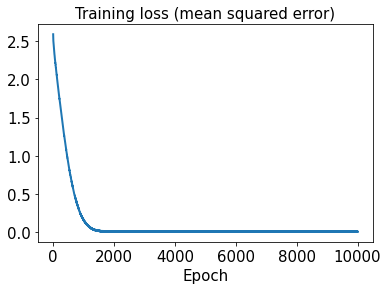

In [63]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

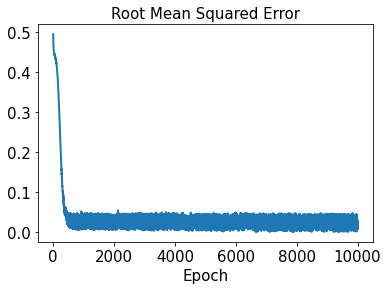

In [64]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [65]:
sd2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [66]:
start2 = datetime.datetime.now()
history2 = sd2.fit(x_train2, y_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 22ms/step - loss: 2.6742 - rmse: 1.6353
Epoch 2/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6647 - rmse: 1.6324
Epoch 3/10000
2/2 [==============================] - 0s 34ms/step - loss: 2.6561 - rmse: 1.6298
Epoch 4/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.6478 - rmse: 1.6272
Epoch 5/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6395 - rmse: 1.6247
Epoch 6/10000
2/2 [==============================] - 0s 46ms/step - loss: 2.6313 - rmse: 1.6221
Epoch 7/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6232 - rmse: 1.6196
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6151 - rmse: 1.6171
Epoch 9/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6071 - rmse: 1.6146
Epoch 10/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5990 - rmse: 1.6121
Epoch 11/10000
2/2 [=======================

2/2 [==============================] - 0s 8ms/step - loss: 2.0043 - rmse: 1.4157
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9993 - rmse: 1.4139
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9904 - rmse: 1.4108
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9847 - rmse: 1.4087
Epoch 90/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9797 - rmse: 1.4070
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9706 - rmse: 1.4038
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9650 - rmse: 1.4017
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9573 - rmse: 1.3990
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9508 - rmse: 1.3967
Epoch 95/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9447 - rmse: 1.3945
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 1.3971 - rmse: 1.1819
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3885 - rmse: 1.1783
Epoch 172/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3828 - rmse: 1.1759
Epoch 173/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3708 - rmse: 1.1708
Epoch 174/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3616 - rmse: 1.1668
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3594 - rmse: 1.1659
Epoch 176/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3493 - rmse: 1.1616
Epoch 177/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3413 - rmse: 1.1581
Epoch 178/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3344 - rmse: 1.1551
Epoch 179/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3242 - rmse: 1.1507
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.8127 - rmse: 0.9015
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8048 - rmse: 0.8970
Epoch 256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8035 - rmse: 0.8963
Epoch 257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7946 - rmse: 0.8913
Epoch 258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7864 - rmse: 0.8868
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7826 - rmse: 0.8846
Epoch 260/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.7816 - rmse: 0.8841
Epoch 261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7716 - rmse: 0.8784
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7638 - rmse: 0.8739
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7568 - rmse: 0.8699
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.3987 - rmse: 0.6314
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3941 - rmse: 0.6277
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3919 - rmse: 0.6260
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3870 - rmse: 0.6220
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3877 - rmse: 0.6226
Epoch 343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3808 - rmse: 0.6171
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3791 - rmse: 0.6156
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3789 - rmse: 0.6155
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3761 - rmse: 0.6132
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3674 - rmse: 0.6061
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.1761 - rmse: 0.4195
Epoch 423/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1765 - rmse: 0.4201
Epoch 424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1746 - rmse: 0.4178
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1725 - rmse: 0.4153
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1701 - rmse: 0.4123
Epoch 427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1648 - rmse: 0.4059
Epoch 428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1668 - rmse: 0.4084
Epoch 429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1602 - rmse: 0.4002
Epoch 430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1582 - rmse: 0.3977
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1574 - rmse: 0.3967
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0697 - rmse: 0.2639
Epoch 507/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0656 - rmse: 0.2561
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0686 - rmse: 0.2619
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0641 - rmse: 0.2531
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0636 - rmse: 0.2521
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0687 - rmse: 0.2621
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0679 - rmse: 0.2605
Epoch 513/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0620 - rmse: 0.2490
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0605 - rmse: 0.2459
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0660 - rmse: 0.2569
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0255 - rmse: 0.1597
Epoch 591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0238 - rmse: 0.1540
Epoch 592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0238 - rmse: 0.1542
Epoch 593/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0280 - rmse: 0.1673
Epoch 594/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0219 - rmse: 0.1479
Epoch 595/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0246 - rmse: 0.1568
Epoch 596/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0220 - rmse: 0.1481
Epoch 597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0244 - rmse: 0.1561
Epoch 598/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0218 - rmse: 0.1475
Epoch 599/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0238 - rmse: 0.1543
Epoch 600/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0988
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0867
Epoch 676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0965
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0929
Epoch 678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0091 - rmse: 0.0951
Epoch 680/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0987
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.1059
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0089 - rmse: 0.0942
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0091 - rmse: 0.0951
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 767/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2408e-04 - rmse: 0.0298
Epoch 846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 852/10000
2/2 [=====================

2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0795
Epoch 928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 931/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 932/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 933/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 934/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9131e-04 - rmse: 0.0160
Epoch 935/10000
2/2 [====================

2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 1009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 1010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 1011/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 1012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 1013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 1014/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 1015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 1017/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 1018/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 1091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 1092/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 1093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 1094/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 1095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0707
Epoch 1096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0709
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 1098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 1099/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 1100/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 1.4908e-04 - rmse: 0.0109
Epoch 1173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 1174/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0541e-04 - rmse: 0.0132
Epoch 1175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 1176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 1177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 1179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 1180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 1181/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 1182/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 9.0464e-04 - rmse: 0.0296
Epoch 1255/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0620e-04 - rmse: 0.0218
Epoch 1256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 1257/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 1258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 1259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0482
Epoch 1260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 1261/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.0001e-04 - rmse: 0.0278
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 1263/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0906
Epoch 1264/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 1338/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 1339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 1340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0757
Epoch 1341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 1342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 1343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5307e-04 - rmse: 0.0287
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2658e-04 - rmse: 0.0300
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 1347/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 1420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 1421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 1422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 1423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 1424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 1425/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 1427/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.4008e-04 - rmse: 0.0177
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 1429/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 1503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 1504/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 1505/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.0802e-04 - rmse: 0.0297
Epoch 1506/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0475e-04 - rmse: 0.0194
Epoch 1507/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 1508/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0049 - rmse: 0.0695
Epoch 1509/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 1510/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9809e-04 - rmse: 0.0239
Epoch 1511/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 1512/10000
2

2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 1585/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.0234e-04 - rmse: 0.0087
Epoch 1586/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4649e-04 - rmse: 0.0268
Epoch 1587/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 1588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 1589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 1590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 1591/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7486e-04 - rmse: 0.0212
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6057e-04 - rmse: 0.0208
Epoch 1593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 1594/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 7.4494e-04 - rmse: 0.0268
Epoch 1667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 1668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 1669/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4111e-04 - rmse: 0.0227
Epoch 1670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 1671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 1672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 1673/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4771e-04 - rmse: 0.0249
Epoch 1674/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 1675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 1676/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 6.8636e-04 - rmse: 0.0257
Epoch 1750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 1751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 1752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 1753/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0193e-04 - rmse: 0.0218
Epoch 1754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 1755/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4708e-04 - rmse: 0.0287
Epoch 1756/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9444e-04 - rmse: 0.0130
Epoch 1757/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8962e-04 - rmse: 0.0216
Epoch 1758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 1759/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 1832/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 1833/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 1834/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1074e-04 - rmse: 0.0197
Epoch 1835/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 1836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 1837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 1838/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3102e-04 - rmse: 0.0144
Epoch 1839/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0197e-04 - rmse: 0.0167
Epoch 1840/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 1841/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 1914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0750
Epoch 1915/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 1916/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 1917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 1918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 1919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 1920/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1432e-04 - rmse: 0.0170
Epoch 1921/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.2735e-04 - rmse: 0.0301
Epoch 1922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 1923/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 1996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 1997/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 1998/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 1999/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7879e-04 - rmse: 0.0236
Epoch 2000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 2001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 2002/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 2003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 2004/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8404e-04 - rmse: 0.0237
Epoch 2005/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 2078/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 2079/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 2080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 2081/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7473e-05 - rmse: 0.0086
Epoch 2082/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 2083/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0104e-04 - rmse: 0.0167
Epoch 2084/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 2085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 2086/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 2087/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 2161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 2162/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 2163/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0863
Epoch 2164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 2165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 2166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 2167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 2168/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9859e-04 - rmse: 0.0218
Epoch 2169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 2170/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 2243/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2106e-04 - rmse: 0.0141
Epoch 2244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 2245/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 2246/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6003e-04 - rmse: 0.0117
Epoch 2248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 2249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 2250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 2251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 2252/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 2325/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3652e-04 - rmse: 0.0204
Epoch 2326/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 2327/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7006e-04 - rmse: 0.0122
Epoch 2328/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7791e-04 - rmse: 0.0125
Epoch 2329/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4296e-04 - rmse: 0.0149
Epoch 2330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 2331/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 2332/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 2333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 2334/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 2407/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 2408/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 2409/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 2410/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 2411/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 2412/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 2413/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 2414/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 2415/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0765
Epoch 2416/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 2489/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2530e-04 - rmse: 0.0201
Epoch 2490/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 2491/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 2492/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2117e-04 - rmse: 0.0100
Epoch 2493/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2494/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2289e-04 - rmse: 0.0265
Epoch 2495/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4562e-04 - rmse: 0.0269
Epoch 2496/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 2497/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2106e-04 - rmse: 0.0224
Epoch 2498/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 2571/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2788e-04 - rmse: 0.0103
Epoch 2572/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3539e-04 - rmse: 0.0177
Epoch 2573/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 2574/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 2575/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 2576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 2577/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 2578/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7904e-05 - rmse: 0.0052
Epoch 2579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 2580/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 2654/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.1923e-04 - rmse: 0.0141
Epoch 2655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 2656/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 2657/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5763e-04 - rmse: 0.0209
Epoch 2658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 2659/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1206e-04 - rmse: 0.0222
Epoch 2660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 2661/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 2662/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1107e-04 - rmse: 0.0298
Epoch 2663/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 2736/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.5374e-05 - rmse: 0.0086
Epoch 2737/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 2738/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 2739/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 2740/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5032e-04 - rmse: 0.0305
Epoch 2741/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 2742/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 2743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 2744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 2745/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 2818/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 2819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 2820/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0734e-04 - rmse: 0.0298
Epoch 2821/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5917e-05 - rmse: 0.0039
Epoch 2822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 2823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 2824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 2825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 2826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 2827/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 3.1115e-04 - rmse: 0.0171
Epoch 2901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 2902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 2903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 2904/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 2905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 2906/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 2907/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 2908/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5855e-04 - rmse: 0.0184
Epoch 2909/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 2910/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0711
Epoch 2983/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 2984/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 2985/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 2986/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5416e-04 - rmse: 0.0208
Epoch 2987/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 2988/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 2989/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 2990/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 2991/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8183e-04 - rmse: 0.0190
Epoch 2992/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 3065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 3066/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 3067/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0801
Epoch 3068/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.5895e-04 - rmse: 0.0210
Epoch 3069/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 3070/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 3071/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8050e-04 - rmse: 0.0190
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 3073/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 3074/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 3148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 3149/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 3150/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 3151/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 3152/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 3153/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 3154/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 3155/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 3156/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 3157/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 3231/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 3232/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 3233/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 3234/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 3235/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 3236/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 3237/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5044e-04 - rmse: 0.0305
Epoch 3238/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 3239/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 3240/10000
2/2 [===========

2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 3313/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 3314/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.0432e-04 - rmse: 0.0169
Epoch 3315/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0723
Epoch 3316/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 3317/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 3318/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 3319/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.5744e-04 - rmse: 0.0184
Epoch 3320/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 3321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 3322/10000
2/2 [=

2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 3396/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7234e-04 - rmse: 0.0188
Epoch 3397/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 3398/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9711e-04 - rmse: 0.0240
Epoch 3399/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 3400/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 3401/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 3402/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4060e-04 - rmse: 0.0205
Epoch 3403/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 3404/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 3405/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 3479/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 3480/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 3481/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 3482/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 3483/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 3484/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3242e-04 - rmse: 0.0267
Epoch 3485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3486/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7377e-04 - rmse: 0.0213
Epoch 3487/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0026e-04 - rmse: 0.0168
Epoch 3488/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3561/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 3562/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 3563/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 3564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0722
Epoch 3565/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 3566/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 3567/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6210e-04 - rmse: 0.0254
Epoch 3568/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6194e-04 - rmse: 0.0290
Epoch 3569/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 3570/10000
2/2 [=======

Epoch 3643/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7006e-04 - rmse: 0.0212
Epoch 3644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 3645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 3646/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 3647/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0782e-04 - rmse: 0.0170
Epoch 3648/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 3649/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 3650/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8043e-04 - rmse: 0.0127
Epoch 3651/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.5134e-04 - rmse: 0.0152
Epoch 3652/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0796e-04 - rmse: 0.0137


2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 3726/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 3727/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 3728/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 3729/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 3730/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1844e-04 - rmse: 0.0141
Epoch 3731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 3732/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9379e-05 - rmse: 0.0071
Epoch 3733/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 3734/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6901e-04 - rmse: 0.0212
Epoch 3735/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 4.8785e-04 - rmse: 0.0217
Epoch 3808/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2421e-04 - rmse: 0.0225
Epoch 3809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 3810/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 3811/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 3813/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 3814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 3815/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8837e-04 - rmse: 0.0217
Epoch 3816/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0051 - rmse: 0.0710
Epoch 3817/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 3890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 3891/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.0391e-04 - rmse: 0.0169
Epoch 3892/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 3893/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 3894/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 3895/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 3896/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2807e-04 - rmse: 0.0176
Epoch 3897/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 3898/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 3899/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 3973/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9795e-04 - rmse: 0.0134
Epoch 3974/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 3975/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 3976/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 3977/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 3978/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 3979/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 3980/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3121e-04 - rmse: 0.0285
Epoch 3981/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.8741e-04 - rmse: 0.0130
Epoch 3982/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 2.4724e-04 - rmse: 0.0151
Epoch 4055/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 4056/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5205e-04 - rmse: 0.0208
Epoch 4057/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 4058/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 4059/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 4060/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 4061/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7021e-04 - rmse: 0.0255
Epoch 4063/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 4064/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 4137/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0720
Epoch 4138/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 4139/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5970e-04 - rmse: 0.0210
Epoch 4140/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4141/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 4142/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1969e-04 - rmse: 0.0265
Epoch 4143/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5274e-04 - rmse: 0.0209
Epoch 4144/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 4145/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 4146/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 6.6312e-04 - rmse: 0.0254
Epoch 4220/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 4221/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9934e-04 - rmse: 0.0168
Epoch 4222/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 4223/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6379e-04 - rmse: 0.0234
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 4226/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0656e-04 - rmse: 0.0137
Epoch 4227/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 4228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 4229/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 4302/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4798e-04 - rmse: 0.0288
Epoch 4303/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4304/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 4305/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 4306/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0687
Epoch 4307/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 4308/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 4309/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 4310/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 4311/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 4385/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 4386/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 4387/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 4388/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 4389/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9489e-04 - rmse: 0.0194
Epoch 4390/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3887e-04 - rmse: 0.0110
Epoch 4391/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9963e-05 - rmse: 0.0079
Epoch 4392/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 4393/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 4394/10000
2/2 [===

Epoch 4467/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 4468/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0922
Epoch 4469/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 4470/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 4471/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 4472/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 4473/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6873e-04 - rmse: 0.0255
Epoch 4474/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 4475/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 4476/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 4477/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5594e-04 - rmse: 0.0232
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 4553/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 4554/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 4555/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 4556/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 4557/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 4558/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 4559/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 4633/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 4634/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5063e-04 - rmse: 0.0208
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7805e-04 - rmse: 0.0276
Epoch 4636/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 4637/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 4638/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4639/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0884
Epoch 4640/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 4641/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 4642/10000
2/2 [=======

Epoch 4715/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 4716/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 4717/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 4718/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 4719/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 4720/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 4721/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 4722/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 4723/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 4724/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 4725/10000
2/2

2/2 [==============================] - 0s 9ms/step - loss: 2.1427e-04 - rmse: 0.0140
Epoch 4798/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 4799/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6129e-04 - rmse: 0.0120
Epoch 4800/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 4801/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1888e-04 - rmse: 0.0142
Epoch 4802/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4293e-04 - rmse: 0.0304
Epoch 4803/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7242e-04 - rmse: 0.0125
Epoch 4804/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 4805/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 4806/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3440e-04 - rmse: 0.0248
Epoch 4807/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 4880/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 4881/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 4882/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9325e-04 - rmse: 0.0260
Epoch 4883/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 4884/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5941e-04 - rmse: 0.0156
Epoch 4885/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 4886/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 4887/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5571e-04 - rmse: 0.0154
Epoch 4888/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6489e-04 - rmse: 0.0122
Epoch 4889/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 4.5850e-04 - rmse: 0.0210
Epoch 4962/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1534e-04 - rmse: 0.0173
Epoch 4963/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4537e-04 - rmse: 0.0113
Epoch 4964/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.8269e-04 - rmse: 0.0277
Epoch 4965/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5330e-05 - rmse: 0.0088
Epoch 4966/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 4967/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 4968/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 4969/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 4970/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 4971/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 5044/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 5045/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 5046/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 5047/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8142e-04 - rmse: 0.0294
Epoch 5048/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 5049/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1416e-04 - rmse: 0.0172
Epoch 5050/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 5051/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 5052/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 5053/10000
2/2 [=======

Epoch 5126/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8289e-04 - rmse: 0.0129
Epoch 5127/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5128/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 5129/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5130/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 5131/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 5132/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4016e-04 - rmse: 0.0180
Epoch 5133/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 5134/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 5135/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2585e-04 - rmse: 0.0145
Epoch 51

2/2 [==============================] - 0s 9ms/step - loss: 2.9768e-04 - rmse: 0.0168
Epoch 5209/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5210/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3566e-04 - rmse: 0.0286
Epoch 5211/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 5212/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 5213/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 5214/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7480e-04 - rmse: 0.0257
Epoch 5215/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 5216/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6549e-04 - rmse: 0.0122
Epoch 5217/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 5218/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 5291/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 5292/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 5293/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 5294/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 5295/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2289e-04 - rmse: 0.0284
Epoch 5296/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5297/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 5298/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.5643e-05 - rmse: 0.0089
Epoch 5299/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5616e-04 - rmse: 0.0210
Epoch 5300/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0861
Epoch 5373/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 5374/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 5375/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 5376/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 5377/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0756
Epoch 5378/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 5379/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 5380/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 5381/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 5382/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 5.3739e-05 - rmse: 0.0061
Epoch 5456/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5457/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 5458/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0721
Epoch 5459/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4120e-04 - rmse: 0.0150
Epoch 5460/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 5461/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5462/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5451e-04 - rmse: 0.0154
Epoch 5463/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 5464/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 5465/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 5538/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 5539/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 5540/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5541/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6857e-04 - rmse: 0.0159
Epoch 5542/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6777e-04 - rmse: 0.0187
Epoch 5543/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7648e-04 - rmse: 0.0237
Epoch 5544/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 5545/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4763e-04 - rmse: 0.0152
Epoch 5546/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5547/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 5621/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 5622/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5962e-04 - rmse: 0.0211
Epoch 5623/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3893e-04 - rmse: 0.0304
Epoch 5624/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 5625/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0549e-04 - rmse: 0.0170
Epoch 5626/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.8748e-05 - rmse: 0.0057
Epoch 5627/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0330e-05 - rmse: 0.0066
Epoch 5628/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8412e-05 - rmse: 0.0057
Epoch 5629/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 5630/10

2/2 [==============================] - 0s 8ms/step - loss: 9.9391e-04 - rmse: 0.0313
Epoch 5703/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 5704/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 5705/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 5706/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 5707/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 5708/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3346e-04 - rmse: 0.0268
Epoch 5709/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3315e-04 - rmse: 0.0286
Epoch 5710/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 5711/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 5712/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 5786/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5787/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 5788/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2571e-04 - rmse: 0.0226
Epoch 5789/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3775e-04 - rmse: 0.0149
Epoch 5790/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 5791/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5792/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 5793/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 5794/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4520e-04 - rmse: 0.0114
Epoch 5795/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 5869/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 5870/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 5871/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 5872/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 5873/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 5874/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3688e-04 - rmse: 0.0149
Epoch 5875/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1302e-04 - rmse: 0.0199
Epoch 5876/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 5877/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 5878/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.9443e-04 - rmse: 0.0219
Epoch 5951/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0851
Epoch 5952/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6848e-04 - rmse: 0.0256
Epoch 5953/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 5954/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 5955/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5550e-04 - rmse: 0.0307
Epoch 5956/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 5957/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5958/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0862
Epoch 5959/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4597e-04 - rmse: 0.0288
Epoch 5960/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6033/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6034/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 6035/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7995e-04 - rmse: 0.0163
Epoch 6036/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 6037/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 6038/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 6039/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 6040/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4499e-04 - rmse: 0.0207
Epoch 6041/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 6042/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.6860e-04 - rmse: 0.0159
Epoch 6115/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 6116/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6808e-04 - rmse: 0.0255
Epoch 6117/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0427e-04 - rmse: 0.0170
Epoch 6118/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 6119/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7015e-04 - rmse: 0.0160
Epoch 6120/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 6121/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 6122/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3113e-04 - rmse: 0.0204
Epoch 6123/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 6124/10000


2/2 [==============================] - 0s 7ms/step - loss: 5.4665e-04 - rmse: 0.0230
Epoch 6197/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0800
Epoch 6198/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 6199/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 6200/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 6201/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 6202/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1008e-04 - rmse: 0.0172
Epoch 6203/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7489e-04 - rmse: 0.0161
Epoch 6204/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 6205/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 6206/10000
2/2 [===

2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 6280/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0165e-04 - rmse: 0.0242
Epoch 6281/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 6282/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 6283/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 6284/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 6285/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2808e-04 - rmse: 0.0106
Epoch 6286/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 6287/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 6288/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2779e-04 - rmse: 0.0106
Epoch 6289/10000
2/2 [=

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 6362/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 6363/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 6364/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 6365/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2949e-05 - rmse: 0.0042
Epoch 6366/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 6367/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 6368/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 6369/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 6370/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 6371/10000
2/2 [===========

Epoch 6444/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6445/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 6446/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1105e-04 - rmse: 0.0199
Epoch 6447/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 6448/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 6449/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6798e-04 - rmse: 0.0188
Epoch 6450/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 6451/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6452/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1801e-04 - rmse: 0.0142
Epoch 6453/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1783e-04 - rmse: 0.0201
Epoc

2/2 [==============================] - 0s 7ms/step - loss: 1.3542e-04 - rmse: 0.0110
Epoch 6527/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 6528/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6607e-04 - rmse: 0.0123
Epoch 6529/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 6530/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 6531/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 6532/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 6533/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 6534/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 6535/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 6536/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 6609/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 6610/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.8240e-04 - rmse: 0.0216
Epoch 6611/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 6612/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 6613/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6614/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 6615/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 6616/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 6617/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 6618/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 6691/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 6692/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0944e-04 - rmse: 0.0172
Epoch 6693/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0852
Epoch 6694/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 6695/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6696/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 6697/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 6698/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 6699/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 6700/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 5.2317e-04 - rmse: 0.0225
Epoch 6773/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8078e-04 - rmse: 0.0191
Epoch 6774/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 6775/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5005e-05 - rmse: 0.0071
Epoch 6776/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 6777/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6778/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 6779/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5804e-04 - rmse: 0.0156
Epoch 6780/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 6781/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6091e-04 - rmse: 0.0211
Epoch 6782/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 6855/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 6856/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 6857/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 6858/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 6859/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6860/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0920
Epoch 6861/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 6862/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 6863/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0918
Epoch 6864/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 3.2961e-04 - rmse: 0.0177
Epoch 6938/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3614e-04 - rmse: 0.0287
Epoch 6939/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3174e-04 - rmse: 0.0286
Epoch 6940/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 6941/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1575e-04 - rmse: 0.0142
Epoch 6942/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 6943/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 6944/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 6945/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8303e-04 - rmse: 0.0130
Epoch 6946/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 6947/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 7020/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 7021/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 7022/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 7023/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 7024/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 7025/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 7026/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3569e-04 - rmse: 0.0205
Epoch 7027/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 7028/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 7029/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 7102/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2842e-04 - rmse: 0.0285
Epoch 7103/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 7104/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 7105/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8045e-04 - rmse: 0.0258
Epoch 7106/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 7107/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 7108/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 7109/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9073e-04 - rmse: 0.0296
Epoch 7110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 7111/10000
2/2 [===

2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 7184/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 7185/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 7186/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 7187/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 7188/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6368e-04 - rmse: 0.0291
Epoch 7189/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 7190/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 7191/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7192/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0120e-04 - rmse: 0.0196
Epoch 7193/10000
2/2 [==

Epoch 7266/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 7267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 7268/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 7269/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 7270/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 7271/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 7272/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 7273/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5042e-04 - rmse: 0.0289
Epoch 7274/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5559e-04 - rmse: 0.0119
Epoch 7275/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3353e-04 - rmse: 0.0286
Epoch 72

2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 7349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 7350/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8278e-04 - rmse: 0.0164
Epoch 7351/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 7352/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0998e-05 - rmse: 0.0075
Epoch 7353/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 7354/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7160e-04 - rmse: 0.0125
Epoch 7355/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 7356/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 7357/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 7358/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 7.0542e-04 - rmse: 0.0263
Epoch 7431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 7432/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 7433/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7434/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 7435/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7436/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 7437/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 7438/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 7439/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 7440/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 7515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 7516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 7517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 7518/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 7519/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0701
Epoch 7520/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 7521/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 7522/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 7523/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0907
Epoch 7596/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1832e-04 - rmse: 0.0224
Epoch 7597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 7598/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5781e-04 - rmse: 0.0185
Epoch 7599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 7600/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 7601/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 7602/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 7603/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0045e-04 - rmse: 0.0136
Epoch 7604/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 7605/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 7.0334e-04 - rmse: 0.0262
Epoch 7678/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7483e-04 - rmse: 0.0126
Epoch 7679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 7680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 7681/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0955e-05 - rmse: 0.0068
Epoch 7682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 7683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 7684/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 7685/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 7686/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1452e-04 - rmse: 0.0300
Epoch 7687/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 7760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 7761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 7762/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6441e-04 - rmse: 0.0122
Epoch 7763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 7764/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 7765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 7766/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 7767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 7768/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 7769/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 7843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 7844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 7845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 7846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 7847/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7048e-04 - rmse: 0.0256
Epoch 7848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0765
Epoch 7849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 7850/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 7851/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9568e-04 - rmse: 0.0241
Epoch 7852/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 7926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 7927/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9782e-04 - rmse: 0.0314
Epoch 7928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0776
Epoch 7929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 7930/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 7931/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3516e-04 - rmse: 0.0179
Epoch 7932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 7933/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4661e-04 - rmse: 0.0271
Epoch 7934/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 7935/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 8008/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9495e-04 - rmse: 0.0313
Epoch 8009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 8011/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1050e-04 - rmse: 0.0098
Epoch 8012/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5902e-05 - rmse: 0.0071
Epoch 8013/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9651e-04 - rmse: 0.0261
Epoch 8014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 8015/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6702e-04 - rmse: 0.0255
Epoch 8016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 8017/10000


2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 8090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8091/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4332e-04 - rmse: 0.0113
Epoch 8092/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 8093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 8094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 8095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 8096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 8097/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3653e-04 - rmse: 0.0249
Epoch 8098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 8099/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 8172/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2341e-04 - rmse: 0.0176
Epoch 8173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 8174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 8175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8176/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 8177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7253e-04 - rmse: 0.0126
Epoch 8178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 8179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8180/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.9909e-04 - rmse: 0.0169
Epoch 8181/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 8254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 8255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 8256/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5932e-04 - rmse: 0.0291
Epoch 8257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 8258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 8259/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3487e-04 - rmse: 0.0148
Epoch 8260/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 8261/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4204e-04 - rmse: 0.0181
Epoch 8262/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 8263/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 8337/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 8338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 8339/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 8340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 8341/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5011e-04 - rmse: 0.0306
Epoch 8342/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8572e-04 - rmse: 0.0217
Epoch 8343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 8344/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1853e-04 - rmse: 0.0224
Epoch 8345/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0051 - rmse: 0.0711
Epoch 8346/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 8419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 8420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 8421/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 8422/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4835e-04 - rmse: 0.0289
Epoch 8423/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 8424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 8425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 8426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 8427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 8428/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0850
Epoch 8502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 8503/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8220e-04 - rmse: 0.0238
Epoch 8504/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8505/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 8506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 8507/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 8508/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.7728e-04 - rmse: 0.0294
Epoch 8509/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 8510/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2452e-04 - rmse: 0.0145
Epoch 8511/10000
2

Epoch 8584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0718
Epoch 8585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 8586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 8587/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 8589/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0760
Epoch 8591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 8592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 8593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 8594/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 8667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 8668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 8669/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6419e-04 - rmse: 0.0122
Epoch 8670/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6535e-04 - rmse: 0.0123
Epoch 8671/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 8672/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9532e-04 - rmse: 0.0168
Epoch 8673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 8674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 8675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 8676/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 8750/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 8751/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 8752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 8753/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 8754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 8755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 8756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 8757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 8758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 8759/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 8833/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 8834/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4206e-04 - rmse: 0.0250
Epoch 8835/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 8837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 8838/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8839/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5400e-04 - rmse: 0.0118
Epoch 8840/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2107e-04 - rmse: 0.0103
Epoch 8841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 8842/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 6.0380e-04 - rmse: 0.0243
Epoch 8915/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.5890e-04 - rmse: 0.0233
Epoch 8916/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0715
Epoch 8917/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 8918/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 8919/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 8920/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 8921/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 8922/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 8923/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8924/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 8997/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 8998/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8313e-04 - rmse: 0.0259
Epoch 8999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 9000/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 9001/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3846e-04 - rmse: 0.0150
Epoch 9002/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5064e-05 - rmse: 0.0090
Epoch 9003/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 9004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 9005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 9006/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0687
Epoch 9079/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 9080/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2261e-04 - rmse: 0.0176
Epoch 9081/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7352e-04 - rmse: 0.0293
Epoch 9082/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 9083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 9084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 9085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 9086/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 9087/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 9088/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 9161/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6215e-05 - rmse: 0.0079
Epoch 9162/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3917e-05 - rmse: 0.0031
Epoch 9163/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2092e-05 - rmse: 0.0076
Epoch 9164/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 9165/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 9166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 9167/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8241e-04 - rmse: 0.0130
Epoch 9168/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4180e-04 - rmse: 0.0151
Epoch 9169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 9170/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 9243/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0973e-04 - rmse: 0.0172
Epoch 9244/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 9245/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 9246/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 9247/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 9248/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 9249/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2642e-04 - rmse: 0.0106
Epoch 9250/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5197e-05 - rmse: 0.0056
Epoch 9251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 9252/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 4.6824e-04 - rmse: 0.0213
Epoch 9325/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 9326/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 9327/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 9328/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 9329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 9330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 9331/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 9332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 9333/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5112e-04 - rmse: 0.0117
Epoch 9334/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 9407/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7629e-04 - rmse: 0.0257
Epoch 9408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 9409/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 9410/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 9411/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 9412/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9413/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 9414/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9415/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3580e-04 - rmse: 0.0110
Epoch 9416/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 9489/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6457e-04 - rmse: 0.0187
Epoch 9490/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3596e-04 - rmse: 0.0205
Epoch 9491/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 9492/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1672e-04 - rmse: 0.0174
Epoch 9493/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3735e-04 - rmse: 0.0206
Epoch 9494/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3885e-04 - rmse: 0.0180
Epoch 9495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 9496/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9497/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 9498/10000


2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9571/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 9572/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8287e-04 - rmse: 0.0217
Epoch 9573/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 9574/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6779e-04 - rmse: 0.0256
Epoch 9575/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 9576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 9577/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 9578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 9579/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1340e-04 - rmse: 0.0141
Epoch 9580/10000
2/2 [==

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 9653/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4437e-04 - rmse: 0.0114
Epoch 9654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 9655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 9656/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2958e-04 - rmse: 0.0108
Epoch 9657/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 9658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 9659/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 9660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 9661/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4537e-04 - rmse: 0.0182
Epoch 9662/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 9735/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 9736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 9737/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5255e-04 - rmse: 0.0154
Epoch 9738/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 9739/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 9740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 9741/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0884
Epoch 9742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9743/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8807e-04 - rmse: 0.0166
Epoch 9744/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0715
Epoch 9817/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 9818/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7262e-04 - rmse: 0.0214
Epoch 9819/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3731e-04 - rmse: 0.0250
Epoch 9820/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 9821/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2445e-04 - rmse: 0.0247
Epoch 9822/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 9823/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 9824/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 9825/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 9826/10000

2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 9899/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4012e-04 - rmse: 0.0206
Epoch 9900/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 9901/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 9902/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 9903/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5149e-04 - rmse: 0.0289
Epoch 9904/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 9905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 9906/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6503e-04 - rmse: 0.0274
Epoch 9907/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3985e-04 - rmse: 0.0229
Epoch 9908/1

2/2 [==============================] - 0s 11ms/step - loss: 6.8214e-04 - rmse: 0.0259
Epoch 9980/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9103e-04 - rmse: 0.0240
Epoch 9981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 9982/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 9983/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 9984/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9856e-04 - rmse: 0.0297
Epoch 9985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 9986/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 9987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 9988/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.4073e-04 - rmse: 0.0270
Epoch 9989/1

In [67]:
time2 = end2 - start2
print("Training time (Case 2):", time2)

Training time (Case 2): 0:02:55.557053


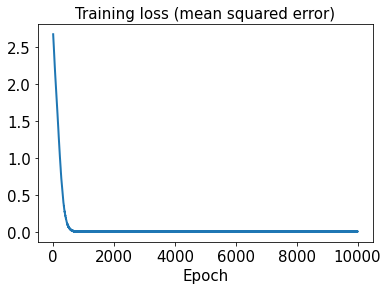

In [68]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

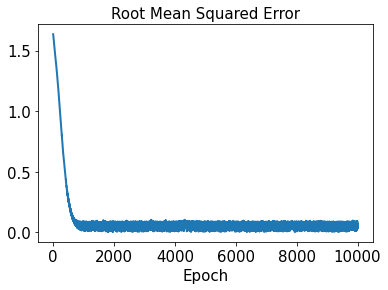

In [69]:
plt.plot(hist2['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [70]:
test_results2 = sd2.evaluate(x_test2)

1/1 [==============================] - 0s 69ms/step - loss: 1.3820e-05 - rmse: 0.0000e+00


In [71]:
decoded_sensor_train2 = sensor_pred2.predict(t_train)

In [72]:
decoded_sensor_test2 = sensor_pred2.predict(t_test)

In [73]:
decoded_train2 = sd2.predict(decoded_sensor_train2)

In [74]:
decoded_test2 = sd2.predict(decoded_sensor_test2)

In [75]:
error_train_abs2 = np.abs(decoded_train2 - y_train2)

In [76]:
error_test_abs2 = np.abs(decoded_test2 - y_test2)

In [77]:
l2_error_train2 = np.sqrt(np.sum((decoded_train2 - y_train2)**2) / np.sum(y_train2**2))
print(l2_error_train2)

0.13381607758122896


In [78]:
l2_error_test2 = np.sqrt(np.sum((decoded_test2 - y_test2)**2) / np.sum(y_test2**2))
print(l2_error_test2)

0.1270783759101735


In [79]:
l2_error_train_list2 = []
for i in range(0, len(x_train2)):
    l2_error_train_data2 = np.sqrt(np.sum((decoded_train2[i] - y_train2[i])**2) / np.sum(y_train2[i]**2))
    l2_error_train_list2.append(l2_error_train_data2)
print(l2_error_train_list2)

[0.13908674327440917, 0.1520212517824765, 0.11405751779345677, 0.0826199182463334, 0.07493391676984835, 0.07501341762440701, 0.07882643407406167, 0.15087185129467925, 0.07462238197304405, 0.1463395709773678, 0.14781217870232352, 0.2623521501023888, 0.121634938715421, 0.1748081564640772, 0.06736694481109944, 0.24334910384422265, 0.14663950650377552, 0.017374571051785095, 0.2251308488162604, 0.15246089148226533, 0.14470297899064494, 0.20765810169368737, 0.14490314848441369, 0.1141580260715316, 0.1493225151872551, 0.06203622426065019, 0.1265451205402567, 0.08741984853252134, 0.05135724917282573, 0.12212234960819536, 0.08430452333383338, 0.13051219969095826, 0.14620115032764505]


In [80]:
l2_error_test_list2 = []
for i in range(0, len(x_test2)):
    l2_error_test_data2 = np.sqrt(np.sum((decoded_test2[i] - y_test2[i])**2) / np.sum(y_test2[i]**2))
    l2_error_test_list2.append(l2_error_test_data2)
print(l2_error_test_list2)

[0.1028139058908843, 0.09093233232501799, 0.09455950715755576, 0.10652729376642155, 0.19089539769776656, 0.14907997365329256, 0.08517985664520551, 0.1476626658167452]


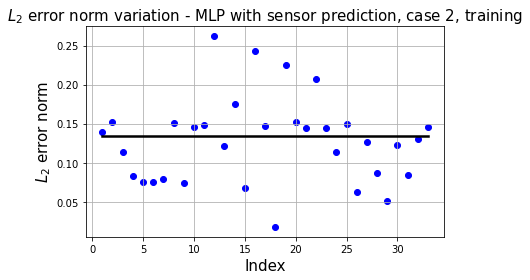

In [81]:
plt.plot(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train2*np.ones(x_train2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

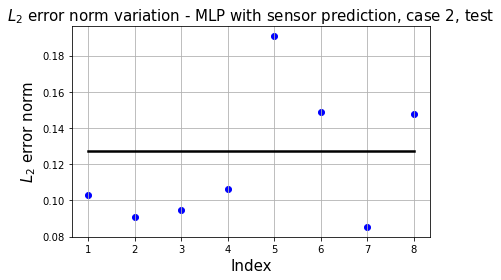

In [82]:
plt.plot(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test2*np.ones(x_test2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

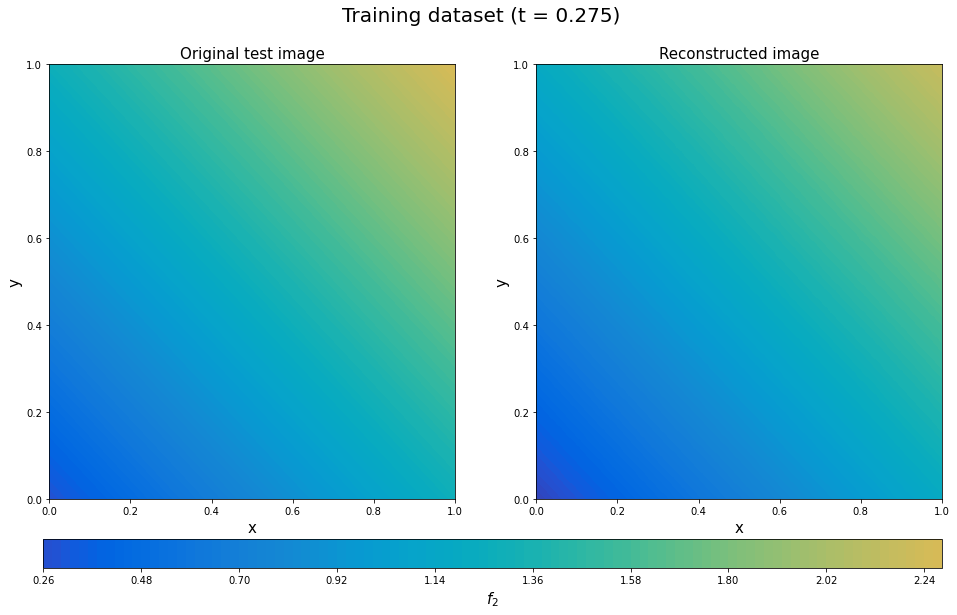

In [83]:
plt.figure(figsize=(16, 8))
y_train2_14_rotate = y_train2[14].T.reshape(101,101)
decoded_rotate2 = decoded_train2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_14_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[11]),fontsize=20)
plt.show()

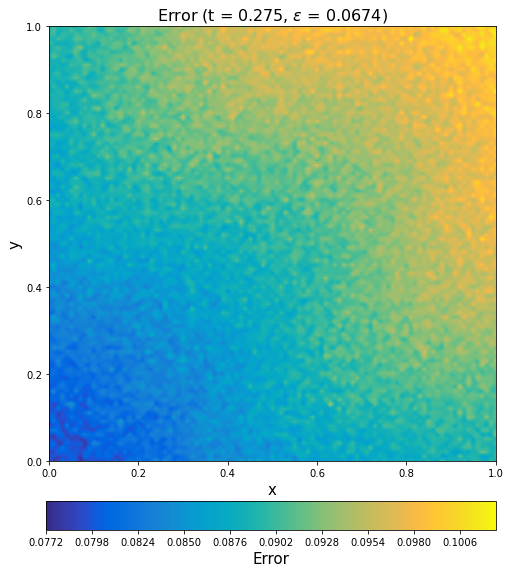

In [84]:
error_train_abs2_rotate14 = error_train_abs2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate14, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.275, $\epsilon$ = %.4f)' %(l2_error_train_list2[14]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

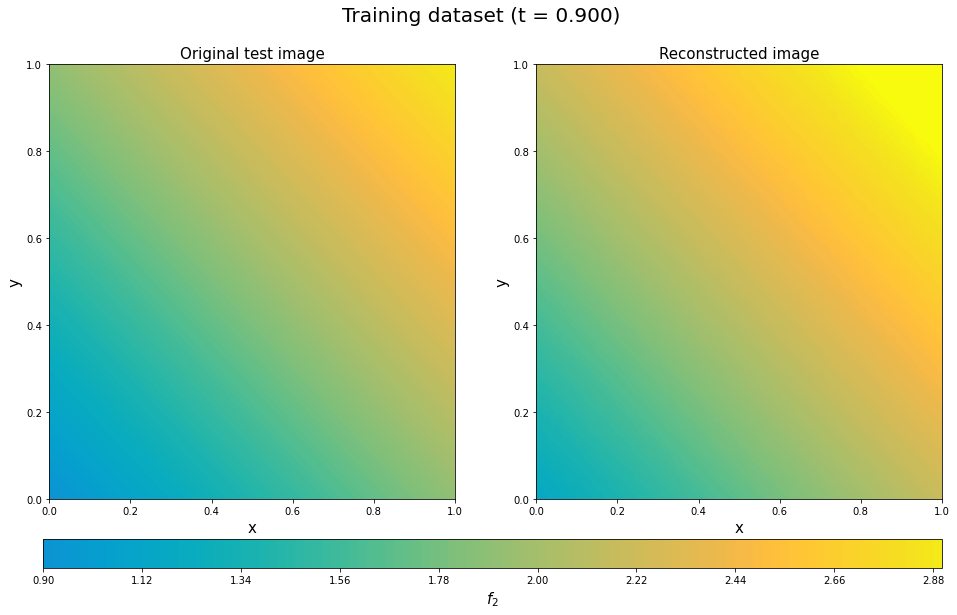

In [85]:
plt.figure(figsize=(16, 8))
y_train2_22_rotate = y_train2[22].T.reshape(101,101)
decoded_rotate2 = decoded_train2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_22_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[36]), fontsize=20)
plt.show()

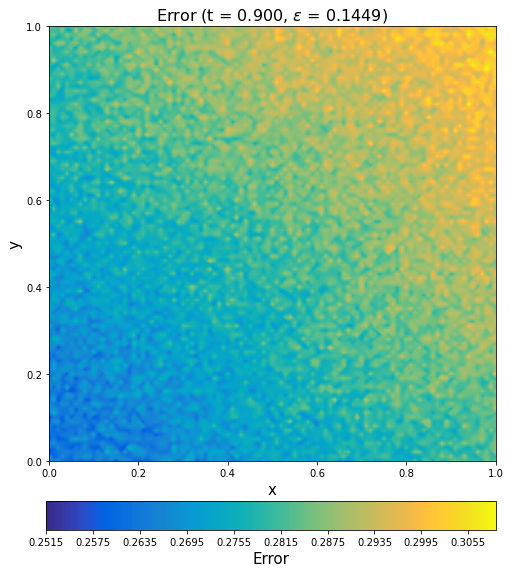

In [86]:
error_train_abs2_rotate22 = error_train_abs2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate22, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.900, $\epsilon$ = %.4f)' %(l2_error_train_list2[22]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

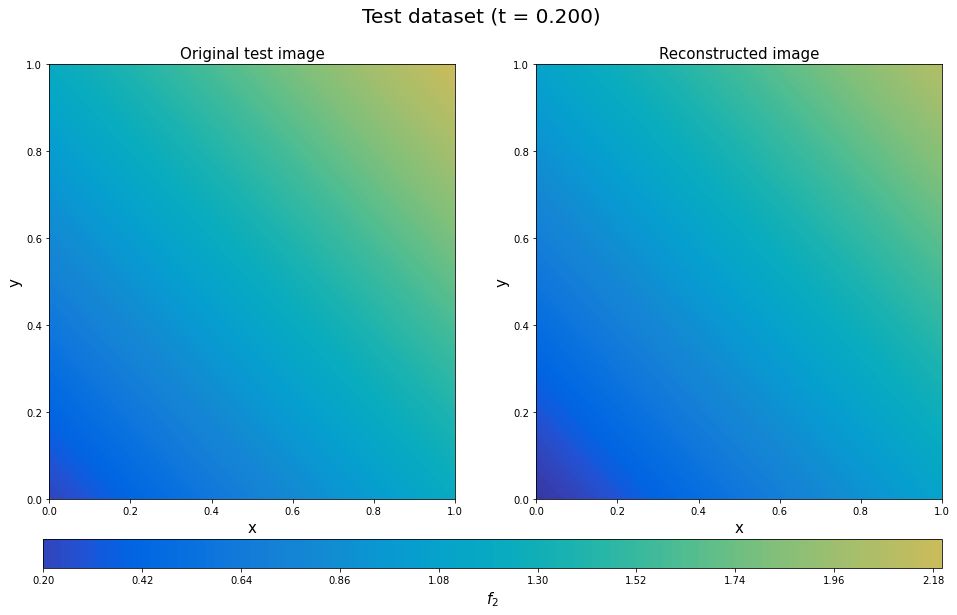

In [87]:
plt.figure(figsize=(16, 8))
y_test2_2_rotate = y_test2[2].T.reshape(101,101)
decoded_rotate2 = decoded_test2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

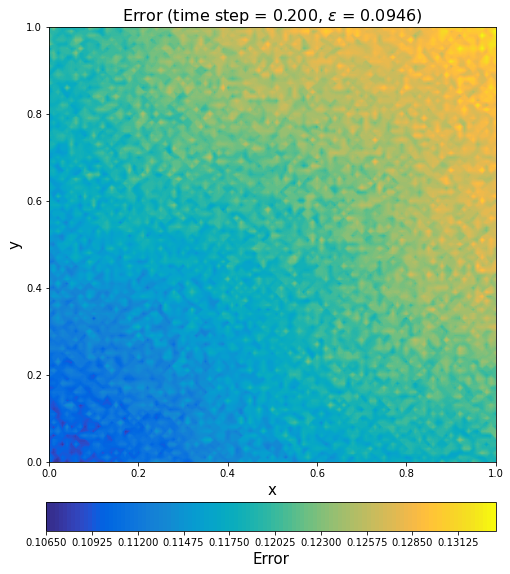

In [88]:
error_test_abs2_rotate2 = error_test_abs2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (time step = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list2[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

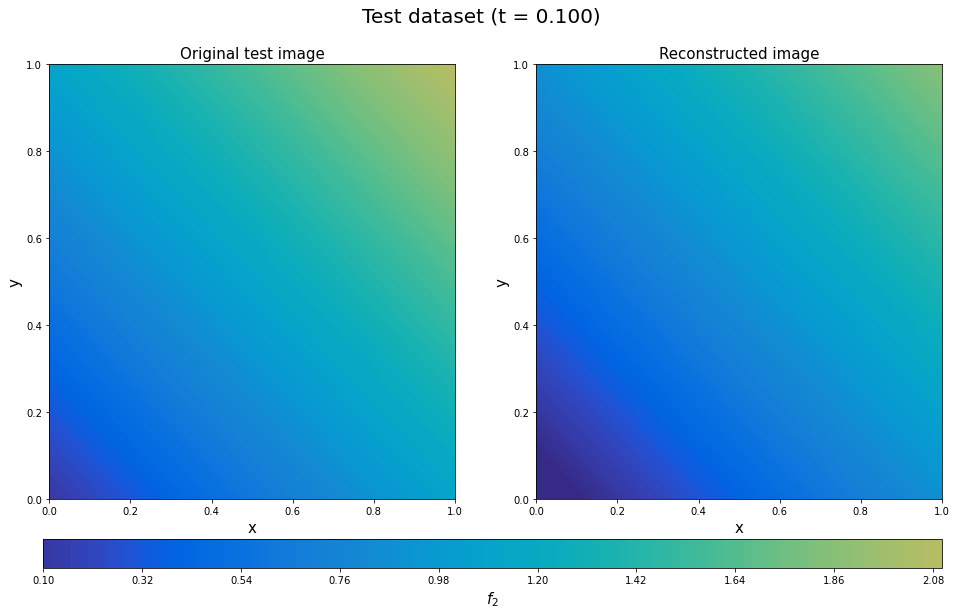

In [89]:
plt.figure(figsize=(16, 8))
y_test2_4_rotate = y_test2[4].T.reshape(101,101)
decoded_rotate2 = decoded_test2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_4_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[4]),fontsize=20)
plt.show()

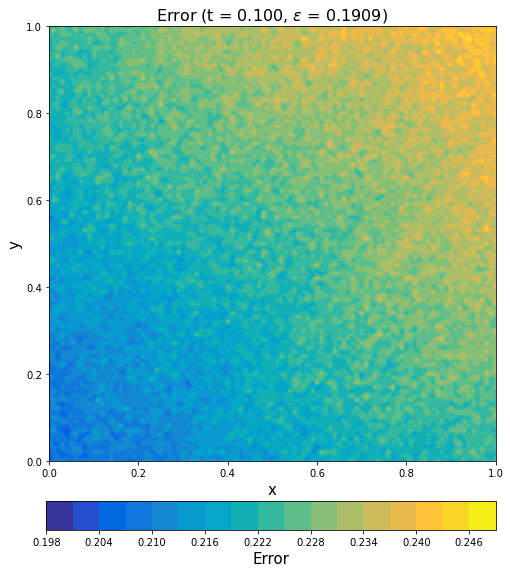

In [90]:
error_test_abs2_rotate4 = error_test_abs2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate4, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.100, $\epsilon$ = %.4f)' %(l2_error_test_list2[4]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 3: f3

In [91]:
out3 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out3[i, j, k] = np.exp(-t[i])*(2*np.sin(2*np.pi*x[j]) + np.sin(2*np.pi*x[j])*np.cos(2*np.pi*y[k]))

In [92]:
sensor3 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor3[i, j, k] = out3[i, 20*(j+1)+1, 20*(k+1)+1]

In [93]:
sensor3 = sensor3.reshape((41, 16, 1))

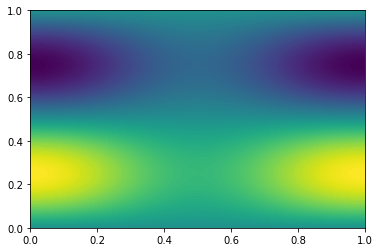

In [94]:
plt.contourf(xmesh, ymesh, out3[0,:,:], levels=128)

In [95]:
x_train3, x_test3, y_train3, y_test3, t_train, t_test = train_test_split(sensor3, out3, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [96]:
x_test3

array([[[ 1.19533543],
        [ 0.61432027],
        [ 0.65355792],
        [ 1.25882328],
        [ 0.66126769],
        [ 0.33984615],
        [ 0.36155269],
        [ 0.6963896 ],
        [-0.78664952],
        [-0.4042838 ],
        [-0.43010607],
        [-0.82843084],
        [-1.14744383],
        [-0.58970728],
        [-0.62737286],
        [-1.20838802]],

       [[ 1.57369576],
        [ 0.80877148],
        [ 0.86042905],
        [ 1.65727946],
        [ 0.8705792 ],
        [ 0.44741788],
        [ 0.4759952 ],
        [ 0.91681827],
        [-1.03564822],
        [-0.53225202],
        [-0.56624783],
        [-1.09065461],
        [-1.510645  ],
        [-0.77636772],
        [-0.82595561],
        [-1.59087989]],

       [[ 1.78323092],
        [ 0.91645815],
        [ 0.97499384],
        [ 1.87794366],
        [ 0.98649548],
        [ 0.50699088],
        [ 0.53937323],
        [ 1.03889121],
        [-1.17354318],
        [-0.60312055],
        [-0.64164286],
       

In [97]:
sensor_pred3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [98]:
start3 = datetime.datetime.now()
history3 = sensor_pred3.fit(t_train, x_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 12ms/step - loss: 3.8343 - rmse: 1.9577
Epoch 2/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7917 - rmse: 1.9468
Epoch 3/10000
2/2 [==============================] - 0s 21ms/step - loss: 3.7637 - rmse: 1.9396
Epoch 4/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7422 - rmse: 1.9341
Epoch 5/10000
2/2 [==============================] - 0s 25ms/step - loss: 3.7243 - rmse: 1.9294
Epoch 6/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7100 - rmse: 1.9258
Epoch 7/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6968 - rmse: 1.9223
Epoch 8/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6820 - rmse: 1.9185
Epoch 9/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.6706 - rmse: 1.9155
Epoch 10/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.6576 - rmse: 1.9121
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 3.0456 - rmse: 1.7447
Epoch 86/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0369 - rmse: 1.7422
Epoch 87/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0295 - rmse: 1.7401
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0243 - rmse: 1.7386
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0167 - rmse: 1.7364
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0091 - rmse: 1.7342
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0037 - rmse: 1.7327
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0026 - rmse: 1.7324
Epoch 93/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9913 - rmse: 1.7291
Epoch 94/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9845 - rmse: 1.7271
Epoch 95/10000
2/2 [==============================] -

2/2 [==============================] - 0s 11ms/step - loss: 2.5370 - rmse: 1.5923
Epoch 170/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5309 - rmse: 1.5904
Epoch 171/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5249 - rmse: 1.5885
Epoch 172/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5182 - rmse: 1.5864
Epoch 173/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5149 - rmse: 1.5854
Epoch 174/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5102 - rmse: 1.5839
Epoch 175/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5039 - rmse: 1.5819
Epoch 176/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4985 - rmse: 1.5802
Epoch 177/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4960 - rmse: 1.5794
Epoch 178/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4907 - rmse: 1.5777
Epoch 179/10000
2/2 [==================

2/2 [==============================] - 0s 10ms/step - loss: 2.1309 - rmse: 1.4593
Epoch 254/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1342 - rmse: 1.4604
Epoch 255/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1255 - rmse: 1.4574
Epoch 256/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1190 - rmse: 1.4552
Epoch 257/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1164 - rmse: 1.4543
Epoch 258/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1126 - rmse: 1.4530
Epoch 259/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1056 - rmse: 1.4505
Epoch 260/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1021 - rmse: 1.4493
Epoch 261/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0972 - rmse: 1.4477
Epoch 262/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0937 - rmse: 1.4464
Epoch 263/10000
2/2 [==================

2/2 [==============================] - 0s 11ms/step - loss: 1.8067 - rmse: 1.3436
Epoch 337/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8024 - rmse: 1.3420
Epoch 338/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8003 - rmse: 1.3412
Epoch 339/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7951 - rmse: 1.3393
Epoch 340/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7915 - rmse: 1.3379
Epoch 341/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7917 - rmse: 1.3380
Epoch 342/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7853 - rmse: 1.3356
Epoch 343/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7817 - rmse: 1.3342
Epoch 344/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7808 - rmse: 1.3339
Epoch 345/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7763 - rmse: 1.3322
Epoch 346/10000
2/2 [================

2/2 [==============================] - 0s 10ms/step - loss: 1.5352 - rmse: 1.2384
Epoch 420/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5283 - rmse: 1.2357
Epoch 421/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5292 - rmse: 1.2360
Epoch 422/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5227 - rmse: 1.2334
Epoch 423/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5222 - rmse: 1.2332
Epoch 424/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5184 - rmse: 1.2316
Epoch 425/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5133 - rmse: 1.2295
Epoch 426/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5140 - rmse: 1.2298
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5107 - rmse: 1.2285
Epoch 428/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5043 - rmse: 1.2259
Epoch 429/10000
2/2 [==================

2/2 [==============================] - 0s 10ms/step - loss: 1.2996 - rmse: 1.1394
Epoch 503/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2959 - rmse: 1.1377
Epoch 504/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2934 - rmse: 1.1366
Epoch 505/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2924 - rmse: 1.1362
Epoch 506/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2880 - rmse: 1.1343
Epoch 507/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2861 - rmse: 1.1334
Epoch 508/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2850 - rmse: 1.1329
Epoch 509/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2807 - rmse: 1.1310
Epoch 510/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2811 - rmse: 1.1312
Epoch 511/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2782 - rmse: 1.1299
Epoch 512/10000
2/2 [==================

2/2 [==============================] - 0s 11ms/step - loss: 1.0982 - rmse: 1.0473
Epoch 586/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0957 - rmse: 1.0461
Epoch 587/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0947 - rmse: 1.0456
Epoch 588/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0941 - rmse: 1.0453
Epoch 589/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0904 - rmse: 1.0435
Epoch 590/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0897 - rmse: 1.0432
Epoch 591/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0932 - rmse: 1.0449
Epoch 592/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0899 - rmse: 1.0433
Epoch 593/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0832 - rmse: 1.0401
Epoch 594/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0781 - rmse: 1.0376
Epoch 595/10000
2/2 [================

2/2 [==============================] - 0s 10ms/step - loss: 0.9230 - rmse: 0.9600
Epoch 669/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9221 - rmse: 0.9595
Epoch 670/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9216 - rmse: 0.9592
Epoch 671/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9196 - rmse: 0.9582
Epoch 672/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9174 - rmse: 0.9570
Epoch 673/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9141 - rmse: 0.9553
Epoch 674/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9169 - rmse: 0.9568
Epoch 675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9167 - rmse: 0.9567
Epoch 676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9078 - rmse: 0.9520
Epoch 677/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9109 - rmse: 0.9536
Epoch 678/10000
2/2 [=================

2/2 [==============================] - 0s 10ms/step - loss: 0.7739 - rmse: 0.8789
Epoch 752/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7702 - rmse: 0.8768
Epoch 753/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7673 - rmse: 0.8751
Epoch 754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7686 - rmse: 0.8759
Epoch 755/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7648 - rmse: 0.8737
Epoch 756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7629 - rmse: 0.8726
Epoch 757/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7616 - rmse: 0.8719
Epoch 758/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7592 - rmse: 0.8705
Epoch 759/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7582 - rmse: 0.8699
Epoch 760/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7569 - rmse: 0.8691
Epoch 761/10000
2/2 [================

2/2 [==============================] - 0s 10ms/step - loss: 0.6384 - rmse: 0.7981
Epoch 835/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6400 - rmse: 0.7991
Epoch 836/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6387 - rmse: 0.7983
Epoch 837/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6405 - rmse: 0.7994
Epoch 838/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6330 - rmse: 0.7947
Epoch 839/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6401 - rmse: 0.7992
Epoch 840/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6328 - rmse: 0.7946
Epoch 841/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6319 - rmse: 0.7940
Epoch 842/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6293 - rmse: 0.7924
Epoch 843/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6275 - rmse: 0.7913
Epoch 844/10000
2/2 [================

Epoch 918/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5292 - rmse: 0.7265
Epoch 919/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5235 - rmse: 0.7226
Epoch 920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5195 - rmse: 0.7198
Epoch 921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5181 - rmse: 0.7188
Epoch 922/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5168 - rmse: 0.7179
Epoch 923/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5184 - rmse: 0.7190
Epoch 924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5206 - rmse: 0.7206
Epoch 925/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5171 - rmse: 0.7181
Epoch 926/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5136 - rmse: 0.7157
Epoch 927/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5105 - rmse: 0.7135
Epoch 928/10000
2/2 [

2/2 [==============================] - 0s 12ms/step - loss: 0.4307 - rmse: 0.6552
Epoch 1002/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4217 - rmse: 0.6483
Epoch 1003/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4215 - rmse: 0.6482
Epoch 1004/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4203 - rmse: 0.6472
Epoch 1005/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4191 - rmse: 0.6463
Epoch 1006/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4203 - rmse: 0.6472
Epoch 1007/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.4192 - rmse: 0.6464
Epoch 1008/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4151 - rmse: 0.6432
Epoch 1009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4152 - rmse: 0.6432
Epoch 1010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4160 - rmse: 0.6439
Epoch 1011/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.3373 - rmse: 0.5796
Epoch 1085/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3357 - rmse: 0.5782
Epoch 1086/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3365 - rmse: 0.5789
Epoch 1087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3416 - rmse: 0.5833
Epoch 1088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3363 - rmse: 0.5787
Epoch 1089/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3353 - rmse: 0.5778
Epoch 1090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3311 - rmse: 0.5742
Epoch 1091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3296 - rmse: 0.5729
Epoch 1092/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3286 - rmse: 0.5720
Epoch 1093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3292 - rmse: 0.5725
Epoch 1094/10000
2/2 [==========

2/2 [==============================] - 0s 10ms/step - loss: 0.2671 - rmse: 0.5155
Epoch 1168/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2646 - rmse: 0.5131
Epoch 1169/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2637 - rmse: 0.5122
Epoch 1170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2639 - rmse: 0.5124
Epoch 1171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2674 - rmse: 0.5158
Epoch 1172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2676 - rmse: 0.5160
Epoch 1173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2616 - rmse: 0.5101
Epoch 1174/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2623 - rmse: 0.5108
Epoch 1175/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2608 - rmse: 0.5093
Epoch 1176/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2615 - rmse: 0.5101
Epoch 1177/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.2091 - rmse: 0.4558
Epoch 1251/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2026 - rmse: 0.4487
Epoch 1252/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2017 - rmse: 0.4476
Epoch 1253/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2007 - rmse: 0.4465
Epoch 1254/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2029 - rmse: 0.4489
Epoch 1255/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2013 - rmse: 0.4472
Epoch 1256/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2026 - rmse: 0.4486
Epoch 1257/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1991 - rmse: 0.4447
Epoch 1258/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2062 - rmse: 0.4527
Epoch 1259/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2042 - rmse: 0.4504
Epoch 1260/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.1525 - rmse: 0.3888
Epoch 1334/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1509 - rmse: 0.3867
Epoch 1335/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1543 - rmse: 0.3912
Epoch 1336/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1510 - rmse: 0.3869
Epoch 1337/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1495 - rmse: 0.3849
Epoch 1338/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1506 - rmse: 0.3863
Epoch 1339/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1571 - rmse: 0.3946
Epoch 1340/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1488 - rmse: 0.3840
Epoch 1341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1486 - rmse: 0.3837
Epoch 1342/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1469 - rmse: 0.3815
Epoch 1343/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.1154 - rmse: 0.3377
Epoch 1417/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1117 - rmse: 0.3323
Epoch 1418/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1153 - rmse: 0.3376
Epoch 1419/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1194 - rmse: 0.3436
Epoch 1420/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1120 - rmse: 0.3326
Epoch 1421/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1119 - rmse: 0.3325
Epoch 1422/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1128 - rmse: 0.3339
Epoch 1423/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1127 - rmse: 0.3338
Epoch 1424/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1179 - rmse: 0.3414
Epoch 1425/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1108 - rmse: 0.3309
Epoch 1426/10000
2/2 [==========

2/2 [==============================] - 0s 13ms/step - loss: 0.0843 - rmse: 0.2880
Epoch 1500/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0864 - rmse: 0.2916
Epoch 1501/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0825 - rmse: 0.2849
Epoch 1502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0831 - rmse: 0.2861
Epoch 1503/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0831 - rmse: 0.2860
Epoch 1504/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0818 - rmse: 0.2837
Epoch 1505/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0871 - rmse: 0.2930
Epoch 1506/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0806 - rmse: 0.2815
Epoch 1507/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0819 - rmse: 0.2838
Epoch 1508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0874 - rmse: 0.2934
Epoch 1509/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0606 - rmse: 0.2434
Epoch 1583/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0618 - rmse: 0.2460
Epoch 1584/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0617 - rmse: 0.2457
Epoch 1585/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0602 - rmse: 0.2427
Epoch 1586/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0593 - rmse: 0.2409
Epoch 1587/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0588 - rmse: 0.2397
Epoch 1588/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0589 - rmse: 0.2399
Epoch 1589/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0584 - rmse: 0.2391
Epoch 1590/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0596 - rmse: 0.2414
Epoch 1591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0617 - rmse: 0.2458
Epoch 1592/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0439 - rmse: 0.2063
Epoch 1666/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0458 - rmse: 0.2109
Epoch 1667/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0487 - rmse: 0.2177
Epoch 1668/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0409 - rmse: 0.1990
Epoch 1669/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0435 - rmse: 0.2054
Epoch 1670/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0452 - rmse: 0.2096
Epoch 1671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0403 - rmse: 0.1975
Epoch 1672/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0394 - rmse: 0.1952
Epoch 1673/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0420 - rmse: 0.2019
Epoch 1674/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0398 - rmse: 0.1963
Epoch 1675/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0344 - rmse: 0.1821
Epoch 1749/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0272 - rmse: 0.1612
Epoch 1750/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0284 - rmse: 0.1647
Epoch 1751/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0265 - rmse: 0.1588
Epoch 1752/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0264 - rmse: 0.1587
Epoch 1753/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0299 - rmse: 0.1694
Epoch 1754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0270 - rmse: 0.1605
Epoch 1755/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0287 - rmse: 0.1657
Epoch 1756/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0270 - rmse: 0.1604
Epoch 1757/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0282 - rmse: 0.1642
Epoch 1758/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0192 - rmse: 0.1341
Epoch 1832/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0274 - rmse: 0.1616
Epoch 1833/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0224 - rmse: 0.1454
Epoch 1834/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0215 - rmse: 0.1423
Epoch 1835/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0219 - rmse: 0.1438
Epoch 1836/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0199 - rmse: 0.1364
Epoch 1837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0265 - rmse: 0.1589
Epoch 1838/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0181 - rmse: 0.1296
Epoch 1839/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0189 - rmse: 0.1328
Epoch 1840/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0216 - rmse: 0.1427
Epoch 1841/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0151 - rmse: 0.1177
Epoch 1915/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0131 - rmse: 0.1089
Epoch 1916/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0145 - rmse: 0.1150
Epoch 1917/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0143 - rmse: 0.1143
Epoch 1918/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0131 - rmse: 0.1087
Epoch 1919/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0116 - rmse: 0.1019
Epoch 1920/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0119 - rmse: 0.1033
Epoch 1921/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0147 - rmse: 0.1159
Epoch 1922/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0127 - rmse: 0.1069
Epoch 1923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0113 - rmse: 0.1004
Epoch 1924/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0902
Epoch 1998/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0143 - rmse: 0.1142
Epoch 1999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0108 - rmse: 0.0976
Epoch 2000/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0110 - rmse: 0.0987
Epoch 2001/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0814
Epoch 2002/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0883
Epoch 2003/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0805
Epoch 2004/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0109 - rmse: 0.0986
Epoch 2005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0087 - rmse: 0.0866
Epoch 2006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0108 - rmse: 0.0977
Epoch 2007/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0751
Epoch 2081/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0695
Epoch 2082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0719
Epoch 2083/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0124 - rmse: 0.1055
Epoch 2084/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0717
Epoch 2085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0952
Epoch 2086/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0684
Epoch 2087/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0664
Epoch 2088/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0914
Epoch 2089/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0090 - rmse: 0.0883
Epoch 2090/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0526
Epoch 2164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0517
Epoch 2165/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0617
Epoch 2166/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0553
Epoch 2167/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0686
Epoch 2168/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0521
Epoch 2169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0526
Epoch 2170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0115 - rmse: 0.1016
Epoch 2171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0569
Epoch 2172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0604
Epoch 2173/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0472
Epoch 2247/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0549
Epoch 2248/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0749
Epoch 2249/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0418
Epoch 2250/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0722
Epoch 2251/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0452
Epoch 2252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0417
Epoch 2253/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0117 - rmse: 0.1027
Epoch 2254/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0761
Epoch 2255/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0560
Epoch 2256/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0611
Epoch 2330/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0649
Epoch 2331/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0671
Epoch 2332/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0462
Epoch 2333/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0406
Epoch 2334/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0875
Epoch 2335/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0400
Epoch 2336/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0310
Epoch 2337/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0628
Epoch 2338/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0715
Epoch 2339/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0785
Epoch 2413/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0686
Epoch 2414/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0698
Epoch 2415/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0281
Epoch 2416/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0271
Epoch 2417/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0493
Epoch 2418/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0315
Epoch 2419/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0493
Epoch 2420/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0274
Epoch 2421/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0248
Epoch 2422/10000
2/2 [======

Epoch 2495/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0261
Epoch 2496/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0502
Epoch 2497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0276
Epoch 2498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0627
Epoch 2499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0580
Epoch 2500/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0255
Epoch 2501/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0618
Epoch 2502/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0400
Epoch 2503/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0201
Epoch 2504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0225
Epoch 2505/

2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0825
Epoch 2579/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0502
Epoch 2580/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0206
Epoch 2581/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0222
Epoch 2582/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0272
Epoch 2583/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0457
Epoch 2584/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0525
Epoch 2585/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0650
Epoch 2586/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0599
Epoch 2587/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0267
Epoch 2588/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0090 - rmse: 0.0889
Epoch 2662/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0320
Epoch 2663/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0904
Epoch 2664/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0251
Epoch 2665/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0669
Epoch 2666/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0279
Epoch 2667/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0655
Epoch 2668/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0469
Epoch 2669/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0406
Epoch 2670/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0203
Epoch 2671/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0208
Epoch 2745/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0651
Epoch 2746/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0445
Epoch 2747/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0030 - rmse: 0.0438
Epoch 2748/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0617
Epoch 2749/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0227
Epoch 2750/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0138
Epoch 2751/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0226
Epoch 2752/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0304
Epoch 2753/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0437
Epoch 2754/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0528
Epoch 2828/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0390
Epoch 2829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0612
Epoch 2830/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0584
Epoch 2831/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0661
Epoch 2832/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0106
Epoch 2833/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0587
Epoch 2834/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0214
Epoch 2835/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0496
Epoch 2836/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0141
Epoch 2837/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0471
Epoch 2911/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0134
Epoch 2912/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0051 - rmse: 0.0632
Epoch 2913/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0503
Epoch 2914/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0161
Epoch 2915/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0105
Epoch 2916/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0100 - rmse: 0.0945
Epoch 2917/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0450
Epoch 2918/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0364
Epoch 2919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0183
Epoch 2920/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0222
Epoch 2994/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0658
Epoch 2995/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0556
Epoch 2996/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0654
Epoch 2997/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0520
Epoch 2998/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0492
Epoch 2999/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0200
Epoch 3000/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0420
Epoch 3001/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0276
Epoch 3002/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0111
Epoch 3003/10000
2/2 [======

Epoch 3076/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0897
Epoch 3077/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0446
Epoch 3078/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0359
Epoch 3079/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0547
Epoch 3080/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0263
Epoch 3081/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0555
Epoch 3082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0829
Epoch 3083/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0101 - rmse: 0.0949
Epoch 3084/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0437
Epoch 3085/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0312
Epoch 3086/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0421
Epoch 3159/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0752
Epoch 3160/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0204
Epoch 3161/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0383
Epoch 3162/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0474
Epoch 3163/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0348
Epoch 3164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0532
Epoch 3165/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0139
Epoch 3166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0204
Epoch 3167/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0282
Epoch 3168/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0240
Epoch 3242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0433
Epoch 3243/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0137
Epoch 3244/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0552
Epoch 3245/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0288
Epoch 3246/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0937
Epoch 3247/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0522
Epoch 3248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0648
Epoch 3249/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0637
Epoch 3250/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0312
Epoch 3251/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0761
Epoch 3325/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0530
Epoch 3326/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0376
Epoch 3327/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0642
Epoch 3328/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0746
Epoch 3329/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0545
Epoch 3330/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0550
Epoch 3331/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0152
Epoch 3332/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0585
Epoch 3333/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0524
Epoch 3334/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0429
Epoch 3408/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0267
Epoch 3409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0895
Epoch 3410/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0625
Epoch 3411/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0202
Epoch 3412/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0655
Epoch 3413/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0486
Epoch 3414/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0236
Epoch 3415/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0589
Epoch 3416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0603
Epoch 3417/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0446
Epoch 3491/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0631
Epoch 3492/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0426
Epoch 3493/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0773
Epoch 3494/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0772
Epoch 3495/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0383
Epoch 3496/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0373
Epoch 3497/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0474
Epoch 3498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0550
Epoch 3499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0652
Epoch 3500/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0831
Epoch 3574/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0650
Epoch 3575/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0754
Epoch 3576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0344
Epoch 3577/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0563
Epoch 3578/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0879
Epoch 3579/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0038 - rmse: 0.0532
Epoch 3580/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0558
Epoch 3581/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0211
Epoch 3582/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0615
Epoch 3583/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0478
Epoch 3657/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0466
Epoch 3658/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0289
Epoch 3659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0512
Epoch 3660/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0353
Epoch 3661/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0349
Epoch 3662/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0349
Epoch 3663/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0345
Epoch 3664/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0163
Epoch 3665/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0431
Epoch 3666/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0647
Epoch 3740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0652
Epoch 3741/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0670
Epoch 3742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0884
Epoch 3743/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0259
Epoch 3744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0219
Epoch 3745/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0192
Epoch 3746/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0633
Epoch 3747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0183
Epoch 3748/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0100 - rmse: 0.0953
Epoch 3749/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0126
Epoch 3823/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0633
Epoch 3824/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0117
Epoch 3825/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0145
Epoch 3826/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0276
Epoch 3827/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0320
Epoch 3828/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0524
Epoch 3829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0751
Epoch 3830/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0301
Epoch 3831/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0406
Epoch 3832/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0516
Epoch 3905/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0619
Epoch 3906/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0589
Epoch 3907/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0340
Epoch 3908/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0823
Epoch 3909/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0563
Epoch 3910/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0502
Epoch 3911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0100 - rmse: 0.0952
Epoch 3912/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0533
Epoch 3913/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0177
Epoch 3914/10000
2/2 [=====

Epoch 3987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0510
Epoch 3988/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0555
Epoch 3989/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0481
Epoch 3990/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0535
Epoch 3991/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0226
Epoch 3992/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0430
Epoch 3993/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0433
Epoch 3994/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0639
Epoch 3995/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0338
Epoch 3996/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0163
Epoch 3997/

2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0118
Epoch 4070/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0190
Epoch 4071/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0436
Epoch 4072/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0526
Epoch 4073/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0222
Epoch 4074/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0226
Epoch 4075/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0157
Epoch 4076/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0537
Epoch 4077/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0351
Epoch 4078/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0580
Epoch 4079/10000
2/2 [======

Epoch 4152/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0563
Epoch 4153/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0404
Epoch 4154/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0636
Epoch 4155/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0160
Epoch 4156/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0186
Epoch 4157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0361
Epoch 4158/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0478
Epoch 4159/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0169
Epoch 4160/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0587
Epoch 4161/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0147
Epoch 4162

2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0878
Epoch 4235/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0349
Epoch 4236/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0288
Epoch 4237/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0639
Epoch 4238/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0525
Epoch 4239/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0528
Epoch 4240/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.9133e-04 - rmse: 0.0097
Epoch 4241/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0594
Epoch 4242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0421
Epoch 4243/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0325
Epoch 4244/10000
2/2 [==

Epoch 4317/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0415
Epoch 4318/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0888
Epoch 4319/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0405
Epoch 4320/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0381
Epoch 4321/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0682
Epoch 4322/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0657
Epoch 4323/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0209
Epoch 4324/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0099 - rmse: 0.0950
Epoch 4325/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0679
Epoch 4326/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0245
Epoch 4327/1

2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0189
Epoch 4400/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0394
Epoch 4401/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0440
Epoch 4402/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0539
Epoch 4403/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0441
Epoch 4404/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0755
Epoch 4405/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0940
Epoch 4406/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0509
Epoch 4407/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0204
Epoch 4408/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0257
Epoch 4409/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0353
Epoch 4482/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0323
Epoch 4483/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0372
Epoch 4484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0182
Epoch 4485/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0085 - rmse: 0.0872
Epoch 4486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0442
Epoch 4487/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0158
Epoch 4488/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0131
Epoch 4489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0304
Epoch 4490/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0642
Epoch 4491/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0414
Epoch 4565/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0580
Epoch 4566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0577
Epoch 4567/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0577
Epoch 4568/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6026e-04 - rmse: 0.0103
Epoch 4569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0551
Epoch 4570/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0526
Epoch 4571/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0491
Epoch 4572/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5974e-04 - rmse: 0.0103
Epoch 4573/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0179
Epoch 4574/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0234
Epoch 4647/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0146
Epoch 4648/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0189
Epoch 4649/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7059e-04 - rmse: 0.0113
Epoch 4650/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0497
Epoch 4651/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0582
Epoch 4652/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0472
Epoch 4653/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0633
Epoch 4654/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0627
Epoch 4655/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0806
Epoch 4656/10000
2/2 [==

2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0501
Epoch 4729/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0435
Epoch 4730/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0581
Epoch 4731/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0199
Epoch 4732/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0281
Epoch 4733/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0939
Epoch 4734/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0240
Epoch 4735/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0488
Epoch 4736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0451
Epoch 4737/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0187
Epoch 4738/10000
2/2 [======

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0431
Epoch 4811/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0145
Epoch 4812/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0439
Epoch 4813/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0168
Epoch 4814/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0880
Epoch 4815/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0345
Epoch 4816/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0323
Epoch 4817/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0435
Epoch 4818/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0350
Epoch 4819/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0318
Epoch 4820/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0215
Epoch 4894/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0275
Epoch 4895/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0601
Epoch 4896/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0219
Epoch 4897/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.9492e-04 - rmse: 0.0136
Epoch 4898/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0629
Epoch 4899/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0489
Epoch 4900/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0545
Epoch 4901/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.8562e-04 - rmse: 0.0087
Epoch 4902/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0605
Epoch 4903/10000
2/2 [

Epoch 4976/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0407
Epoch 4977/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0586
Epoch 4978/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0473
Epoch 4979/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0141
Epoch 4980/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0524
Epoch 4981/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0600
Epoch 4982/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0519
Epoch 4983/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0525
Epoch 4984/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0747
Epoch 4985/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0428
Epoch 4986/100

2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0873
Epoch 5060/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0871
Epoch 5061/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0638
Epoch 5062/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0366
Epoch 5063/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0389
Epoch 5064/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0536
Epoch 5065/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0657
Epoch 5066/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0500
Epoch 5067/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0231
Epoch 5068/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0524
Epoch 5069/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0582
Epoch 5143/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0363
Epoch 5144/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0383
Epoch 5145/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0630
Epoch 5146/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0814
Epoch 5147/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0192
Epoch 5148/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8339e-04 - rmse: 0.0102
Epoch 5149/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0503
Epoch 5150/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0348
Epoch 5151/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0584
Epoch 5152/10000
2/2 [====

2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0610
Epoch 5226/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0669
Epoch 5227/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0474
Epoch 5228/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0274
Epoch 5229/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0102 - rmse: 0.0971
Epoch 5230/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0691
Epoch 5231/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0401
Epoch 5232/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0584
Epoch 5233/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0266
Epoch 5234/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0255
Epoch 5235/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0587
Epoch 5308/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0873
Epoch 5309/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0231
Epoch 5310/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0556
Epoch 5311/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0609
Epoch 5312/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0471
Epoch 5313/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0522
Epoch 5314/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0156
Epoch 5315/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.5145e-04 - rmse: 0.0139
Epoch 5316/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0425
Epoch 5317/10000
2/2 [=====

Epoch 5390/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0574
Epoch 5391/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0550
Epoch 5392/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0321
Epoch 5393/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0416
Epoch 5394/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0629
Epoch 5395/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0745
Epoch 5396/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0335
Epoch 5397/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0310
Epoch 5398/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0436
Epoch 5399/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0635
Epoch 5400/1000

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0195
Epoch 5473/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.5837e-04 - rmse: 0.0148
Epoch 5474/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0584
Epoch 5475/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0558
Epoch 5476/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5111e-04 - rmse: 0.0145
Epoch 5477/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0582
Epoch 5478/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.6182e-04 - rmse: 0.0111
Epoch 5479/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0195
Epoch 5480/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0497
Epoch 5481/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.5929e-04 - rmse: 0.0110
Epoch 5482/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0368
Epoch 5555/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7268e-04 - rmse: 0.0156
Epoch 5556/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3874e-04 - rmse: 0.0144
Epoch 5557/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0402
Epoch 5558/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0374
Epoch 5559/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6376e-04 - rmse: 0.0116
Epoch 5560/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7731e-04 - rmse: 0.0122
Epoch 5561/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0875
Epoch 5562/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0869
Epoch 5563/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0404
Epoch 5564/

2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0433
Epoch 5637/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0339
Epoch 5638/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0760
Epoch 5639/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0483
Epoch 5640/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0398
Epoch 5641/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9635e-04 - rmse: 0.0166
Epoch 5642/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0428
Epoch 5643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0348
Epoch 5644/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0475
Epoch 5645/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0183
Epoch 5646/10000
2/2 [==

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0300
Epoch 5719/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0448
Epoch 5720/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0326
Epoch 5721/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0332
Epoch 5722/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0323
Epoch 5723/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0439
Epoch 5724/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0343
Epoch 5725/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0812
Epoch 5726/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0321
Epoch 5727/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0209
Epoch 5728/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0637
Epoch 5801/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0198
Epoch 5802/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0199
Epoch 5803/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3442e-04 - rmse: 0.0116
Epoch 5804/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0657
Epoch 5805/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0579
Epoch 5806/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0807
Epoch 5807/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1144e-04 - rmse: 0.0106
Epoch 5808/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0096 - rmse: 0.0941
Epoch 5809/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0406
Epoch 5810/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0221
Epoch 5883/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0638
Epoch 5884/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2418e-04 - rmse: 0.0153
Epoch 5885/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0446
Epoch 5886/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0501
Epoch 5887/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0298
Epoch 5888/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 5889/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0552
Epoch 5890/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0879
Epoch 5891/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0820
Epoch 5892/10000
2/2 [==

2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0413
Epoch 5965/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0466
Epoch 5966/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0308
Epoch 5967/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0492
Epoch 5968/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0941
Epoch 5969/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0876
Epoch 5970/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0198
Epoch 5971/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0541
Epoch 5972/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0822
Epoch 5973/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0259
Epoch 5974/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 9.4610e-04 - rmse: 0.0166
Epoch 6047/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3385e-04 - rmse: 0.0162
Epoch 6048/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0534
Epoch 6049/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0353
Epoch 6050/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0501
Epoch 6051/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0577
Epoch 6052/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0936
Epoch 6053/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0222
Epoch 6054/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0216
Epoch 6055/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0218
Epoch 6056/10000
2/2

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0426
Epoch 6129/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0433
Epoch 6130/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0191
Epoch 6131/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0588
Epoch 6132/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0395
Epoch 6133/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0558
Epoch 6134/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0541
Epoch 6135/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0215
Epoch 6136/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0758
Epoch 6137/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0345
Epoch 6138/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0659
Epoch 6211/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 6212/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0287
Epoch 6213/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0426
Epoch 6214/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0578
Epoch 6215/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0872
Epoch 6216/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6978e-04 - rmse: 0.0178
Epoch 6217/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6600e-04 - rmse: 0.0146
Epoch 6218/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9716e-04 - rmse: 0.0120
Epoch 6219/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8288e-04 - rmse: 0.0152
Epoch 6220/

2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0806
Epoch 6293/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7000e-04 - rmse: 0.0112
Epoch 6294/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6670e-04 - rmse: 0.0149
Epoch 6295/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0527
Epoch 6296/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0213
Epoch 6297/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0094 - rmse: 0.0937
Epoch 6298/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0433
Epoch 6299/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0351
Epoch 6300/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9479e-04 - rmse: 0.0123
Epoch 6301/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0508
Epoch 6302/10000

2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0620
Epoch 6375/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0441
Epoch 6376/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0432
Epoch 6377/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0485
Epoch 6378/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0339
Epoch 6379/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0605
Epoch 6380/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0561e-04 - rmse: 0.0165
Epoch 6381/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3639e-04 - rmse: 0.0101
Epoch 6382/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0379
Epoch 6383/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0875
Epoch 6384/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0294
Epoch 6457/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0487
Epoch 6458/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0375
Epoch 6459/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0332
Epoch 6460/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0608
Epoch 6461/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0751
Epoch 6462/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0555
Epoch 6463/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0355
Epoch 6464/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0379
Epoch 6465/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0583
Epoch 6466/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0221
Epoch 6539/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0579
Epoch 6540/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.3960e-04 - rmse: 0.0180
Epoch 6541/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0635
Epoch 6542/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8384e-04 - rmse: 0.0083
Epoch 6543/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4573e-04 - rmse: 0.0182
Epoch 6544/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0580
Epoch 6545/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0600
Epoch 6546/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0520
Epoch 6547/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0374
Epoch 6548/1000

2/2 [==============================] - 0s 10ms/step - loss: 8.6413e-04 - rmse: 0.0160
Epoch 6621/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5393e-04 - rmse: 0.0121
Epoch 6622/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3798e-04 - rmse: 0.0115
Epoch 6623/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0201
Epoch 6624/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0577
Epoch 6625/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0575
Epoch 6626/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0872
Epoch 6627/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0640
Epoch 6628/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0636
Epoch 6629/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0629
Epoch 6630/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0363
Epoch 6703/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0527
Epoch 6704/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0656
Epoch 6705/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0638
Epoch 6706/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0747
Epoch 6707/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0477
Epoch 6708/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0641
Epoch 6709/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0629
Epoch 6710/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0634
Epoch 6711/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0280
Epoch 6712/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0531
Epoch 6785/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0652
Epoch 6786/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0376
Epoch 6787/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0522
Epoch 6788/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0653
Epoch 6789/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0403
Epoch 6790/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0275
Epoch 6791/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8709e-04 - rmse: 0.0173
Epoch 6792/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0652
Epoch 6793/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0746
Epoch 6794/10000
2/2 [==

2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0809
Epoch 6867/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4775e-04 - rmse: 0.0164
Epoch 6868/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0447
Epoch 6869/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0533
Epoch 6870/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0880
Epoch 6871/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0289
Epoch 6872/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0322
Epoch 6873/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0423
Epoch 6874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0592
Epoch 6875/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0532
Epoch 6876/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0412
Epoch 6949/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0378
Epoch 6950/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0808
Epoch 6951/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0456
Epoch 6952/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0285
Epoch 6953/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0555
Epoch 6954/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0342
Epoch 6955/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0315
Epoch 6956/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0813
Epoch 6957/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0638
Epoch 6958/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0634
Epoch 7031/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0321
Epoch 7032/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0603
Epoch 7033/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0602
Epoch 7034/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0405
Epoch 7035/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0491
Epoch 7036/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.4729e-04 - rmse: 0.0092
Epoch 7037/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0342
Epoch 7038/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5441e-04 - rmse: 0.0138
Epoch 7039/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0876
Epoch 7040/10000
2/2 

2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0528
Epoch 7113/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0871
Epoch 7114/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0388
Epoch 7115/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0606
Epoch 7116/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0233
Epoch 7117/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0944
Epoch 7118/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0082 - rmse: 0.0876
Epoch 7119/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0369
Epoch 7120/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0427
Epoch 7121/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0378
Epoch 7122/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0283
Epoch 7195/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0293
Epoch 7196/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0529
Epoch 7197/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0532
Epoch 7198/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0380
Epoch 7199/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0641
Epoch 7200/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0426
Epoch 7201/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0339
Epoch 7202/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0879
Epoch 7203/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0249
Epoch 7204/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0319
Epoch 7277/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0633
Epoch 7278/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0881
Epoch 7279/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6283e-04 - rmse: 0.0206
Epoch 7280/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0637
Epoch 7281/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0451
Epoch 7282/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0449
Epoch 7283/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0310
Epoch 7284/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4750e-04 - rmse: 0.0144
Epoch 7285/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0452
Epoch 7286/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 8.3792e-04 - rmse: 0.0175
Epoch 7359/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0364
Epoch 7360/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0950
Epoch 7361/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0264
Epoch 7362/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9713e-04 - rmse: 0.0216
Epoch 7363/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0542
Epoch 7364/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0614
Epoch 7365/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0646
Epoch 7366/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0641
Epoch 7367/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0591
Epoch 7368/10000
2/2

2/2 [==============================] - 0s 10ms/step - loss: 0.0096 - rmse: 0.0950
Epoch 7441/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0293
Epoch 7442/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0834
Epoch 7443/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0655
Epoch 7444/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0451
Epoch 7445/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0890
Epoch 7446/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0233
Epoch 7447/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9523e-04 - rmse: 0.0165
Epoch 7448/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0096 - rmse: 0.0955
Epoch 7449/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0878
Epoch 7450/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 8.6557e-04 - rmse: 0.0187
Epoch 7523/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0630
Epoch 7524/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0279
Epoch 7525/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0372
Epoch 7526/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0872
Epoch 7527/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0537
Epoch 7528/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5880e-04 - rmse: 0.0156
Epoch 7529/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4605e-04 - rmse: 0.0114
Epoch 7530/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0611e-04 - rmse: 0.0138
Epoch 7531/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0495
Epoch 7532/

2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0515
Epoch 7605/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0324
Epoch 7606/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0258
Epoch 7607/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0409
Epoch 7608/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5642e-04 - rmse: 0.0212
Epoch 7609/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0379
Epoch 7610/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0390e-04 - rmse: 0.0172
Epoch 7611/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6082e-04 - rmse: 0.0159
Epoch 7612/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.0669e-04 - rmse: 0.0200
Epoch 7613/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0435
Epoch 7614/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0465
Epoch 7686/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0519
Epoch 7687/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0939
Epoch 7688/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0999e-04 - rmse: 0.0202
Epoch 7689/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0429
Epoch 7690/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0331
Epoch 7691/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0425
Epoch 7692/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3874e-04 - rmse: 0.0184
Epoch 7693/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0608
Epoch 7694/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0309
Epoch 7695/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0278
Epoch 7768/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0498
Epoch 7769/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0427
Epoch 7770/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0550
Epoch 7771/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0579
Epoch 7772/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0522
Epoch 7773/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0811
Epoch 7774/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0480
Epoch 7775/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0466
Epoch 7776/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0948
Epoch 7777/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0430
Epoch 7850/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7983e-04 - rmse: 0.0222
Epoch 7851/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0551
Epoch 7852/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0437
Epoch 7853/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0634
Epoch 7854/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0723e-04 - rmse: 0.0111
Epoch 7855/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0465
Epoch 7856/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.7713e-04 - rmse: 0.0198
Epoch 7857/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0550
Epoch 7858/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0375
Epoch 7859/1000

2/2 [==============================] - 0s 11ms/step - loss: 8.4086e-04 - rmse: 0.0191
Epoch 7932/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0669
Epoch 7933/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0397
Epoch 7934/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0234
Epoch 7935/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0401
Epoch 7936/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0310
Epoch 7937/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0884
Epoch 7938/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0235
Epoch 7939/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0235
Epoch 7940/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0456
Epoch 7941/10000
2/2 [====

2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0586
Epoch 8014/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0612
Epoch 8015/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0684
Epoch 8016/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0267
Epoch 8017/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0674
Epoch 8018/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0594
Epoch 8019/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0494
Epoch 8020/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0692
Epoch 8021/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0499
Epoch 8022/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0449
Epoch 8023/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0415
Epoch 8097/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0442
Epoch 8098/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0572
Epoch 8099/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0388
Epoch 8100/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0616
Epoch 8101/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0684
Epoch 8102/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0239
Epoch 8103/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0835
Epoch 8104/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0488
Epoch 8105/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0659
Epoch 8106/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0524
Epoch 8179/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3202e-04 - rmse: 0.0167
Epoch 8180/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0441
Epoch 8181/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0582
Epoch 8182/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0337
Epoch 8183/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0876
Epoch 8184/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0392
Epoch 8185/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4983e-04 - rmse: 0.0199
Epoch 8186/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0478
Epoch 8187/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0386
Epoch 8188/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0532
Epoch 8260/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0613
Epoch 8261/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4907e-04 - rmse: 0.0201
Epoch 8262/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0824
Epoch 8263/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0523
Epoch 8264/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0490
Epoch 8265/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0554
Epoch 8266/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0653
Epoch 8267/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0825
Epoch 8268/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0372
Epoch 8269/10000
2/2 [==

2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0608
Epoch 8342/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0888
Epoch 8343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0475
Epoch 8344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0290
Epoch 8345/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4867e-04 - rmse: 0.0226
Epoch 8346/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0483
Epoch 8347/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0627
Epoch 8348/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0472
Epoch 8349/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0606
Epoch 8350/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0579
Epoch 8351/10000
2/2 [==

2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0329
Epoch 8424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0092 - rmse: 0.0937
Epoch 8425/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2712e-04 - rmse: 0.0199
Epoch 8426/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0587
Epoch 8427/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0643
Epoch 8428/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0625
Epoch 8429/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.1671e-04 - rmse: 0.0136
Epoch 8430/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0606
Epoch 8431/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0810
Epoch 8432/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0809
Epoch 8433/10000
2/

2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0420
Epoch 8506/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9246e-04 - rmse: 0.0192
Epoch 8507/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0556
Epoch 8508/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0753
Epoch 8509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0811
Epoch 8510/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0350
Epoch 8511/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0581
Epoch 8512/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3130e-04 - rmse: 0.0202
Epoch 8513/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0758
Epoch 8514/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0662
Epoch 8515/10000
2/2

2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0825
Epoch 8588/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2798e-04 - rmse: 0.0226
Epoch 8589/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0658
Epoch 8590/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0660
Epoch 8591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0601
Epoch 8592/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0636
Epoch 8593/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0380
Epoch 8594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0283
Epoch 8595/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3671e-04 - rmse: 0.0148
Epoch 8596/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0873
Epoch 8597/10000
2/2

2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0349
Epoch 8670/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0575
Epoch 8671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0429
Epoch 8672/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0634
Epoch 8673/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0630
Epoch 8674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0876
Epoch 8675/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0297
Epoch 8676/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0870
Epoch 8677/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0575
Epoch 8678/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0806
Epoch 8679/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0429
Epoch 8752/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0585
Epoch 8753/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.8226e-04 - rmse: 0.0088
Epoch 8754/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0813
Epoch 8755/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.5633e-04 - rmse: 0.0187
Epoch 8756/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0092 - rmse: 0.0939
Epoch 8757/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0408
Epoch 8758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0579
Epoch 8759/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0583
Epoch 8760/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0659
Epoch 8761/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 6.9594e-04 - rmse: 0.0172
Epoch 8834/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0579
Epoch 8835/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0273
Epoch 8836/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.7801e-04 - rmse: 0.0089
Epoch 8837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0749
Epoch 8838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0318
Epoch 8839/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0868
Epoch 8840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0473
Epoch 8841/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0313
Epoch 8842/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0377
Epoch 8843/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0261
Epoch 8916/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0825
Epoch 8917/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0281
Epoch 8918/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0592
Epoch 8919/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0410
Epoch 8920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0622
Epoch 8921/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0944
Epoch 8922/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0510
Epoch 8923/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0378
Epoch 8924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0465
Epoch 8925/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0638
Epoch 8998/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0389
Epoch 8999/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0533
Epoch 9000/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0158e-04 - rmse: 0.0204
Epoch 9001/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.7855e-04 - rmse: 0.0171
Epoch 9002/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0944
Epoch 9003/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0553
Epoch 9004/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0261
Epoch 9005/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0890
Epoch 9006/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0485
Epoch 9007/10000
2/

2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0654
Epoch 9080/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0671
Epoch 9081/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0519
Epoch 9082/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0647
Epoch 9083/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0826
Epoch 9084/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6801e-04 - rmse: 0.0221
Epoch 9085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0468
Epoch 9086/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0462
Epoch 9087/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0411
Epoch 9088/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0470
Epoch 9089/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 6.1515e-04 - rmse: 0.0155
Epoch 9162/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.1903e-04 - rmse: 0.0156
Epoch 9163/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2152e-04 - rmse: 0.0157
Epoch 9164/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0654
Epoch 9165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0326
Epoch 9166/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0376
Epoch 9167/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0547
Epoch 9168/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0527
Epoch 9169/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0808
Epoch 9170/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.2257e-04 - rmse: 0.0158
Epoch 9171/10000

2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0636
Epoch 9244/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8444e-04 - rmse: 0.0147
Epoch 9245/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5455e-04 - rmse: 0.0197
Epoch 9246/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0443
Epoch 9247/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.6885e-04 - rmse: 0.0200
Epoch 9248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0564
Epoch 9249/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0556
Epoch 9250/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0311
Epoch 9251/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0395
Epoch 9252/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2285e-04 - rmse: 0.0213
Epoch 9253/100

2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0588
Epoch 9326/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0582
Epoch 9327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0635
Epoch 9328/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0754
Epoch 9329/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0260
Epoch 9330/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0473
Epoch 9331/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0335
Epoch 9332/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.6896e-04 - rmse: 0.0144
Epoch 9333/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0447
Epoch 9334/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6545e-04 - rmse: 0.0143
Epoch 9335/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0502
Epoch 9408/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.4912e-04 - rmse: 0.0198
Epoch 9409/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.8138e-04 - rmse: 0.0150
Epoch 9410/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0557
Epoch 9411/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1669e-04 - rmse: 0.0127
Epoch 9412/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0659
Epoch 9413/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6775e-04 - rmse: 0.0146
Epoch 9414/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.2924e-04 - rmse: 0.0193
Epoch 9415/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0562
Epoch 9416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0641
Epoch 9417

2/2 [==============================] - 0s 9ms/step - loss: 6.4535e-04 - rmse: 0.0172
Epoch 9490/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0339
Epoch 9491/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0943
Epoch 9492/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0430
Epoch 9493/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0320
Epoch 9494/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9978e-04 - rmse: 0.0122
Epoch 9495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0817
Epoch 9496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0634
Epoch 9497/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0395
Epoch 9498/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0522
Epoch 9499/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 5.1955e-04 - rmse: 0.0132
Epoch 9572/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4059e-04 - rmse: 0.0140
Epoch 9573/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4787e-04 - rmse: 0.0174
Epoch 9574/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0649
Epoch 9575/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0318
Epoch 9576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0629
Epoch 9577/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0213e-04 - rmse: 0.0076
Epoch 9578/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0518
Epoch 9579/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2888e-04 - rmse: 0.0092
Epoch 9580/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5224e-04 - rmse: 0.0104
Epoch 

2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0372
Epoch 9654/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0461
Epoch 9655/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.3789e-04 - rmse: 0.0173
Epoch 9656/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0326
Epoch 9657/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0494
Epoch 9658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0463
Epoch 9659/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0812
Epoch 9660/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0637
Epoch 9661/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0579
Epoch 9662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0757
Epoch 9663/10000
2/2 [====

2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0635
Epoch 9736/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0373
Epoch 9737/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1330e-04 - rmse: 0.0241
Epoch 9738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0316
Epoch 9739/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5305e-04 - rmse: 0.0110
Epoch 9740/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7019e-04 - rmse: 0.0154
Epoch 9741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0584
Epoch 9742/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0552
Epoch 9743/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0523
Epoch 9744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0653
Epoch 9745/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0448
Epoch 9818/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0448
Epoch 9819/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0507
Epoch 9820/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0478
Epoch 9821/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0396
Epoch 9822/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0338
Epoch 9823/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0486
Epoch 9824/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0346
Epoch 9825/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.9904e-04 - rmse: 0.0193
Epoch 9826/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0576
Epoch 9827/10000
2/2 [====

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0601
Epoch 9900/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0886
Epoch 9901/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5965e-04 - rmse: 0.0232
Epoch 9902/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3568e-04 - rmse: 0.0248
Epoch 9903/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0327
Epoch 9904/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0467
Epoch 9905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0668
Epoch 9906/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5529e-04 - rmse: 0.0183
Epoch 9907/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0357
Epoch 9908/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2663e-04 - rmse: 0.0201
Epoch 9909/1000

2/2 [==============================] - 0s 9ms/step - loss: 8.0184e-04 - rmse: 0.0220
Epoch 9981/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0531
Epoch 9982/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0555
Epoch 9983/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0412
Epoch 9984/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0755
Epoch 9985/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9550e-04 - rmse: 0.0134
Epoch 9986/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0355
Epoch 9987/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0609
Epoch 9988/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0319
Epoch 9989/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.3128e-04 - rmse: 0.0204
Epoch 9990/10000
2

In [99]:
time3_sensor = end3 - start3
print("Training time (Case 3, sensor prediction):", time3_sensor)

Training time (Case 3, sensor prediction): 0:03:49.933981


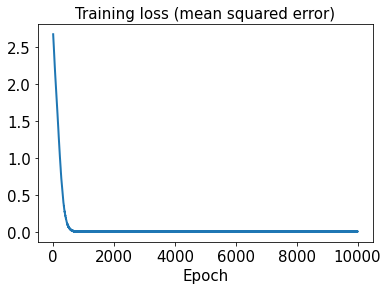

In [100]:
hist3 = history3.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

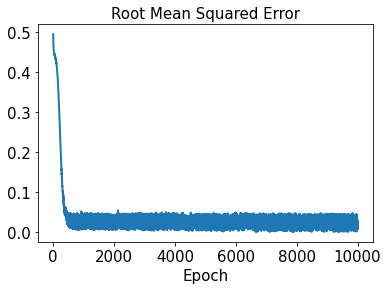

In [101]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [102]:
sd3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [103]:
start3 = datetime.datetime.now()
history3 = sd3.fit(x_train3, y_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 18ms/step - loss: 3.7000 - rmse: 1.9235
Epoch 2/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.6799 - rmse: 1.9183
Epoch 3/10000
2/2 [==============================] - 0s 32ms/step - loss: 3.6599 - rmse: 1.9131
Epoch 4/10000
2/2 [==============================] - 0s 18ms/step - loss: 3.6398 - rmse: 1.9078
Epoch 5/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6199 - rmse: 1.9026
Epoch 6/10000
2/2 [==============================] - 0s 18ms/step - loss: 3.6001 - rmse: 1.8974
Epoch 7/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5804 - rmse: 1.8922
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5609 - rmse: 1.8870
Epoch 9/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5414 - rmse: 1.8819
Epoch 10/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5220 - rmse: 1.8767
Epoch 11/10000
2/2 [=======================

2/2 [==============================] - 0s 7ms/step - loss: 2.3571 - rmse: 1.5353
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3469 - rmse: 1.5319
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3347 - rmse: 1.5279
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3231 - rmse: 1.5241
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3102 - rmse: 1.5199
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2991 - rmse: 1.5162
Epoch 92/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2892 - rmse: 1.5130
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2762 - rmse: 1.5087
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2660 - rmse: 1.5053
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2535 - rmse: 1.5011
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 1.5901 - rmse: 1.2609
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5827 - rmse: 1.2579
Epoch 172/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5760 - rmse: 1.2553
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5698 - rmse: 1.2528
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5623 - rmse: 1.2498
Epoch 175/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5559 - rmse: 1.2472
Epoch 176/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5550 - rmse: 1.2469
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5424 - rmse: 1.2418
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5375 - rmse: 1.2398
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5313 - rmse: 1.2373
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 1.1213 - rmse: 1.0588
Epoch 255/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1189 - rmse: 1.0576
Epoch 256/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1117 - rmse: 1.0542
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1072 - rmse: 1.0521
Epoch 258/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1029 - rmse: 1.0500
Epoch 259/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1020 - rmse: 1.0496
Epoch 260/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0974 - rmse: 1.0474
Epoch 261/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0914 - rmse: 1.0445
Epoch 262/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0871 - rmse: 1.0425
Epoch 263/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0827 - rmse: 1.0404
Epoch 264/10000
2/2 [========================

2/2 [==============================] - 0s 7ms/step - loss: 0.8195 - rmse: 0.9051
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8119 - rmse: 0.9008
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8133 - rmse: 0.9016
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8054 - rmse: 0.8972
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8001 - rmse: 0.8943
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7986 - rmse: 0.8934
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7950 - rmse: 0.8914
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7968 - rmse: 0.8925
Epoch 346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7880 - rmse: 0.8875
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7907 - rmse: 0.8890
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.5934 - rmse: 0.7701
Epoch 423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5929 - rmse: 0.7698
Epoch 424/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5881 - rmse: 0.7667
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5847 - rmse: 0.7644
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5814 - rmse: 0.7623
Epoch 427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5796 - rmse: 0.7611
Epoch 428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5792 - rmse: 0.7608
Epoch 429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5758 - rmse: 0.7586
Epoch 430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5743 - rmse: 0.7576
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5736 - rmse: 0.7571
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.4372 - rmse: 0.6610
Epoch 507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4329 - rmse: 0.6578
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4331 - rmse: 0.6579
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4291 - rmse: 0.6549
Epoch 510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4292 - rmse: 0.6549
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4265 - rmse: 0.6528
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4298 - rmse: 0.6553
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4241 - rmse: 0.6510
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4239 - rmse: 0.6509
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4184 - rmse: 0.6466
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.3088 - rmse: 0.5555
Epoch 591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3101 - rmse: 0.5566
Epoch 592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3139 - rmse: 0.5601
Epoch 593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3061 - rmse: 0.5531
Epoch 594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3077 - rmse: 0.5545
Epoch 595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3035 - rmse: 0.5507
Epoch 596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3040 - rmse: 0.5512
Epoch 597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3040 - rmse: 0.5511
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2989 - rmse: 0.5465
Epoch 599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3003 - rmse: 0.5477
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.2187 - rmse: 0.4674
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2123 - rmse: 0.4605
Epoch 676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2133 - rmse: 0.4616
Epoch 677/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2127 - rmse: 0.4609
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2111 - rmse: 0.4592
Epoch 679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2075 - rmse: 0.4553
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2072 - rmse: 0.4550
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2055 - rmse: 0.4531
Epoch 682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2137 - rmse: 0.4620
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2038 - rmse: 0.4512
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.1385 - rmse: 0.3719
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1376 - rmse: 0.3707
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1389 - rmse: 0.3725
Epoch 761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1387 - rmse: 0.3722
Epoch 762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1380 - rmse: 0.3712
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1360 - rmse: 0.3686
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1338 - rmse: 0.3656
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1363 - rmse: 0.3690
Epoch 766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1338 - rmse: 0.3656
Epoch 767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1383 - rmse: 0.3717
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 12ms/step - loss: 0.0950 - rmse: 0.3081
Epoch 843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0934 - rmse: 0.3054
Epoch 844/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0870 - rmse: 0.2948
Epoch 845/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0874 - rmse: 0.2955
Epoch 846/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0854 - rmse: 0.2920
Epoch 847/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0925 - rmse: 0.3040
Epoch 848/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0840 - rmse: 0.2895
Epoch 849/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0834 - rmse: 0.2886
Epoch 850/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0909 - rmse: 0.3014
Epoch 851/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0840 - rmse: 0.2896
Epoch 852/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0546 - rmse: 0.2335
Epoch 927/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0509 - rmse: 0.2254
Epoch 928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0517 - rmse: 0.2271
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0529 - rmse: 0.2298
Epoch 930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0498 - rmse: 0.2230
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0505 - rmse: 0.2244
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0521 - rmse: 0.2279
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0511 - rmse: 0.2259
Epoch 934/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0493 - rmse: 0.2218
Epoch 935/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0490 - rmse: 0.2211
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0284 - rmse: 0.1684
Epoch 1011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0287 - rmse: 0.1690
Epoch 1012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0315 - rmse: 0.1771
Epoch 1013/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0275 - rmse: 0.1654
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0289 - rmse: 0.1697
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0284 - rmse: 0.1683
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0283 - rmse: 0.1678
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0267 - rmse: 0.1631
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0282 - rmse: 0.1678
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0263 - rmse: 0.1618
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0230 - rmse: 0.1512
Epoch 1094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0158 - rmse: 0.1253
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0147 - rmse: 0.1208
Epoch 1096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0146 - rmse: 0.1203
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0187 - rmse: 0.1364
Epoch 1098/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0160 - rmse: 0.1261
Epoch 1099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0143 - rmse: 0.1190
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0142 - rmse: 0.1187
Epoch 1101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0178 - rmse: 0.1329
Epoch 1102/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0153 - rmse: 0.1232
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 1177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0970
Epoch 1179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 1180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.1011
Epoch 1181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0894
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0121 - rmse: 0.1097
Epoch 1183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0169 - rmse: 0.1297
Epoch 1184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0886
Epoch 1185/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0089 - rmse: 0.0938
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 1260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0749
Epoch 1262/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0625
Epoch 1263/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0713
Epoch 1264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 1265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0764
Epoch 1266/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0762
Epoch 1267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 1268/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0598
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0601
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0435
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0527
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0423
Epoch 1348/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0053 - rmse: 0.0722
Epoch 1349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0718
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0716
Epoch 1351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0625
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0607
Epoch 1427/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7846e-04 - rmse: 0.0300
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0421
Epoch 1431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0655
Epoch 1432/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8602e-04 - rmse: 0.0284
Epoch 1433/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 1434/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0882
Epoch 1435/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 1509/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1709e-04 - rmse: 0.0185
Epoch 1510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0447
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7623e-04 - rmse: 0.0200
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0412
Epoch 1514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0386
Epoch 1515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0854
Epoch 1516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0787
Epoch 1517/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2190e-04 - rmse: 0.0255
Epoch 1518/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 1591/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1631e-04 - rmse: 0.0156
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0781
Epoch 1593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 1594/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.8126e-04 - rmse: 0.0226
Epoch 1595/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 1596/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0655
Epoch 1597/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0363
Epoch 1598/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0680
Epoch 1599/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 1600/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0400
Epoch 1673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 1674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 1676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 1677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 1678/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6994e-04 - rmse: 0.0245
Epoch 1679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0848
Epoch 1680/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1682e-04 - rmse: 0.0157
Epoch 1681/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0176e-04 - rmse: 0.0231
Epoch 1682/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 1755/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 1756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 1757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3783e-04 - rmse: 0.0239
Epoch 1759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 1761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 1762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0929
Epoch 1763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 1764/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 1837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0518
Epoch 1838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0547
Epoch 1839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0399
Epoch 1840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0345
Epoch 1841/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.8076e-04 - rmse: 0.0203
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 1843/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0805e-04 - rmse: 0.0119
Epoch 1844/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4562e-04 - rmse: 0.0134
Epoch 1845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0436
Epoch 1846/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 4.4759e-04 - rmse: 0.0195
Epoch 1919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 1920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0592
Epoch 1921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 1922/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 1923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0680
Epoch 1924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0856
Epoch 1925/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9406e-04 - rmse: 0.0270
Epoch 1926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 1927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0685
Epoch 1928/10000
2/2 [=======

Epoch 2001/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8931e-04 - rmse: 0.0150
Epoch 2002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0564
Epoch 2003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0538
Epoch 2004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0672
Epoch 2005/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 2006/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3278e-04 - rmse: 0.0083
Epoch 2007/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 2008/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 2009/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2405e-04 - rmse: 0.0077
Epoch 2010/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1482e-04 - rmse: 0.0212

2/2 [==============================] - 0s 6ms/step - loss: 1.3913e-04 - rmse: 0.0087
Epoch 2084/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 2086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 2087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 2088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0318
Epoch 2089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0412
Epoch 2090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 2091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 2092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 2093/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 2166/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 2167/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0801
Epoch 2168/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0920
Epoch 2169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0386
Epoch 2170/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 2171/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5343e-04 - rmse: 0.0171
Epoch 2172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 2173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 2174/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0848
Epoch 2175/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 7.0723e-04 - rmse: 0.0254
Epoch 2248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0549
Epoch 2249/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 2250/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3057e-04 - rmse: 0.0217
Epoch 2251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 2252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 2253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 2254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0458
Epoch 2255/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6772e-04 - rmse: 0.0144
Epoch 2256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 2257/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0437
Epoch 2330/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0509
Epoch 2331/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 2332/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 2333/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 2334/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 2335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 2336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 2337/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 2338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0472
Epoch 2339/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 1.9470e-04 - rmse: 0.0117
Epoch 2413/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0362
Epoch 2414/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 2415/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8584e-04 - rmse: 0.0207
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 2417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 2418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0965
Epoch 2419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 2420/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8218e-04 - rmse: 0.0180
Epoch 2421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0538
Epoch 2422/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0917
Epoch 2496/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 2497/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1677e-04 - rmse: 0.0237
Epoch 2498/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 2499/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 2500/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 2501/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 2502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 2503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 2504/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 2505/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 2578/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0153e-04 - rmse: 0.0157
Epoch 2579/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 2580/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 2581/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 2582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 2583/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 2584/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 2585/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0768
Epoch 2586/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8909e-04 - rmse: 0.0116
Epoch 2587/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0448
Epoch 2660/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7404e-04 - rmse: 0.0249
Epoch 2661/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7475e-04 - rmse: 0.0149
Epoch 2662/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0567
Epoch 2663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 2664/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9295e-04 - rmse: 0.0118
Epoch 2665/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0912
Epoch 2666/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6710e-04 - rmse: 0.0146
Epoch 2667/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3600e-04 - rmse: 0.0090
Epoch 2668/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5187e-04 - rmse: 0.0099
Epoch 2669/10

Epoch 2742/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8108e-04 - rmse: 0.0181
Epoch 2743/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2329e-04 - rmse: 0.0277
Epoch 2744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0448
Epoch 2745/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8519e-04 - rmse: 0.0182
Epoch 2746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 2747/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 2748/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2278e-04 - rmse: 0.0083
Epoch 2749/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.6086e-04 - rmse: 0.0144
Epoch 2750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0671
Epoch 2751/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1696e-04 - rmse: 0.0

2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 2825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 2826/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 2827/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 2828/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0097 - rmse: 0.0984
Epoch 2829/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0469
Epoch 2830/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0539
Epoch 2831/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 2832/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 2833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 2834/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 5.4533e-04 - rmse: 0.0222
Epoch 2908/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 2909/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 2910/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 2911/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 2912/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2488e-04 - rmse: 0.0132
Epoch 2913/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 2914/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 2915/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 2916/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.5074e-04 - rmse: 0.0100
Epoch 2917/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 2990/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4964e-04 - rmse: 0.0100
Epoch 2991/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 2992/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 2993/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1897e-04 - rmse: 0.0192
Epoch 2994/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 2995/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4660e-04 - rmse: 0.0199
Epoch 2996/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3597e-04 - rmse: 0.0169
Epoch 2997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 2998/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 2999/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9353e-04 - rmse: 0.0120
Epoch 3073/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9495e-04 - rmse: 0.0157
Epoch 3074/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 3075/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 3076/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0592
Epoch 3077/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 3078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 3079/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 3080/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6388e-04 - rmse: 0.0227
Epoch 3081/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0708
Epoch 3155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 3156/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0050 - rmse: 0.0702
Epoch 3157/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3296e-04 - rmse: 0.0280
Epoch 3158/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 3159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 3160/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5483e-04 - rmse: 0.0201
Epoch 3161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 3162/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 3163/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0097 - rmse: 0.0982
Epoch 3164/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 3.9084e-04 - rmse: 0.0185
Epoch 3237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 3238/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 3239/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2532e-05 - rmse: 0.0020
Epoch 3240/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5620e-04 - rmse: 0.0202
Epoch 3241/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 3242/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 3243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 3244/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2465e-04 - rmse: 0.0296
Epoch 3245/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7772e-04 - rmse: 0.0182
Epoch 3246/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 3319/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7049e-04 - rmse: 0.0206
Epoch 3320/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3321/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 3322/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0425
Epoch 3323/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5250e-04 - rmse: 0.0143
Epoch 3324/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0472
Epoch 3325/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0531
Epoch 3326/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.5465e-05 - rmse: 0.0028
Epoch 3327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 3328/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 4.2563e-04 - rmse: 0.0195
Epoch 3401/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 3402/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0559
Epoch 3403/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 3404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 3405/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1055e-04 - rmse: 0.0215
Epoch 3406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 3407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 3408/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 3409/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2917e-04 - rmse: 0.0241
Epoch 3410/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 4.0538e-04 - rmse: 0.0190
Epoch 3483/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 3484/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0844
Epoch 3485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 3486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 3487/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0549
Epoch 3488/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 3489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 3490/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6764e-04 - rmse: 0.0149
Epoch 3491/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1419e-04 - rmse: 0.0130
Epoch 3492/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 1.6109e-04 - rmse: 0.0108
Epoch 3565/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 3566/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 3567/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9579e-04 - rmse: 0.0212
Epoch 3568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 3569/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0617
Epoch 3570/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1027e-04 - rmse: 0.0216
Epoch 3571/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 3572/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6171e-04 - rmse: 0.0204
Epoch 3573/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2254e-04 - rmse: 0.0088
Epoch 3574/10000


2/2 [==============================] - 0s 8ms/step - loss: 2.3596e-04 - rmse: 0.0138
Epoch 3647/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 3648/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 3649/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 3650/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 3651/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0649
Epoch 3652/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 3653/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 3654/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3505e-04 - rmse: 0.0095
Epoch 3655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0472
Epoch 3656/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 2.7248e-04 - rmse: 0.0151
Epoch 3729/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0052e-04 - rmse: 0.0160
Epoch 3730/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 3731/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.2591e-04 - rmse: 0.0261
Epoch 3732/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0704e-04 - rmse: 0.0215
Epoch 3733/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 3734/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3174e-04 - rmse: 0.0197
Epoch 3735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0858
Epoch 3736/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5773e-04 - rmse: 0.0204
Epoch 3737/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 3738/10

2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0642
Epoch 3811/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4326e-04 - rmse: 0.0245
Epoch 3812/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 3813/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 3814/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8764e-04 - rmse: 0.0291
Epoch 3815/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 3816/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 3817/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 3818/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0862
Epoch 3819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0550
Epoch 3820/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 9.7790e-04 - rmse: 0.0306
Epoch 3893/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 3894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0889
Epoch 3895/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 3896/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 3897/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 3898/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7368e-04 - rmse: 0.0288
Epoch 3899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 3900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 3901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 3902/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 3976/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 3977/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0814
Epoch 3978/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9456e-04 - rmse: 0.0274
Epoch 3979/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 3980/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4765e-04 - rmse: 0.0266
Epoch 3981/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3982/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 3983/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3015e-04 - rmse: 0.0243
Epoch 3984/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 3985/10000
2/2 [===

2/2 [==============================] - 0s 12ms/step - loss: 5.8865e-04 - rmse: 0.0234
Epoch 4058/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 4059/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 4060/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 4061/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 4063/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 4064/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 4065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 4066/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3557e-04 - rmse: 0.0199
Epoch 4067/10000
2/2 [===

Epoch 4140/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 4141/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 4142/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0716
Epoch 4143/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 4144/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 4145/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 4146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 4147/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 4148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 4149/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 4150/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 1.7231e-04 - rmse: 0.0115
Epoch 4223/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3471e-04 - rmse: 0.0172
Epoch 4226/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0450
Epoch 4227/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 4228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 4229/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 4230/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 4231/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 4232/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 1.6975e-04 - rmse: 0.0115
Epoch 4305/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 4306/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 4307/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9213e-04 - rmse: 0.0188
Epoch 4308/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 4309/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4310/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0672
Epoch 4311/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3497e-04 - rmse: 0.0098
Epoch 4312/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 4313/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 4314/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 4387/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 4388/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 4389/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8368e-04 - rmse: 0.0291
Epoch 4390/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9320e-04 - rmse: 0.0125
Epoch 4391/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 4392/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7563e-04 - rmse: 0.0154
Epoch 4393/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 4394/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4395/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 4396/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 8.0393e-04 - rmse: 0.0277
Epoch 4469/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4458e-04 - rmse: 0.0104
Epoch 4470/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 4471/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 4472/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 4473/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 4474/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 4475/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 4476/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4477/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1441e-04 - rmse: 0.0219
Epoch 4478/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 5.0080e-04 - rmse: 0.0216
Epoch 4551/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0094 - rmse: 0.0965
Epoch 4552/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 4553/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 4554/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.8581e-04 - rmse: 0.0158
Epoch 4555/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7962e-04 - rmse: 0.0120
Epoch 4556/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0082 - rmse: 0.0906
Epoch 4557/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 4558/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 4559/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 4560/10000


2/2 [==============================] - 0s 7ms/step - loss: 4.3117e-04 - rmse: 0.0199
Epoch 4633/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 4634/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 4635/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 4636/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0109e-04 - rmse: 0.0163
Epoch 4637/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1174e-04 - rmse: 0.0088
Epoch 4638/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 4639/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 4640/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2456e-04 - rmse: 0.0095
Epoch 4641/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5526e-04 - rmse: 0.0205
Epoch 4642/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 4715/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9695e-04 - rmse: 0.0310
Epoch 4716/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 4717/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 4718/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 4719/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 4720/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 4721/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 4722/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6803e-04 - rmse: 0.0153
Epoch 4723/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 4724/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 9.5960e-04 - rmse: 0.0304
Epoch 4797/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0642
Epoch 4798/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0100 - rmse: 0.0998
Epoch 4799/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 4800/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4801/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 4802/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 4803/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0715
Epoch 4804/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 4805/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 4806/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 4879/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 4880/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 4881/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 4882/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 4883/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 4884/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0796e-04 - rmse: 0.0087
Epoch 4885/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 4886/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7340e-04 - rmse: 0.0185
Epoch 4887/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 4888/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 4961/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 4962/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 4963/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 4964/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.8213e-04 - rmse: 0.0292
Epoch 4965/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 4966/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 4967/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 4968/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 4969/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 4970/10000
2/2 [===========

2/2 [==============================] - 0s 6ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 5043/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 5044/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 5045/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 5046/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.0127e-04 - rmse: 0.0217
Epoch 5047/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5048/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 5049/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 5050/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 5051/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 5052/10000
2/2 [===========

2/2 [==============================] - 0s 6ms/step - loss: 3.8004e-04 - rmse: 0.0187
Epoch 5125/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 5126/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.8665e-04 - rmse: 0.0213
Epoch 5127/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 5128/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6270e-04 - rmse: 0.0152
Epoch 5129/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6533e-04 - rmse: 0.0116
Epoch 5130/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 5131/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 5132/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.9610e-04 - rmse: 0.0191
Epoch 5133/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6501e-04 - rmse: 0.0153
Epoch 5134/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0672
Epoch 5207/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 5208/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 5209/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.2684e-04 - rmse: 0.0140
Epoch 5210/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 5211/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 5212/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 5213/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 5214/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 5215/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0942e-04 - rmse: 0.0134
Epoch 5216/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 5289/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 5290/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 5291/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0877e-04 - rmse: 0.0167
Epoch 5292/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 5293/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2368e-04 - rmse: 0.0171
Epoch 5294/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7236e-04 - rmse: 0.0156
Epoch 5295/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 5296/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3932e-04 - rmse: 0.0145
Epoch 5297/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2215e-04 - rmse: 0.0222
Epoch 5298/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 5371/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8519e-04 - rmse: 0.0189
Epoch 5372/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 5373/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 5374/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 5375/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 5376/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 5377/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0917
Epoch 5378/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 5379/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 5380/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0559
Epoch 5453/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 5454/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3466e-04 - rmse: 0.0225
Epoch 5455/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 5456/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2283e-04 - rmse: 0.0222
Epoch 5457/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4878e-04 - rmse: 0.0109
Epoch 5458/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 5459/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 5460/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 5461/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 5462/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 5535/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 5536/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 5537/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2910e-04 - rmse: 0.0142
Epoch 5538/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 5539/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1387e-04 - rmse: 0.0196
Epoch 5540/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 5541/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 5542/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 5543/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 5544/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 5617/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 5618/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1021e-04 - rmse: 0.0135
Epoch 5619/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 5620/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 5621/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2073e-05 - rmse: 0.0058
Epoch 5622/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 5623/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 5624/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 5625/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 5626/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 3.3648e-05 - rmse: 0.0024
Epoch 5699/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 5700/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 5701/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 5702/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 5703/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 5704/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6172e-04 - rmse: 0.0116
Epoch 5705/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7186e-04 - rmse: 0.0156
Epoch 5706/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 5707/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 5708/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 5781/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5061e-04 - rmse: 0.0229
Epoch 5782/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8509e-04 - rmse: 0.0293
Epoch 5783/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 5784/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 5785/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6050e-04 - rmse: 0.0115
Epoch 5786/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2657e-04 - rmse: 0.0173
Epoch 5787/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8747e-04 - rmse: 0.0127
Epoch 5788/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5323e-04 - rmse: 0.0150
Epoch 5789/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5863e-04 - rmse: 0.0152
Epoch 

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5863/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7385e-04 - rmse: 0.0157
Epoch 5864/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9955e-04 - rmse: 0.0131
Epoch 5865/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4889e-04 - rmse: 0.0205
Epoch 5866/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 5867/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9063e-04 - rmse: 0.0128
Epoch 5868/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 5869/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8885e-04 - rmse: 0.0162
Epoch 5870/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 5871/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 5872/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0979
Epoch 5945/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9684e-04 - rmse: 0.0311
Epoch 5946/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 5947/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4076e-04 - rmse: 0.0146
Epoch 5948/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 5949/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 5950/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 5951/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.7448e-04 - rmse: 0.0187
Epoch 5952/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1892e-04 - rmse: 0.0281
Epoch 5953/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 5954/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 6027/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 6028/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 6029/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9027e-04 - rmse: 0.0191
Epoch 6030/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 6031/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 6032/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 6033/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 6034/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1031e-04 - rmse: 0.0136
Epoch 6035/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1261e-04 - rmse: 0.0221
Epoch 6036/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0707
Epoch 6110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 6111/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6112/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 6113/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 6114/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0917
Epoch 6115/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 6116/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 6117/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 6118/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0688
Epoch 6119/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 6192/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 6193/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6194/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 6195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 6196/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0350
Epoch 6197/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 6198/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 6199/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8852e-04 - rmse: 0.0162
Epoch 6200/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 6201/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6275/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 6276/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5407e-04 - rmse: 0.0230
Epoch 6277/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 6278/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2993e-04 - rmse: 0.0201
Epoch 6279/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9464e-04 - rmse: 0.0130
Epoch 6280/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 6281/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 6282/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 6283/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 6284/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 1.3911e-04 - rmse: 0.0107
Epoch 6357/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7625e-04 - rmse: 0.0187
Epoch 6358/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 6359/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 6360/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.9486e-04 - rmse: 0.0192
Epoch 6361/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8186e-04 - rmse: 0.0125
Epoch 6362/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 6363/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 6364/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2121e-05 - rmse: 0.0076
Epoch 6365/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 6366/10000


2/2 [==============================] - 0s 9ms/step - loss: 3.2770e-04 - rmse: 0.0174
Epoch 6439/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 6440/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 6441/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 6442/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 6443/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 6444/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 6445/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6446/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 6447/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 6448/10000
2/2 [======

Epoch 6521/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5834e-05 - rmse: 0.0033
Epoch 6522/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4725e-04 - rmse: 0.0180
Epoch 6523/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 6524/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9354e-04 - rmse: 0.0311
Epoch 6525/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6526/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 6527/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 6528/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 6529/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0532
Epoch 6530/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1742e-04 - rmse: 0.0096
Epoc

2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 6604/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 6605/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 6606/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 6607/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 6608/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 6609/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0776
Epoch 6610/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 6611/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 6612/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 6613/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 6686/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 6687/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 6688/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4518e-04 - rmse: 0.0205
Epoch 6689/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 6690/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4938e-04 - rmse: 0.0229
Epoch 6691/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6927e-04 - rmse: 0.0121
Epoch 6692/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 6693/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 6694/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9948e-04 - rmse: 0.0240
Epoch 6695/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0716
Epoch 6768/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0721
Epoch 6769/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.9367e-04 - rmse: 0.0295
Epoch 6770/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7033e-04 - rmse: 0.0273
Epoch 6771/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 6772/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 6773/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0912e-04 - rmse: 0.0262
Epoch 6774/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 6775/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0862
Epoch 6776/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 6777/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 4.6048e-05 - rmse: 0.0047
Epoch 6850/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1145e-04 - rmse: 0.0094
Epoch 6851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 6852/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 6853/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 6854/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 6855/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 6856/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 6857/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4708e-04 - rmse: 0.0304
Epoch 6858/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 6859/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0868
Epoch 6933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 6934/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2682e-04 - rmse: 0.0283
Epoch 6935/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0946e-04 - rmse: 0.0262
Epoch 6936/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 6937/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4406e-04 - rmse: 0.0286
Epoch 6938/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6939/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 6940/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 6941/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 7014/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7750e-04 - rmse: 0.0213
Epoch 7015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 7016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 7017/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2513e-04 - rmse: 0.0265
Epoch 7018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 7019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 7020/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 7021/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5239e-04 - rmse: 0.0251
Epoch 7022/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 7023/10000
2/2 [===

2/2 [==============================] - 0s 13ms/step - loss: 8.1466e-04 - rmse: 0.0281
Epoch 7096/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 7097/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 7098/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 7099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 7100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 7101/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7102/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 7103/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 7104/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 7105/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 7179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 7180/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.4608e-04 - rmse: 0.0229
Epoch 7181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 7182/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 7183/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0796
Epoch 7184/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5257e-04 - rmse: 0.0251
Epoch 7185/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 7186/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1173e-04 - rmse: 0.0298
Epoch 7187/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 7188/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 7261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 7262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 7263/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9291e-04 - rmse: 0.0192
Epoch 7264/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8068e-04 - rmse: 0.0257
Epoch 7265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 7266/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 7267/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 7268/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 7269/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 7270/10000
2/2 [=======

Epoch 7343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 7344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 7345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 7347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 7348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 7350/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 7351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 7352/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 7353/10000
2/2

Epoch 7426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 7427/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4968e-04 - rmse: 0.0251
Epoch 7428/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7689e-04 - rmse: 0.0188
Epoch 7429/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0855
Epoch 7431/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7673e-04 - rmse: 0.0160
Epoch 7432/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 7433/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 7434/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0760e-04 - rmse: 0.0262
Epoch 7435/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0663
Epoc

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 7509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 7512/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6537e-04 - rmse: 0.0185
Epoch 7513/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0849e-04 - rmse: 0.0093
Epoch 7514/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2069e-04 - rmse: 0.0141
Epoch 7515/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 7516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7518/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 7591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 7592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 7593/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0217e-04 - rmse: 0.0134
Epoch 7594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 7595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7596/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2991e-04 - rmse: 0.0104
Epoch 7597/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9312e-04 - rmse: 0.0278
Epoch 7598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 7599/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6566e-04 - rmse: 0.0273
Epoch 7600/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 6.1336e-04 - rmse: 0.0243
Epoch 7673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 7674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 7675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 7676/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4651e-04 - rmse: 0.0250
Epoch 7677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 7678/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7256e-04 - rmse: 0.0212
Epoch 7679/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4560e-04 - rmse: 0.0180
Epoch 7680/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4719e-04 - rmse: 0.0269
Epoch 7681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 7682/10000


2/2 [==============================] - 0s 8ms/step - loss: 2.8681e-04 - rmse: 0.0163
Epoch 7755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 7756/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0829e-04 - rmse: 0.0169
Epoch 7757/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9401e-04 - rmse: 0.0165
Epoch 7758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 7759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 7760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 7761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 7762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 7763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 7764/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 7837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 7838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 7839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 7840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 7841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 7842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 7843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 7844/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5283e-04 - rmse: 0.0208
Epoch 7845/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6662e-04 - rmse: 0.0211
Epoch 7846/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 7919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 7920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 7922/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 7923/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 7924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 7925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 7926/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7414e-04 - rmse: 0.0159
Epoch 7927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 7928/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 8002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 8003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 8004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 8005/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 8006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 8007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 8008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 8009/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1785e-04 - rmse: 0.0264
Epoch 8010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 8011/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 8084/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 8085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 8086/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2904e-05 - rmse: 0.0085
Epoch 8087/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3835e-04 - rmse: 0.0148
Epoch 8088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 8089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 8090/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.7326e-05 - rmse: 0.0082
Epoch 8091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 8092/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2587e-04 - rmse: 0.0103
Epoch 8093/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0700
Epoch 8166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 8167/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2921e-04 - rmse: 0.0247
Epoch 8168/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3704e-04 - rmse: 0.0227
Epoch 8169/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 8170/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5622e-04 - rmse: 0.0209
Epoch 8171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0858
Epoch 8172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 8173/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2237e-04 - rmse: 0.0201
Epoch 8174/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.0734e-04 - rmse: 0.0242
Epoch 8175/10000

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 8249/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 8250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 8251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 8252/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3082e-04 - rmse: 0.0105
Epoch 8253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 8254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 8256/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9156e-04 - rmse: 0.0278
Epoch 8257/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2074e-04 - rmse: 0.0142
Epoch 8258/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 6.4655e-04 - rmse: 0.0250
Epoch 8332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0857
Epoch 8334/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 8335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 8336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 8337/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0257e-04 - rmse: 0.0196
Epoch 8338/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5975e-04 - rmse: 0.0210
Epoch 8339/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 8340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 8341/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 8414/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 8415/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 8416/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5596e-04 - rmse: 0.0117
Epoch 8417/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8418/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 8419/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 8420/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 8421/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8476e-04 - rmse: 0.0163
Epoch 8422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 8423/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 8496/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 8497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 8498/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7608e-04 - rmse: 0.0214
Epoch 8499/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1526e-04 - rmse: 0.0098
Epoch 8500/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1717e-04 - rmse: 0.0099
Epoch 8501/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2132e-04 - rmse: 0.0300
Epoch 8502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 8503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 8504/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 8505/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 2.7933e-04 - rmse: 0.0161
Epoch 8578/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 8579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8581/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6702e-04 - rmse: 0.0291
Epoch 8582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 8583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 8584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 8585/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 8586/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3498e-04 - rmse: 0.0286
Epoch 8587/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8661/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 8662/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9792e-04 - rmse: 0.0195
Epoch 8663/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7186e-04 - rmse: 0.0213
Epoch 8664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8665/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.5889e-04 - rmse: 0.0210
Epoch 8666/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0650e-05 - rmse: 0.0056
Epoch 8667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 8668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 8669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 8670/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 8743/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7447e-04 - rmse: 0.0256
Epoch 8744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0862
Epoch 8745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0925
Epoch 8746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 8747/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 8748/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 8749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 8750/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 8751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8752/10000
2/2 [===========

Epoch 8825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 8826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 8827/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 8828/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8829/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 8831/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 8832/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0108 - rmse: 0.1039
Epoch 8833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 8834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 8835/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 8908/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 8909/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 8910/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8911/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1316e-04 - rmse: 0.0097
Epoch 8912/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2984e-04 - rmse: 0.0226
Epoch 8913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 8914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8915/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 8916/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7907e-04 - rmse: 0.0127
Epoch 8917/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 8990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 8991/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5974e-04 - rmse: 0.0185
Epoch 8992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 8993/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4235e-04 - rmse: 0.0250
Epoch 8994/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 8995/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 8996/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 8997/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7547e-04 - rmse: 0.0160
Epoch 8998/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3145e-04 - rmse: 0.0177
Epoch 8999/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 9072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 9073/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 9074/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 9075/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 9076/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 9077/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6902e-04 - rmse: 0.0255
Epoch 9078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 9079/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 9080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9081/10000
2/2 [===========

Epoch 9154/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 9155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 9156/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 9157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 9158/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 9159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 9160/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 9161/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0527e-04 - rmse: 0.0169
Epoch 9162/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 9163/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5230e-04 - rmse: 0.0116
Epoch 9164/1

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 9237/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8293e-04 - rmse: 0.0128
Epoch 9238/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 9239/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 9240/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 9241/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 9242/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 9243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 9244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 9245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 9246/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 9320/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 9321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 9322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 9323/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 9324/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9292e-04 - rmse: 0.0260
Epoch 9325/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 9326/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0074 - rmse: 0.0856
Epoch 9327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 9328/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 9329/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 9402/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 9403/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 9404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 9405/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 9406/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8652e-05 - rmse: 0.0055
Epoch 9407/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 9408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 9409/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5597e-04 - rmse: 0.0154
Epoch 9410/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9141e-04 - rmse: 0.0278
Epoch 9411/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 7.9862e-04 - rmse: 0.0279
Epoch 9484/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1376e-04 - rmse: 0.0299
Epoch 9485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 9486/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 9487/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9488/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 9489/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7124e-04 - rmse: 0.0275
Epoch 9490/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 9491/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 9492/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 9493/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 4.5033e-04 - rmse: 0.0208
Epoch 9566/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 9567/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0901e-04 - rmse: 0.0171
Epoch 9568/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 9569/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0861e-04 - rmse: 0.0138
Epoch 9570/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4462e-04 - rmse: 0.0181
Epoch 9571/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 9572/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9875e-04 - rmse: 0.0135
Epoch 9573/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0296e-04 - rmse: 0.0169
Epoch 9574/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3131e-05 - rmse: 0.0060
Epoch 957

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 9648/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 9649/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 9650/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9764e-04 - rmse: 0.0134
Epoch 9651/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.0395e-04 - rmse: 0.0093
Epoch 9652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 9653/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5715e-04 - rmse: 0.0118
Epoch 9654/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9120e-04 - rmse: 0.0218
Epoch 9655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 9656/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4158e-04 - rmse: 0.0287
Epoch 9657/10000


2/2 [==============================] - 0s 8ms/step - loss: 3.7779e-04 - rmse: 0.0190
Epoch 9730/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 9731/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 9732/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 9733/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9734/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 9735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 9736/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 9737/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 9738/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 9739/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9812/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 9813/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 9814/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9317e-04 - rmse: 0.0194
Epoch 9815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 9816/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 9817/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2997e-04 - rmse: 0.0302
Epoch 9818/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 9819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 9820/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 9821/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 9894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 9895/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7393e-04 - rmse: 0.0160
Epoch 9896/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 9897/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 9898/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.9937e-04 - rmse: 0.0196
Epoch 9899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0980
Epoch 9900/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 9901/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 9902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 9903/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0070 - rmse: 0.0838
Epoch 9976/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 9977/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 9978/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6197e-04 - rmse: 0.0120
Epoch 9979/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 9980/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 9981/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 9982/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1789e-04 - rmse: 0.0101
Epoch 9983/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 9984/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0943e-04 - rmse: 0.0198
Epoch 9985/10000
2/2 [===

In [104]:
time3 = end3 - start3
print("Training time (Case 3):", time3)

Training time (Case 3): 0:02:55.534333


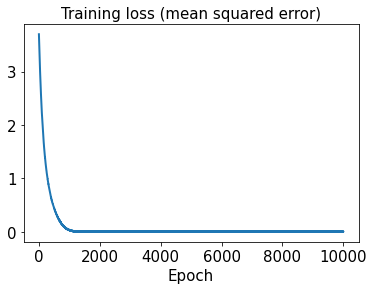

In [105]:
hist3 = history3.history
plt.plot(hist3['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

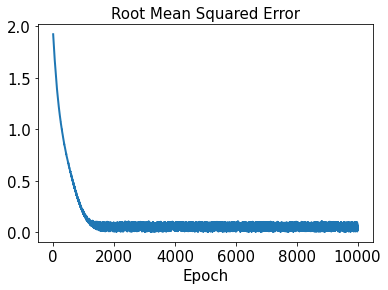

In [106]:
plt.plot(hist3['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [107]:
test_results3 = sd3.evaluate(x_test3)

1/1 [==============================] - 0s 79ms/step - loss: 1.6701e-05 - rmse: 0.0000e+00


In [108]:
decoded_sensor_train3 = sensor_pred3.predict(t_train)

In [109]:
decoded_sensor_test3 = sensor_pred3.predict(t_test)

In [110]:
decoded_train3 = sd3.predict(decoded_sensor_train3)

In [111]:
decoded_test3 = sd3.predict(decoded_sensor_test3)

In [112]:
error_train_abs3 = np.abs(decoded_train3 - y_train3)

In [113]:
error_test_abs3 = np.abs(decoded_test3 - y_test3)

In [114]:
l2_error_train3 = np.sqrt(np.sum((decoded_train3 - y_train3)**2) / np.sum(y_train3**2))
print(l2_error_train3)

0.2152747468811976


In [115]:
l2_error_test3 = np.sqrt(np.sum((decoded_test3 - y_test3)**2) / np.sum(y_test3**2))
print(l2_error_test3)

0.19132176036628384


In [116]:
l2_error_train_list3 = []
for i in range(0, len(x_train3)):
    l2_error_train_data3 = np.sqrt(np.sum((decoded_train3[i] - y_train3[i])**2) / np.sum(y_train3[i]**2))
    l2_error_train_list3.append(l2_error_train_data3)
print(l2_error_train_list3)

[0.02202590592995838, 0.23617461397708583, 0.00864658875548503, 0.15393288338706632, 0.07642553192024513, 0.18671224824163254, 0.11124732373956853, 0.05751272930660101, 0.09438143247203805, 0.09988745484814271, 0.0856021316177697, 0.34839743408753615, 0.011333876805905946, 0.2623962065743911, 0.16549364290003984, 0.3508242427925392, 0.03244442862964504, 0.008528592126545003, 0.35201121926893925, 0.04435132559746612, 0.13245307938121206, 0.32386406894940617, 0.11548585506334226, 0.030797788946232422, 0.07185444109889724, 0.17672886135123703, 0.033109668432484946, 0.06861805607797614, 0.02054612168881431, 0.21930492308185598, 0.12677568791821234, 0.004256474728386229, 0.15084883147614145]


In [117]:
l2_error_test_list3 = []
for i in range(0, len(x_test3)):
    l2_error_test_data3 = np.sqrt(np.sum((decoded_test3[i] - y_test3[i])**2) / np.sum(y_test3[i]**2))
    l2_error_test_list3.append(l2_error_test_data3)
print(l2_error_test_list3)

[0.01738790776502321, 0.14104109403516327, 0.2049249489107259, 0.004279402791861799, 0.2942801966832604, 0.19217027669766054, 0.04449384087938208, 0.17073323959850387]


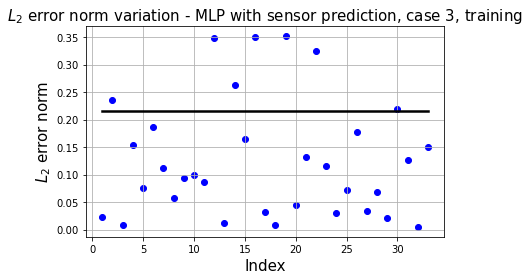

In [118]:
plt.plot(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train3*np.ones(x_train3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

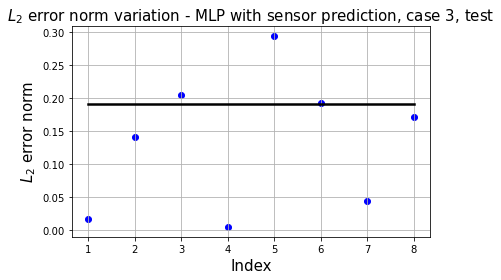

In [119]:
plt.plot(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test3*np.ones(x_test3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

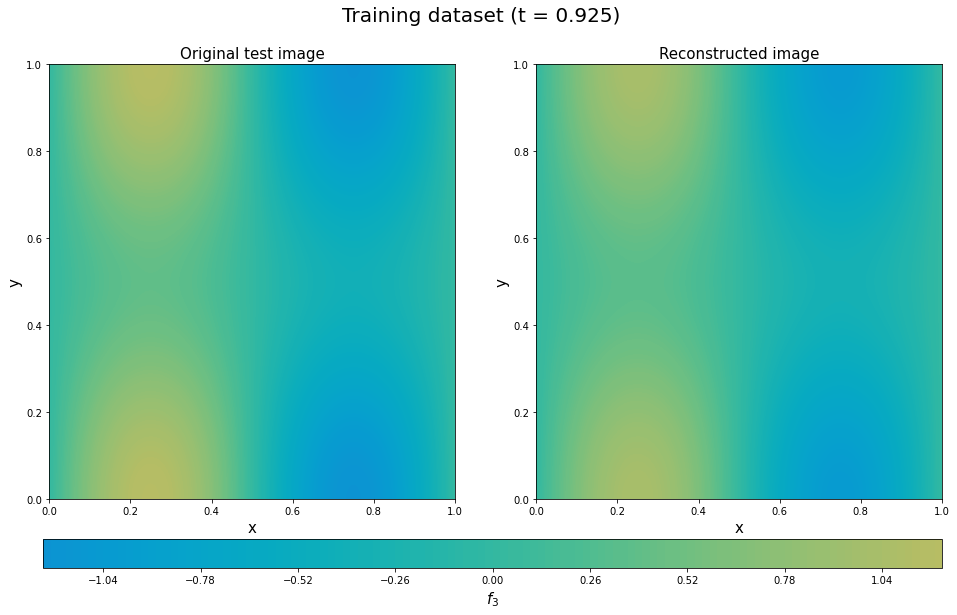

In [120]:
plt.figure(figsize=(16, 8))
y_train3_20_rotate = y_train3[20].T.reshape(101,101)
decoded_rotate3 = decoded_train3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_20_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[37]),fontsize=20)
plt.show()

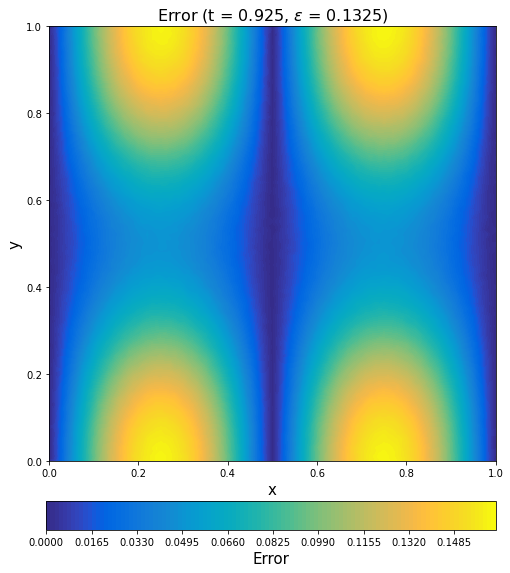

In [121]:
error_train_abs3_rotate20 = error_train_abs3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate20, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.925, $\epsilon$ = %.4f)' %(l2_error_train_list3[20]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

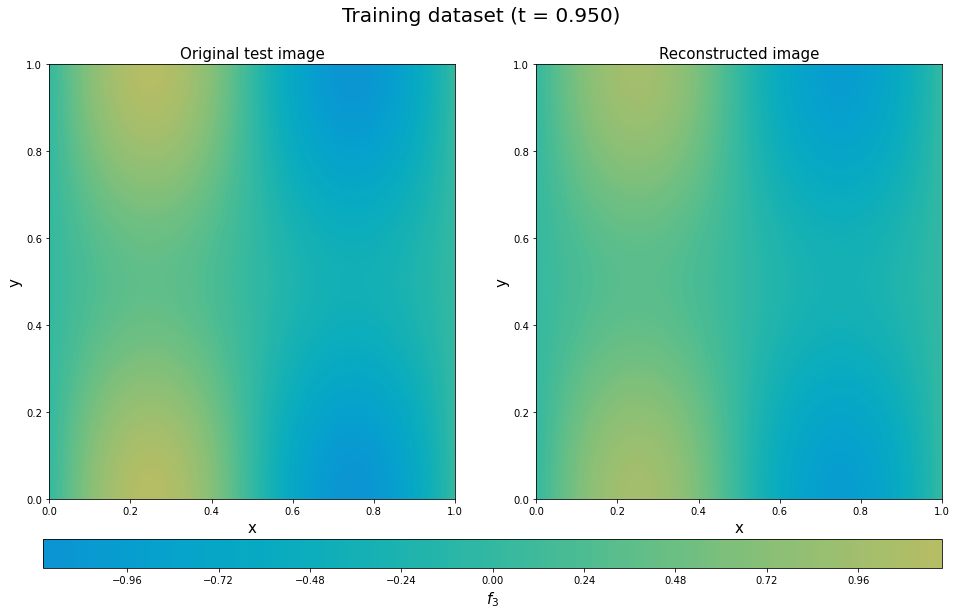

In [122]:
plt.figure(figsize=(16, 8))
y_train3_32_rotate = y_train3[32].T.reshape(101,101)
decoded_rotate3 = decoded_train3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_32_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[38]), fontsize=20)
plt.show()

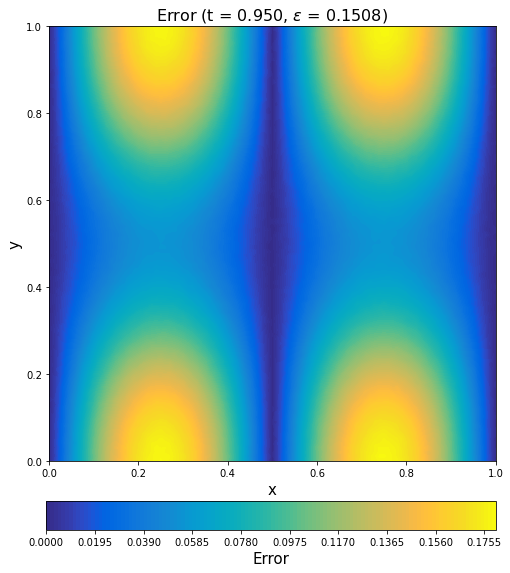

In [123]:
error_train_abs3_rotate32 = error_train_abs3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate32, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.950, $\epsilon$ = %.4f)' %(l2_error_train_list3[32]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

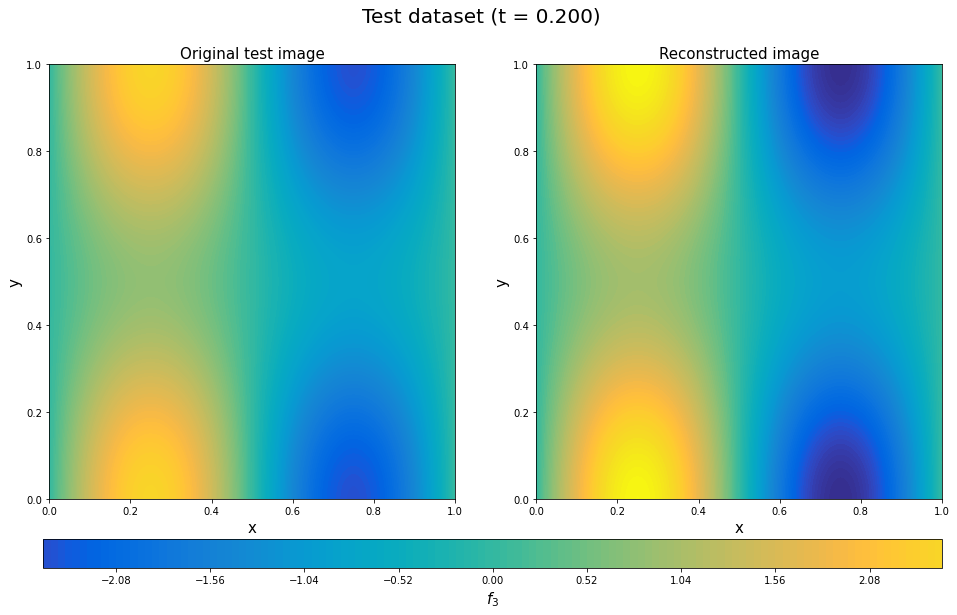

In [124]:
plt.figure(figsize=(16, 8))
y_test3_2_rotate = y_test3[2].T.reshape(101,101)
decoded_rotate3 = decoded_test3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

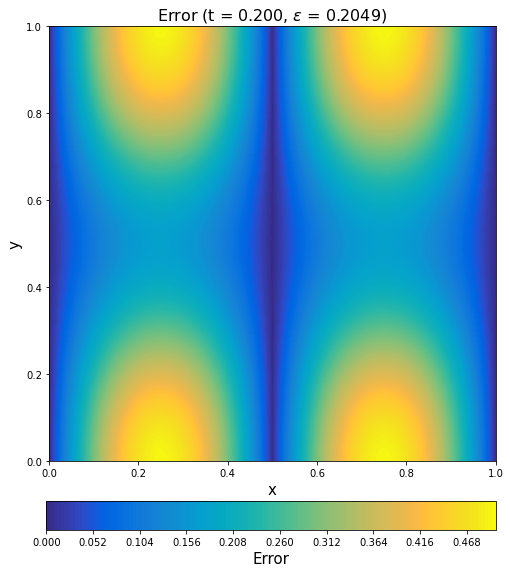

In [125]:
error_test_abs3_rotate2 = error_test_abs3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list3[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

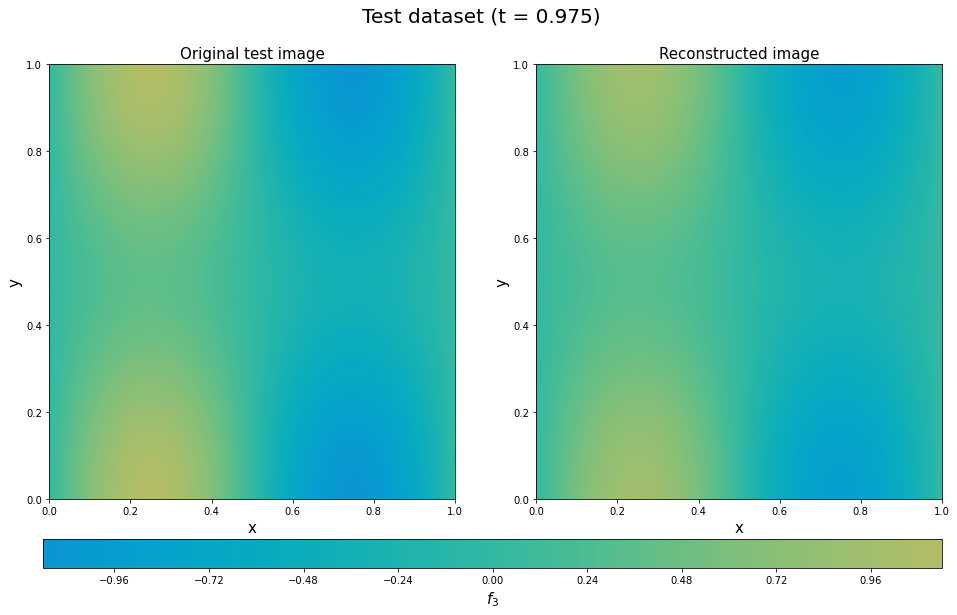

In [126]:
plt.figure(figsize=(16, 8))
y_test3_7_rotate = y_test3[7].T.reshape(101,101)
decoded_rotate3 = decoded_test3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_7_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[39]),fontsize=20)
plt.show()

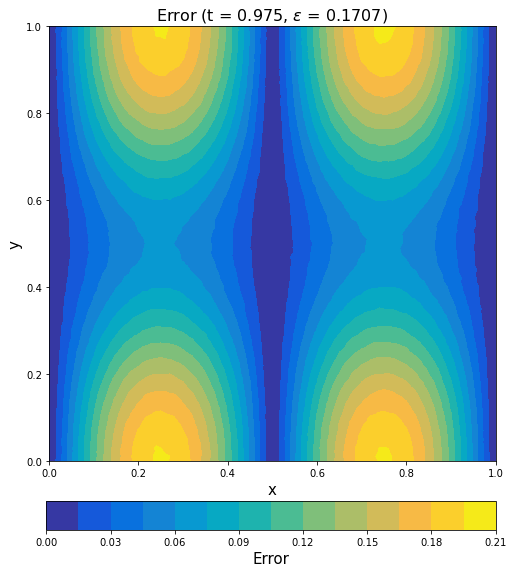

In [127]:
error_test_abs3_rotate7 = error_test_abs3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate7, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.975, $\epsilon$ = %.4f)' %(l2_error_test_list3[7]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()